In [1]:
# PROJET3_DATA_SCIENTIST_OCR
import os
os.chdir('C://Users//yebel//Desktop//OPENCLASSROOMS//FORMATION_DATA_SCIENTIST//PROJETS_DS_OCR//OCR_DS_P3_Concevez_Application_Au_Service_Santé_Public')

In [2]:
# 1-Chargement des Librairies Utilisées.
import pandas as pd
import numpy as np
import seaborn as sns
import os
import io
import joblib
import ppscore as pps
import math
import warnings
warnings.filterwarnings('ignore')
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.pyplot import figure
from statsmodels.graphics.gofplots import qqplot
import plotly.express  as  px
%matplotlib inline
import missingno as msno
import collections
from scipy.stats import variation
import scipy.stats as stats
from scipy.stats import shapiro, normaltest, anderson
from scipy.stats.stats import pearsonr
from scipy.stats import f_oneway, kruskal, rankdata
from sklearn import decomposition
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from scipy.stats import chi2_contingency
from sklearn.cluster import KMeans
from functions import *
from P3_Analysis_functions import *
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import SilhouetteVisualizer
plt.rcParams['figure.facecolor']='w'

In [3]:
# Optimisation automatique des colonnes pour avoir un maximum d'information.
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 1000)

In [4]:
# Setting your choice to save figures or not
plot_enabled = True

In [5]:
# 2-IMPORTATION DES DONNEES. fr.openfoodfacts.org.products.csv
data = pd.read_csv('DONNEES/data_cleans_finale.csv', delimiter=',')
# Visualisation du Dataset.
data

,code,product_name,packaging_tags,brands_tags,origins_tags,manufacturing_places_tags,labels_tags,countries,countries_tags,traces_tags,additives_tags,ingredients_from_palm_oil_tags,ingredients_that_may_be_from_palm_oil_tags,nutrition-score-fr_100g,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,Gluten,nutriscore_grade
0,36252,Lion Peanut x2,autre,autre,autre,autre,autre,"France, US",france,autre,E322/E322I,autre,autre,22.0,e,unknown,unknown,1883.0,20.0,12.50,70.00,57.50,2.500,2.500,0.09652,0.038000,0,E
1,40608754,"Pepsi, Nouveau goût !",autre,autre,autre,autre,autre,France,france,autre,autre,autre,autre,13.0,e,Beverages,Sweetened beverages,177.0,0.0,0.00,10.40,10.40,0.000,0.000,0.02540,0.010000,0,D
2,87177756,7Up,autre,autre,autre,autre,autre,France,france,autre,E330,autre,autre,13.0,e,Beverages,Sweetened beverages,177.0,0.0,0.00,10.40,10.40,0.750,0.000,0.10000,0.039370,0,D
3,10,Madeleines nature,plastique,autre,autre,autre,autre,France,france,arachides,autre,autre,E471,12.0,d,Sugary snacks,Biscuits and cakes,1900.0,23.0,2.50,55.00,26.00,1.500,6.000,0.66000,0.259843,0,D
4,30,Cakes Raisins,plastique,autre,autre,france,recyclable,France,france,arachides,autre,autre,E471,13.0,d,Sugary snacks,Biscuits and cakes,1768.0,19.0,2.50,56.00,28.00,1.800,5.800,0.65000,0.255906,0,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36582,9556587103869,Mini Paratha,carton,autre,autre,autre,sans conservateur,France,france,lait,autre,huile-de-palme,autre,10.0,c,Cereals and potatoes,Bread,1309.0,15.0,9.00,41.40,5.10,6.500,6.000,0.90000,0.354331,0,C
36583,9577283844672,100% Pur Jus 4 agrumes,plastique,cora,autre,autre,recyclable,France,france,autre,autre,autre,autre,4.0,c,Beverages,Fruit juices,192.0,0.5,0.00,10.20,9.20,0.600,0.600,0.03000,0.011811,0,C
36584,96068779,Spearmint sans sucres,plastique,autre,autre,autre,autre,France,france,autre,autre,autre,autre,4.0,c,Sugary snacks,Sweets,1017.0,1.3,1.28,95.87,0.12,0.005,0.040,0.00500,0.001969,0,C
36585,96118580,Fisherman's Friend Miel-Citron,plastique,autre,autre,autre,autre,France,france,autre,E330,autre,autre,2.0,b,Sugary snacks,Sweets,1031.0,1.3,1.28,95.31,0.10,1.470,0.004,0.00100,0.000394,0,B


In [6]:
# Fonction Décrivant les Informations Générales Contenues Dans le Dataset.
def general_info(dataframe):
  dataframe.info()
  print(" ")
  print(" ")
  print(" ")

  lignes = dataframe.shape[0] 
  colonnes = dataframe.shape[1]
  print("Le jeu de données a {} lignes et {} colonnes.".format(lignes,colonnes))

In [7]:
# Application de la Fonction au Dataset.
general_info(data)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36587 entries, 0 to 36586
Data columns (total 28 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   code                                        36587 non-null  int64  
 1   product_name                                36587 non-null  object 
 2   packaging_tags                              36587 non-null  object 
 3   brands_tags                                 36587 non-null  object 
 4   origins_tags                                36587 non-null  object 
 5   manufacturing_places_tags                   36587 non-null  object 
 6   labels_tags                                 36587 non-null  object 
 7   countries                                   36587 non-null  object 
 8   countries_tags                              36587 non-null  object 
 9   traces_tags                                 36587 non-null  object 
 10  additives_

In [8]:
# Le Dataset nettoyé a 32636  lignes et 27 colonnes. Aucune données manquante.

In [9]:
# Homogénéisation des types pour les colonnes.

for i, c in enumerate(data.columns):
    print('\n'+c if i % 6 == 0 else c, end=' | ')


code | product_name | packaging_tags | brands_tags | origins_tags | manufacturing_places_tags | 
labels_tags | countries | countries_tags | traces_tags | additives_tags | ingredients_from_palm_oil_tags | 
ingredients_that_may_be_from_palm_oil_tags | nutrition-score-fr_100g | nutrition_grade_fr | pnns_groups_1 | pnns_groups_2 | energy_100g | 
fat_100g | saturated-fat_100g | carbohydrates_100g | sugars_100g | fiber_100g | proteins_100g | 
salt_100g | sodium_100g | Gluten | nutriscore_grade | 

In [10]:
# Fonction qui nettoie de DataFrame.
def nettoyage_types(dataframe):
  category_features = ['ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr', 'nutriscore_grade']
  bool_features = ['ingredients_that_may_be_from_palm_oil']
  float_features = ['cities', 'allergens_en', 'serving_quantity', 'no_nutriments', 'additives_n', 'ingredients_from_palm_oil_n', 'ingredients_from_palm_oil', 'ingredients_that_may_be_from_palm_oil', 'energy_100g', 'energy-from-fat_100g', 'graisses_100g', 'graisses_saturees_100g', 'butyric-acid_100g', 'caproic-acid_100g', 'caprylic-acid_100g', 'capric-acid_100g', 'lauric-acid_100g', 'myristic-acid_100g', 'palmitic-acid_100g', 'stearic-acid_100g', 'arachidic-acid_100g', 'behenic-acid_100g', 'lignoceric-acid_100g', 'cerotic-acid_100g', 'montanic-acid_100g', 'melissic-acid_100g', 'monounsaturated-fat_100g', 'polyunsaturated-fat_100g', 'omega-3-fat_100g', 'alpha-linolenic-acid_100g', 'eicosapentaenoic-acid_100g', 'docosahexaenoic-acid_100g', 'omega-6-fat_100g', 'linoleic-acid_100g', 'arachidonic-acid_100g', 'gamma-linolenic-acid_100g', 'dihomo-gamma-linolenic-acid_100g', 'omega-9-fat_100g', 'oleic-acid_100g', 'elaidic-acid_100g', 'gondoic-acid_100g', 'mead-acid_100g', 'erucic-acid_100g', 'nervonic-acid_100g', 'trans-fat_100g', 'cholesterol_100g', 'glucides_100g', 'sucres_100g', 'sucrose_100g', 'glucose_100g', 'fructose_100g', 'lactose_100g', 'maltose_100g', 'maltodextrins_100g', 'starch_100g', 'polyols_100g', 'fiber_100g', 'proteines_100g', 'casein_100g', 'serum-proteins_100g', 'nucleotides_100g', 'sel_100g', 'sodium_100g', 'alcohol_100g', 'vitamin-a_100g', 'beta-carotene_100g', 'vitamin-d_100g', 'vitamin-e_100g', 'vitamin-k_100g', 'vitamin-c_100g', 'vitamin-b1_100g', 'vitamin-b2_100g', 'vitamin-pp_100g', 'vitamin-b6_100g', 'vitamin-b9_100g', 'folates_100g', 'vitamin-b12_100g', 'biotin_100g', 'pantothenic-acid_100g', 'silica_100g', 'bicarbonate_100g', 'potassium_100g', 'chloride_100g', 'calcium_100g', 'phosphorus_100g', 'iron_100g', 'magnesium_100g', 'zinc_100g', 'copper_100g', 'manganese_100g', 'fluoride_100g', 'selenium_100g', 'chromium_100g', 'molybdenum_100g', 'iodine_100g', 'caffeine_100g', 'taurine_100g', 'ph_100g', 'fruits-vegetables-nuts_100g', 'fruits-vegetables-nuts-dried_100g', 'fruits-vegetables-nuts-estimate_100g', 'collagen-meat-protein-ratio_100g', 'cocoa_100g', 'chlorophyl_100g', 'carbon-footprint_100g', 'carbon-footprint-from-meat-or-fish_100g', 'nutrition-score-fr_100g', 'nutrition-score-uk_100g', 'glycemic-index_100g', 'water-hardness_100g', 'choline_100g', 'phylloquinone_100g', 'beta-glucan_100g', 'inositol_100g', 'carnitine_100g']
  object_features = ['code', 'url', 'cities', 'creator', 'product_name', 'generic_name', 'quantity', 'packaging', 'packaging_tags', 'brands', 'brands_tags', 'categories', 'categories_tags', 'categories_en', 'origins', 'origins_tags', 'manufacturing_places', 'manufacturing_places_tags', 'labels', 'labels_tags', 'labels_en', 'emb_codes', 'emb_codes_tags', 'first_packaging_code_geo', 'cities_tags', 'purchase_places', 'stores', 'countries', 'countries_tags', 'countries_en', 'ingredients_text', 'allergens', 'traces', 'traces_tags', 'traces_en', 'serving_size', 'additives', 'additives_tags', 'additives_en', 'nutrition_grade_fr', 'pnns_groups_1', 'pnns_groups_2', 'states', 'states_tags', 'states_en', 'main_category', 'main_category_en', 'image_url', 'image_small_url', 'image_ingredients_url', 'image_ingredients_small_url', 'image_nutrition_url', 'image_nutrition_small_url']
  int_features = ['Gluten'] 

  for feature in category_features:
    if feature in dataframe.columns.to_list() :
      dataframe[feature] = dataframe[feature].astype('category')

  for feature in bool_features:
    if feature in dataframe.columns.to_list() :
      dataframe[feature] = dataframe[feature].astype('bool')

  for feature in float_features:
    if feature in dataframe.columns.to_list() :
      dataframe[feature] = dataframe[feature].astype('float64')

  for feature in object_features:
    if feature in dataframe.columns.to_list() :
      dataframe[feature] = dataframe[feature].astype('object')

  for feature in int_features:
    if feature in dataframe.columns.to_list() :
      dataframe[feature] = dataframe[feature].astype('int64') 

  return dataframe

In [11]:
# Application de la Fonction.
data = nettoyage_types(data)
# Visualisation
data

,code,product_name,packaging_tags,brands_tags,origins_tags,manufacturing_places_tags,labels_tags,countries,countries_tags,traces_tags,additives_tags,ingredients_from_palm_oil_tags,ingredients_that_may_be_from_palm_oil_tags,nutrition-score-fr_100g,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,Gluten,nutriscore_grade
0,36252,Lion Peanut x2,autre,autre,autre,autre,autre,"France, US",france,autre,E322/E322I,autre,autre,22.0,e,unknown,unknown,1883.0,20.0,12.50,70.00,57.50,2.500,2.500,0.09652,0.038000,0,E
1,40608754,"Pepsi, Nouveau goût !",autre,autre,autre,autre,autre,France,france,autre,autre,autre,autre,13.0,e,Beverages,Sweetened beverages,177.0,0.0,0.00,10.40,10.40,0.000,0.000,0.02540,0.010000,0,D
2,87177756,7Up,autre,autre,autre,autre,autre,France,france,autre,E330,autre,autre,13.0,e,Beverages,Sweetened beverages,177.0,0.0,0.00,10.40,10.40,0.750,0.000,0.10000,0.039370,0,D
3,10,Madeleines nature,plastique,autre,autre,autre,autre,France,france,arachides,autre,autre,E471,12.0,d,Sugary snacks,Biscuits and cakes,1900.0,23.0,2.50,55.00,26.00,1.500,6.000,0.66000,0.259843,0,D
4,30,Cakes Raisins,plastique,autre,autre,france,recyclable,France,france,arachides,autre,autre,E471,13.0,d,Sugary snacks,Biscuits and cakes,1768.0,19.0,2.50,56.00,28.00,1.800,5.800,0.65000,0.255906,0,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36582,9556587103869,Mini Paratha,carton,autre,autre,autre,sans conservateur,France,france,lait,autre,huile-de-palme,autre,10.0,c,Cereals and potatoes,Bread,1309.0,15.0,9.00,41.40,5.10,6.500,6.000,0.90000,0.354331,0,C
36583,9577283844672,100% Pur Jus 4 agrumes,plastique,cora,autre,autre,recyclable,France,france,autre,autre,autre,autre,4.0,c,Beverages,Fruit juices,192.0,0.5,0.00,10.20,9.20,0.600,0.600,0.03000,0.011811,0,C
36584,96068779,Spearmint sans sucres,plastique,autre,autre,autre,autre,France,france,autre,autre,autre,autre,4.0,c,Sugary snacks,Sweets,1017.0,1.3,1.28,95.87,0.12,0.005,0.040,0.00500,0.001969,0,C
36585,96118580,Fisherman's Friend Miel-Citron,plastique,autre,autre,autre,autre,France,france,autre,E330,autre,autre,2.0,b,Sugary snacks,Sweets,1031.0,1.3,1.28,95.31,0.10,1.470,0.004,0.00100,0.000394,0,B


In [12]:
# Types de variables.
data.dtypes.unique()

array([dtype('O'), dtype('float64'), dtype('int64'),
       CategoricalDtype(categories=['A', 'B', 'C', 'D', 'E'], ordered=False)],
      dtype=object)

In [13]:
# Effectif de Types de données Float.
data.select_dtypes(['float64']).columns.nunique()

10

In [14]:
# Nombre de Types de données Object.
data.select_dtypes(['O']).columns.nunique()

16

In [15]:
# Effectif de Types de données Float.
data.select_dtypes(['int64']).columns.nunique()

1

In [16]:
# Dans le jeu de données, on retrouve 3 types de données. 16 variables sont considérées comme des Objets et 10 sont de type float64, 1 variable considérée comme réel et 1 variable catégorielle (nutriscore_grade) avec 5 modalités.

In [17]:
# Vérifions la répartion des Données Manquantes.
data.isna().sum()

code                                          0
product_name                                  0
packaging_tags                                0
brands_tags                                   0
origins_tags                                  0
manufacturing_places_tags                     0
labels_tags                                   0
countries                                     0
countries_tags                                0
traces_tags                                   0
additives_tags                                0
ingredients_from_palm_oil_tags                0
ingredients_that_may_be_from_palm_oil_tags    0
nutrition-score-fr_100g                       0
nutrition_grade_fr                            0
pnns_groups_1                                 0
pnns_groups_2                                 0
energy_100g                                   0
fat_100g                                      0
saturated-fat_100g                            0
carbohydrates_100g                      

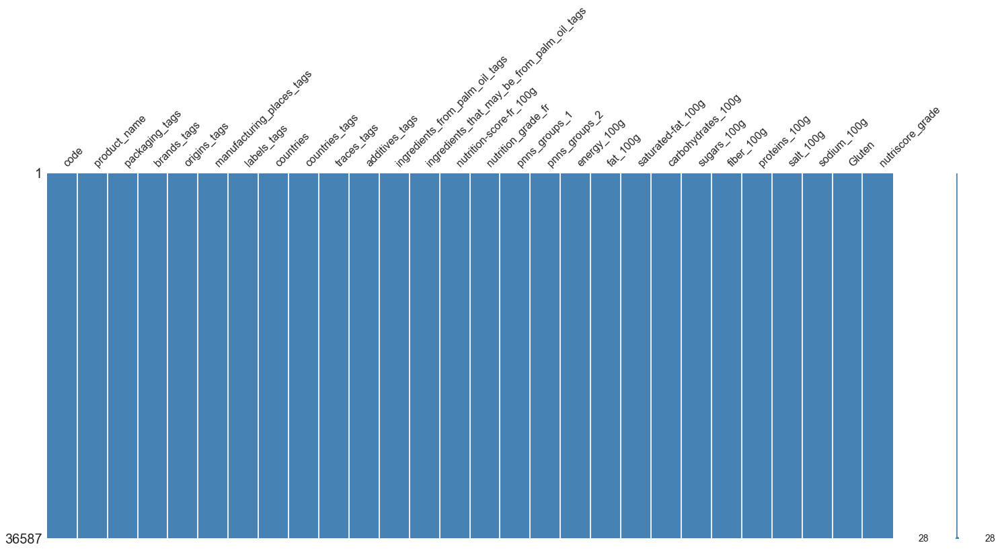

In [18]:
# Matrice des données du Dataset.
color=(70/255, 130/255, 180/255)
msno.matrix(data,color=color)
plt.savefig('GRAPHS/graph_exploration/17- Matrix_clean')
plt.show()

In [19]:
# On remarque qu'il n'y a pas beaucoup de données manquantes dans notre jeu de données. Toutes les colonnes semblent totalement complètes. Ce graphique nous permet de voir globalement la répartition des données, mais on ne connaît pas exactement le % de remplissage.

In [20]:
# Pourcentage des Valeurs Manquantes du Dataset.
def NaN_pie(dataframe):

  lignes = dataframe.shape[0] 
  colonnes = dataframe.shape[1]

  # nombre de données non manquante
  nb_data = dataframe.count().sum()

  # nombre de données totale de ce jeu de données (colonnes*lignes)
  nb_totale = (colonnes*lignes)

  #taux remplissage jeu de données
  rate_dataOK = (nb_data/nb_totale)
  print("Le jeux de données est rempli à {:.2%}".format(rate_dataOK))
  print("et il a {:.2%} de données manquantes".format(1-rate_dataOK))
  print(" ")
  print(" ")

     
  # Pie Plot
  rates = [rate_dataOK, 1 - rate_dataOK]
  labels = ["Données", "NAN"]

  explode =(0,0.1) 
  colors = ['gold', 'pink']

  # Plot
  plt.figure(figsize=(12,15))
  plt.pie(rates, explode=explode, labels=labels, colors=colors, autopct='%.2f%%', shadow=True, textprops={'fontsize': 26})

  ttl=plt.title("Taux de remplissage du jeu de données", fontsize = 32)
  ttl.set_position([0.5, 0.85])

  plt.axis('equal')
  #ax.legend(labels, loc = "upper right", fontsize = 18)
  plt.tight_layout() 

  plt.show()

Le jeux de données est rempli à 100.00%
et il a 0.00% de données manquantes
 
 


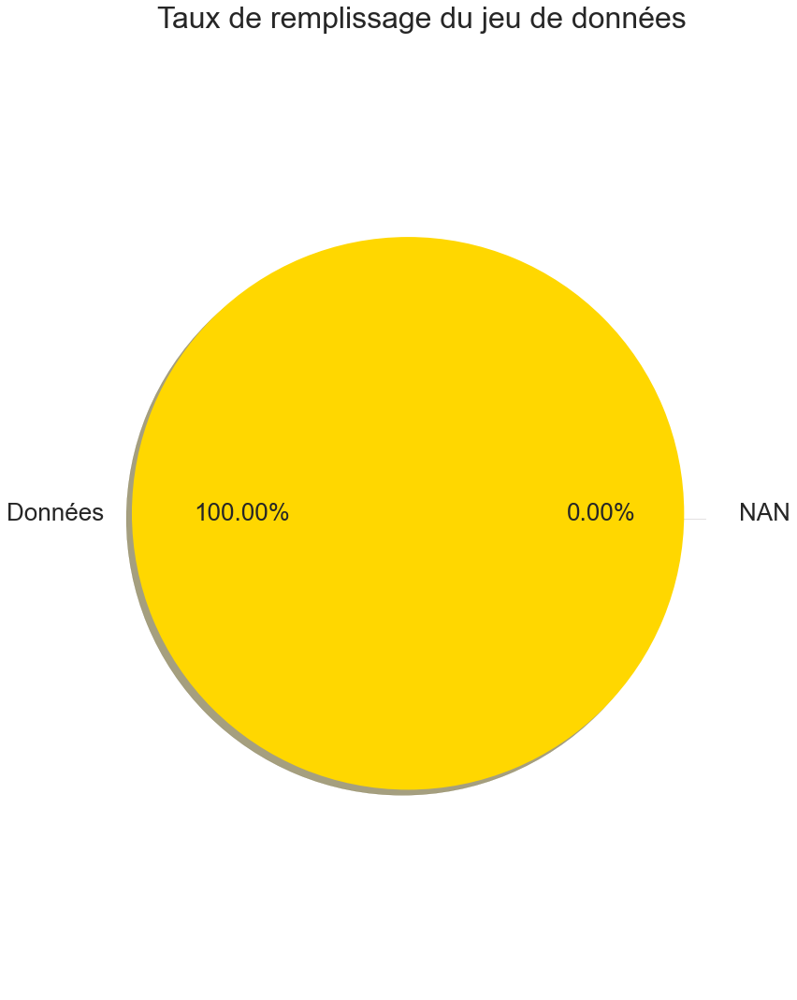

<Figure size 576x396 with 0 Axes>

In [21]:
# Application de la Fonction.
NaN_pie(data)
plt.savefig('GRAPHS/graph_exploration/18- Taux_NaN_clean')
plt.show()

In [22]:
# Répartition des données entre les variables des colonnes.
def graphique_taux_remplissage_variable(dataframe):
  # Répartition du taux de remplissage des colonnes: 
  df = pd.DataFrame(round(dataframe.shape[0] - dataframe.isna().sum())/dataframe.shape[0],columns=['Taux de remplissage']).sort_values('Taux de remplissage', ascending=False).reset_index()
  fig, ax = plt.subplots(figsize=(10,30))
  sns.barplot(y=df['index'], x='Taux de remplissage', data=df)
  plt.title('Taux de remplissage des variables - %')
  plt.show()

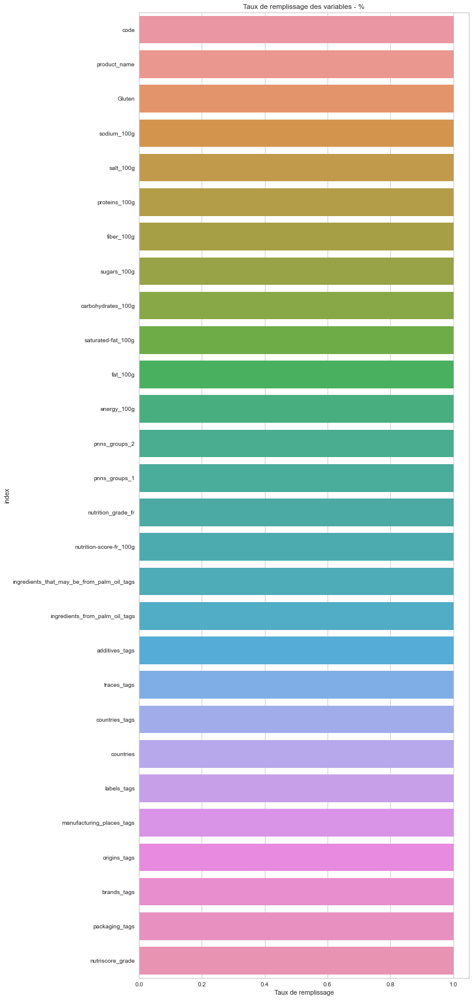

<Figure size 576x396 with 0 Axes>

In [23]:
# Application de la Fonction.
graphique_taux_remplissage_variable(data)
plt.savefig('GRAPHS/graph_exploration/19- %Remplissage_clean')
plt.show()

In [24]:
# I-Analyse Univariée 
# I-1.Analyse Univariée des variables numériques.
# I-1-1 Histogramme des variables numériques.
# I-1-1-1 Fonction qui décrit l'histogramme multiple.
def histograms_multiple_plot(df, cols):
    num_plots = len(cols)
    num_cols = math.ceil(np.sqrt(num_plots))
    num_rows = math.ceil(num_plots/num_cols)    
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(20,15))
    for ind, col in enumerate(cols):
        i = math.floor(ind/num_cols)
        j = ind - i*num_cols
            
        if num_rows == 1:
            if num_cols == 1:
                sns.distplot(df[col], kde=True, ax=axs)
            else:
                sns.distplot(df[col], kde=True, ax=axs[j])
        else:
            sns.distplot(df[col], kde=True, ax=axs[i, j]) 

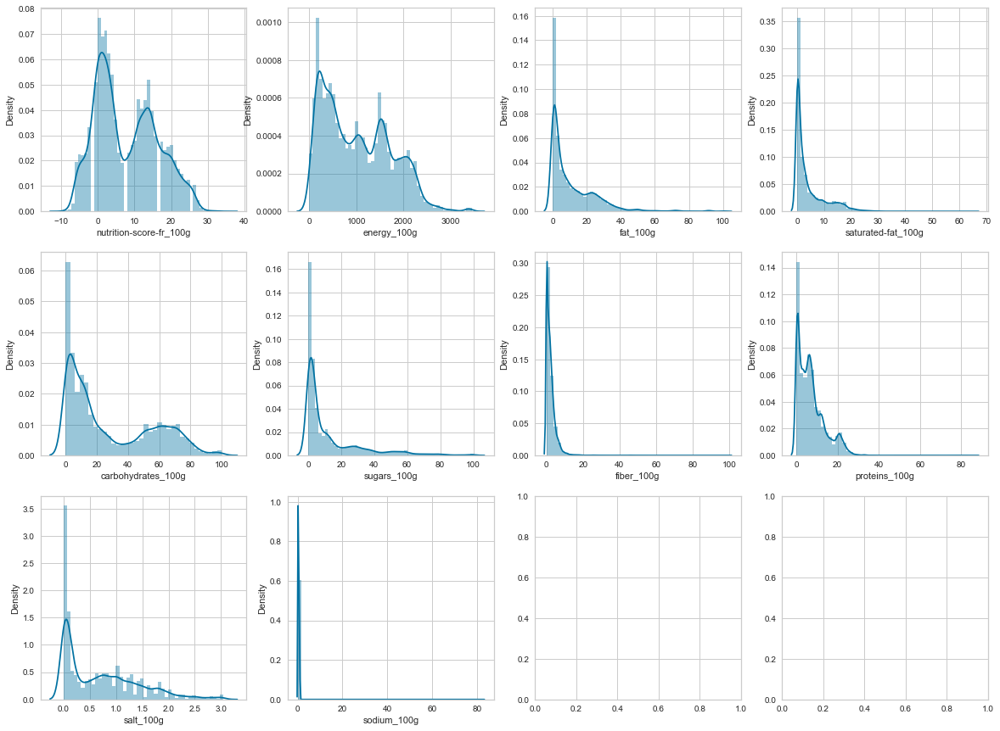

In [25]:
# I-1-1-2 Application de la Fonction qui décrit l'histogramme multiple.
histograms_multiple_plot(data, data.select_dtypes(include = ['float64']).columns.tolist())
plt.savefig('GRAPHS/graph_exploration/20- Histogramme1')
plt.show()

In [26]:
# Supprimer les lignes où la courbe de densité est quasi nulle, et conserver les principales variables permettant d'établir le nutriscore.

In [27]:
# I-1-2.Statistiques descriptives des variables du Dataset.
data.describe()

,nutrition-score-fr_100g,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,Gluten
count,36587.000000,36587.000000,36587.000000,36587.000000,36587.000000,36587.000000,36587.000000,36587.000000,36587.000000,36587.000000,36587.000000
mean,7.820168,1019.645651,11.017019,4.173559,28.395463,12.665825,2.219198,7.108025,0.715002,0.285088,0.077213
std,8.385417,707.601017,13.589881,5.715236,27.418836,18.313213,3.318278,6.557928,0.712123,0.575369,0.266933
min,-10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,390.000000,1.000000,0.200000,4.800000,1.100000,0.350000,1.800000,0.080000,0.031496,0.000000
50%,6.000000,929.000000,5.600000,1.600000,15.100000,4.000000,1.500000,5.800000,0.570000,0.224409,0.000000
75%,14.000000,1562.000000,17.600000,5.800000,54.000000,15.900000,3.000000,10.000000,1.198880,0.472000,0.000000
max,35.000000,3464.000000,100.000000,65.000000,100.000000,100.000000,100.000000,86.000000,3.050000,83.000000,1.000000


In [28]:
# I-1-2-1. filtration des lignes de notre dataframe pour chaque variable afin d'avoir des résultats réaliste.
# I-1-2-1-1 Fonction qui delimite les variables utiles.
def data_reduction(dataframe):
  short_dataframe=dataframe.copy()
  cols_100g = ['energy_100g','fat_100g','saturated-fat_100g','carbohydrates_100g',
               'sugars_100g','fiber_100g','proteins_100g','satl_100g','sodium_100g']

  for cols in cols_100g:
    if cols == 'energy-kcal_100g' :
      short_dataframe.drop(short_dataframe[short_dataframe[cols] > 3700].index, inplace=True)
    if cols == 'fat_100g' :
      short_dataframe.drop(short_dataframe[short_dataframe[cols] > 100].index, inplace=True)
    if cols == 'saturated-fat_100g' :
      short_dataframe.drop(short_dataframe[short_dataframe[cols] > 65].index, inplace=True)
    if cols == 'carbohydrates_100g' :
      short_dataframe.drop(short_dataframe[short_dataframe[cols] > 100].index, inplace=True)
    if cols == 'sugars_100g' :
      short_dataframe.drop(short_dataframe[short_dataframe[cols] > 100].index, inplace=True)
    if cols == 'fiber_100g' :
      short_dataframe.drop(short_dataframe[short_dataframe[cols] > 75].index, inplace=True)
    if cols == 'proteins_100g' :
      short_dataframe.drop(short_dataframe[short_dataframe[cols] > 82].index, inplace=True)
    if cols == 'salt_100g' :
      short_dataframe.drop(short_dataframe[short_dataframe[cols] > 3.43].index, inplace=True)
    if cols == 'sodium_100g' :
      short_dataframe.drop(short_dataframe[short_dataframe[cols] > 1.36].index, inplace=True)
  return short_dataframe

In [29]:
# Renommer le dataset réajusté.
df = data_reduction(data)
# Visualisation du dataset réajusté.
df

,code,product_name,packaging_tags,brands_tags,origins_tags,manufacturing_places_tags,labels_tags,countries,countries_tags,traces_tags,additives_tags,ingredients_from_palm_oil_tags,ingredients_that_may_be_from_palm_oil_tags,nutrition-score-fr_100g,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,Gluten,nutriscore_grade
0,36252,Lion Peanut x2,autre,autre,autre,autre,autre,"France, US",france,autre,E322/E322I,autre,autre,22.0,e,unknown,unknown,1883.0,20.0,12.50,70.00,57.50,2.500,2.500,0.09652,0.038000,0,E
1,40608754,"Pepsi, Nouveau goût !",autre,autre,autre,autre,autre,France,france,autre,autre,autre,autre,13.0,e,Beverages,Sweetened beverages,177.0,0.0,0.00,10.40,10.40,0.000,0.000,0.02540,0.010000,0,D
2,87177756,7Up,autre,autre,autre,autre,autre,France,france,autre,E330,autre,autre,13.0,e,Beverages,Sweetened beverages,177.0,0.0,0.00,10.40,10.40,0.750,0.000,0.10000,0.039370,0,D
3,10,Madeleines nature,plastique,autre,autre,autre,autre,France,france,arachides,autre,autre,E471,12.0,d,Sugary snacks,Biscuits and cakes,1900.0,23.0,2.50,55.00,26.00,1.500,6.000,0.66000,0.259843,0,D
4,30,Cakes Raisins,plastique,autre,autre,france,recyclable,France,france,arachides,autre,autre,E471,13.0,d,Sugary snacks,Biscuits and cakes,1768.0,19.0,2.50,56.00,28.00,1.800,5.800,0.65000,0.255906,0,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36582,9556587103869,Mini Paratha,carton,autre,autre,autre,sans conservateur,France,france,lait,autre,huile-de-palme,autre,10.0,c,Cereals and potatoes,Bread,1309.0,15.0,9.00,41.40,5.10,6.500,6.000,0.90000,0.354331,0,C
36583,9577283844672,100% Pur Jus 4 agrumes,plastique,cora,autre,autre,recyclable,France,france,autre,autre,autre,autre,4.0,c,Beverages,Fruit juices,192.0,0.5,0.00,10.20,9.20,0.600,0.600,0.03000,0.011811,0,C
36584,96068779,Spearmint sans sucres,plastique,autre,autre,autre,autre,France,france,autre,autre,autre,autre,4.0,c,Sugary snacks,Sweets,1017.0,1.3,1.28,95.87,0.12,0.005,0.040,0.00500,0.001969,0,C
36585,96118580,Fisherman's Friend Miel-Citron,plastique,autre,autre,autre,autre,France,france,autre,E330,autre,autre,2.0,b,Sugary snacks,Sweets,1031.0,1.3,1.28,95.31,0.10,1.470,0.004,0.00100,0.000394,0,B


In [30]:
# Dimension du dataset réajusté.
df.shape

(36578, 28)

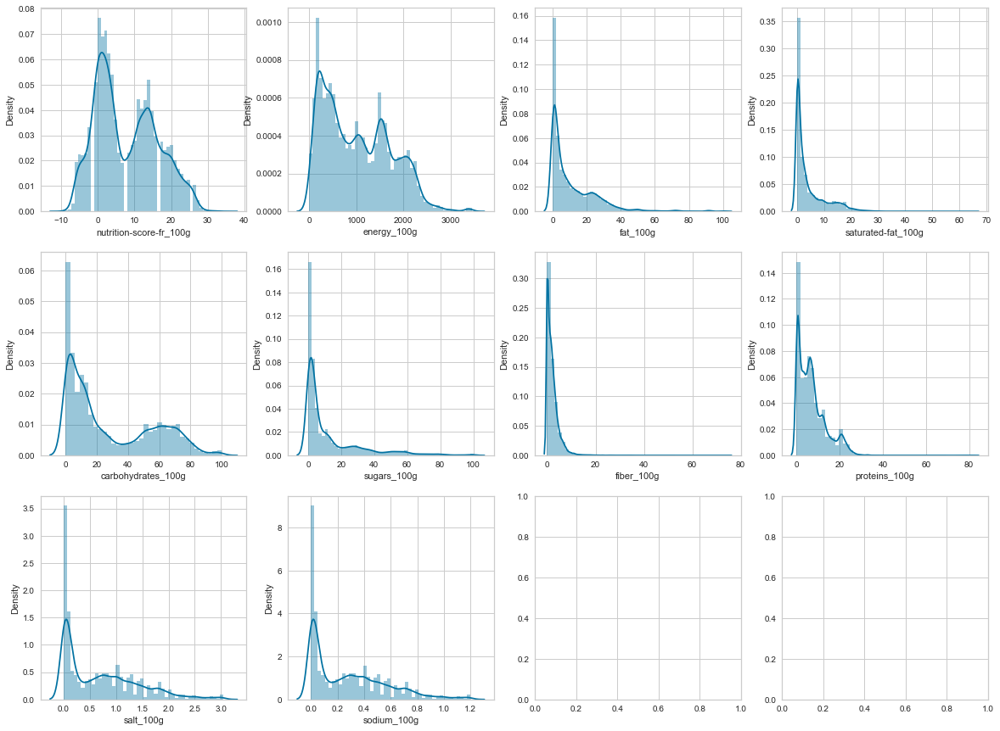

In [31]:
# Application de la Fonction qui décrit l'histogramme multiple au dataset réajusté.
histograms_multiple_plot(df, df.select_dtypes(include = ['float64']).columns.tolist())
plt.savefig('GRAPHS/graph_exploration/21- Histogramme2')
plt.show()

In [32]:
# Listes des variables Quantitatives. 
df_numerique = df.select_dtypes('float')
# Colonnes des variables Quantitatives.
quant_cols = df_numerique.columns

In [33]:
# Mesure statistique et boxplots des variables numérique.
# Statistiques descriptives des variables numériques.
df_numerique.describe()

,nutrition-score-fr_100g,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g
count,36578.000000,36578.000000,36578.000000,36578.000000,36578.000000,36578.000000,36578.000000,36578.000000,36578.000000,36578.000000
mean,7.821136,1019.772908,11.018736,4.174244,28.400434,12.667813,2.205485,7.106699,0.715091,0.281531
std,8.384610,707.592944,13.590558,5.715585,27.419453,18.314541,3.135769,6.545268,0.712140,0.280369
min,-10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,390.000000,1.000000,0.200000,4.800000,1.100000,0.350000,1.800000,0.080000,0.031496
50%,6.000000,929.000000,5.600000,1.600000,15.100000,4.000000,1.500000,5.800000,0.570000,0.224409
75%,14.000000,1562.000000,17.600000,5.800000,54.000000,15.900000,3.000000,10.000000,1.198880,0.472000
max,35.000000,3464.000000,100.000000,65.000000,100.000000,100.000000,75.000000,82.000000,3.050000,1.200787


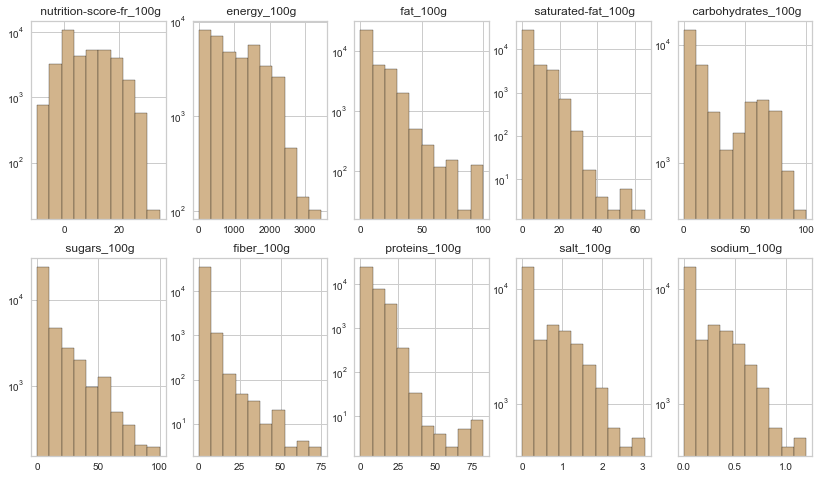

In [34]:
# Histogramme des variables quantitatives.
plt.rcParams["figure.figsize"] = [14,8]
plt.tick_params(axis = 'both', labelsize = 10)
#plt.figure(figsize=(10,8))
for i, col in enumerate(quant_cols): 
    plt.subplot(2, 5, i + 1)
    df[col].hist(color = 'tan', edgecolor = 'black', log = True, )
    #sns.histplot(data = df, x = col)
    plt.title(" {}".format(col))  
plt.savefig('GRAPHS/graph_exploration/22- Histogramme3')
plt.show()

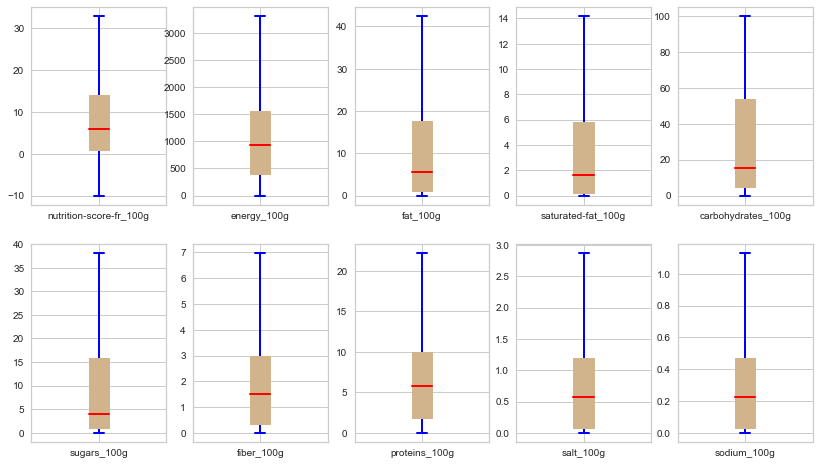

In [35]:
# Boxplot des variables quantitatives.
plt.rcParams["figure.figsize"] = [14,8]
plt.tick_params(axis = 'both', labelsize = 10)
#plt.figure(figsize=(10,8))
for i, col in enumerate(quant_cols): 
    plt.subplot(2, 5, i + 1)
    #plt.title(" {}".format(col))
    df.boxplot(column=[col], return_type='axes', vert=True, showfliers=False, showcaps=True, patch_artist=True, color='tan', medianprops={'linestyle': '-', 'linewidth': 2, 'color': 'red'}, whiskerprops={'linestyle': '-', 'linewidth': 2, 'color' : 'blue'}, capprops={'linestyle': '-', 'linewidth': 2, 'color':'blue'})
  
plt.savefig('GRAPHS/graph_exploration/23- Boxplot1_clean')  
plt.show()

In [36]:
# IV-5 Statistiques descriptives des Indicateurs Retenus.
mean_nutri                  = round(df['nutrition-score-fr_100g'].mean(),4)
mean_energy                 = round(df['energy_100g'].mean(),4)
mean_fat                    = round(df['fat_100g'].mean(),4)
mean_satfat                 = round(df['saturated-fat_100g'].mean(),4)
mean_carbo                  = round(df['carbohydrates_100g'].mean(),4)
mean_sugar                  = round(df['sugars_100g'].mean(),4)
mean_fiber                  = round(df['fiber_100g'].mean(),4)
mean_protein                = round(df['proteins_100g'].mean(),4)
mean_salt                   = round(df['salt_100g'].mean(),4)
mean_sodium                 = round(df['sodium_100g'].mean(),4)
#---------------------------------------------------------------------------------------------------#
median_nutri                = round(df['nutrition-score-fr_100g'].median(),4)
median_energy               = round(df['energy_100g'].median(),4)
median_fat                  = round(df['fat_100g'].median(),4)
median_satfat               = round(df['saturated-fat_100g'].median(),4)
median_carbo                = round(df['carbohydrates_100g'].median(),4)
median_sugar                = round(df['sugars_100g'].median(),4)
median_fiber                = round(df['fiber_100g'].median(),4)
median_protein              = round(df['proteins_100g'].median(),4)
median_salt                 = round(df['salt_100g'].median(),4)
median_sodium               = round(df['sodium_100g'].median(),4)
#---------------------------------------------------------------------------------------------------#
var_nutri                   = round(df['nutrition-score-fr_100g'].var(ddof=0),4)
var_energy                  = round(df['energy_100g'].var(ddof=0),4)
var_fat                     = round(df['fat_100g'].var(ddof=0),4)
var_satfat                  = round(df['saturated-fat_100g'].var(ddof=0),4)
var_carbo                   = round(df['carbohydrates_100g'].var(ddof=0),4)
var_sugar                   = round(df['sugars_100g'].var(ddof=0),4)
var_fiber                   = round(df['fiber_100g'].var(ddof=0),4)
var_protein                 = round(df['proteins_100g'].var(ddof=0),4)
var_salt                    = round(df['salt_100g'].var(ddof=0),4)
var_sodium                  = round(df['sodium_100g'].var(ddof=0),4)
#---------------------------------------------------------------------------------------------------#
std_nutri                   = round(df['nutrition-score-fr_100g'].std(ddof=0),4)
std_energy                  = round(df['energy_100g'].std(ddof=0),4)
std_fat                     = round(df['fat_100g'].std(ddof=0),4)
std_satfat                  = round(df['saturated-fat_100g'].std(ddof=0),4)
std_carbo                   = round(df['carbohydrates_100g'].std(ddof=0),4)
std_sugar                   = round(df['sugars_100g'].std(ddof=0),4)
std_fiber                   = round(df['fiber_100g'].std(ddof=0),4)
std_protein                 = round(df['proteins_100g'].std(ddof=0),4)
std_salt                    = round(df['salt_100g'].std(ddof=0),4)
std_sodium                  = round(df['sodium_100g'].std(ddof=0),4)
#---------------------------------------------------------------------------------------------------#
skew_nutri                  = round(pd.DataFrame(df['nutrition-score-fr_100g']).skew()[0],4)
skew_energy                 = round(pd.DataFrame(df['energy_100g']).skew()[0],4)
skew_fat                    = round(pd.DataFrame(df['fat_100g']).skew()[0],4)
skew_satfat                 = round(pd.DataFrame(df['saturated-fat_100g']).skew()[0],4)
skew_carbo                  = round(pd.DataFrame(df['carbohydrates_100g']).skew()[0],4)
skew_sugar                  = round(pd.DataFrame(df['sugars_100g']).skew()[0],4)
skew_fiber                  = round(pd.DataFrame(df['fiber_100g']).skew()[0],4)
skew_protein                = round(pd.DataFrame(df['proteins_100g']).skew()[0],4)
skew_salt                   = round(pd.DataFrame(df['salt_100g']).skew()[0],4)
skew_sodium                 = round(pd.DataFrame(df['sodium_100g']).skew()[0],4)
#---------------------------------------------------------------------------------------------------#
kurtosis_nutri              = round(pd.DataFrame(df['nutrition-score-fr_100g']).kurtosis()[0],4)
kurtosis_energy             = round(pd.DataFrame(df['energy_100g']).kurtosis()[0],4)
kurtosis_fat                = round(pd.DataFrame(df['fat_100g']).kurtosis()[0],4)
kurtosis_satfat             = round(pd.DataFrame(df['saturated-fat_100g']).kurtosis()[0],4)
kurtosis_carbo              = round(pd.DataFrame(df['carbohydrates_100g']).kurtosis()[0],4)
kurtosis_sugar              = round(pd.DataFrame(df['sugars_100g']).kurtosis()[0],4)
kurtosis_fiber              = round(pd.DataFrame(df['fiber_100g']).kurtosis()[0],4)
kurtosis_protein            = round(pd.DataFrame(df['proteins_100g']).kurtosis()[0],4)
kurtosis_salt               = round(pd.DataFrame(df['salt_100g']).kurtosis()[0],4)
kurtosis_sodium             = round(pd.DataFrame(df['sodium_100g']).kurtosis()[0],4)
#---------------------------------------------------------------------------------------------------#
cv                          = lambda x: np.std(x, ddof=1) / np.mean(x) * 100
cv_nutri                    = round(cv(df['nutrition-score-fr_100g']),4)
cv_energy                   = round(cv(df['energy_100g']),4)
cv_fat                      = round(cv(df['fat_100g']),4)
cv_satfat                   = round(cv(df['saturated-fat_100g']),4)
cv_carbo                    = round(cv(df['carbohydrates_100g']),4)
cv_sugar                    = round(cv(df['sugars_100g']),4)
cv_fiber                    = round(cv(df['fiber_100g']),4)
cv_protein                  = round(cv(df['proteins_100g']),4)
cv_salt                     = round(cv(df['salt_100g']),4)
cv_sodium                   = round(cv(df['sodium_100g']),4)
#---------------------------------------------------------------------------------------------------#
max_nutri                   = df['nutrition-score-fr_100g'].max()
max_energy                  = df['energy_100g'].max()
max_fat                     = df['fat_100g'].max()
max_satfat                  = df['saturated-fat_100g'].max()
max_carbo                   = df['carbohydrates_100g'].max()
max_sugar                   = df['sugars_100g'].max()
max_fiber                   = df['fiber_100g'].max()
max_protein                 = df['proteins_100g'].max()
max_salt                    = df['salt_100g'].max()
max_sodium                  = df['sodium_100g'].max()
#---------------------------------------------------------------------------------------------------#
min_nutri                   = df['nutrition-score-fr_100g'].min()               
min_energy                  = df['energy_100g'].min()
min_fat                     = df['fat_100g'].min()
min_satfat                  = df['saturated-fat_100g'].min()
min_carbo                   = df['carbohydrates_100g'].min()
min_sugar                   = df['sugars_100g'].min()
min_fiber                   = df['fiber_100g'].min()
min_protein                 = df['proteins_100g'].min()
min_salt                    = df['salt_100g'].min()
min_sodium                  = df['sodium_100g'].min()
#---------------------------------------------------------------------------------------------------#
Q1_nutri                    = round(np.percentile(df['nutrition-score-fr_100g'], 25),4)
Q1_energy                   = round(np.percentile(df['energy_100g'], 25),4)
Q1_fat                      = round(np.percentile(df['fat_100g'], 25),4)
Q1_satfat                   = round(np.percentile(df['saturated-fat_100g'], 25),4)
Q1_carbo                    = round(np.percentile(df['carbohydrates_100g'], 25),4)
Q1_sugar                    = round(np.percentile(df['sugars_100g'], 25),4)
Q1_fiber                    = round(np.percentile(df['fiber_100g'], 25),4)
Q1_protein                  = round(np.percentile(df['proteins_100g'], 25),4)
Q1_salt                     = round(np.percentile(df['salt_100g'], 25),4)
Q1_sodium                   = round(np.percentile(df['sodium_100g'], 25),4)
#---------------------------------------------------------------------------------------------------#
Q3_nutri                    = round(np.percentile(df['nutrition-score-fr_100g'], 75),4)
Q3_energy                   = round(np.percentile(df['energy_100g'], 75),4)
Q3_fat                      = round(np.percentile(df['fat_100g'], 75),4)
Q3_satfat                   = round(np.percentile(df['saturated-fat_100g'], 75),4)
Q3_carbo                    = round(np.percentile(df['carbohydrates_100g'], 75),4)
Q3_sugar                    = round(np.percentile(df['sugars_100g'], 75),4)
Q3_fiber                    = round(np.percentile(df['fiber_100g'], 75),4)
Q3_protein                  = round(np.percentile(df['proteins_100g'], 75),4)
Q3_salt                     = round(np.percentile(df['salt_100g'], 75),4)
Q3_sodium                   = round(np.percentile(df['sodium_100g'], 75),4)
#---------------------------------------------------------------------------------------------------#
IQR_nutri                   = round(Q3_nutri - Q1_nutri,4)
IQR_energy                  = round(Q3_energy - Q1_energy,4)
IQR_fat                     = round(Q3_fat - Q1_fat,4)
IQR_satfat                  = round(Q3_satfat - Q1_satfat,4)
IQR_carbo                   = round(Q3_carbo - Q1_carbo,4)
IQR_sugar                   = round(Q3_sugar - Q1_sugar,4)
IQR_fiber                   = round(Q3_fiber - Q1_fiber,4)
IQR_protein                 = round(Q3_protein - Q1_protein,4)
IQR_salt                    = round(Q3_salt - Q1_salt,4)
IQR_sodium                  = round(Q3_sodium - Q1_sodium,4)

In [37]:
data_stats = [['mean', mean_nutri, mean_energy, mean_fat, mean_satfat, mean_carbo, mean_sugar, mean_fiber, mean_protein, mean_salt, mean_sodium],
        ['median', median_nutri, median_energy, median_fat, median_satfat, median_carbo, median_sugar, median_fiber, median_protein, median_salt, median_sodium],
        ['Q1', Q1_nutri, Q1_energy, Q1_fat, Q1_satfat, Q1_carbo, Q1_sugar, Q1_fiber, Q1_protein, Q1_salt, Q1_sodium],
        ['Q3', Q3_nutri, Q3_energy, Q3_fat, Q3_satfat, Q3_carbo, Q3_sugar, Q3_fiber, Q3_protein, Q3_salt, Q3_sodium],
        ['min', min_nutri, min_energy, min_fat, min_satfat, min_carbo, min_sugar, min_fiber, min_protein, min_salt, min_sodium],
        ['max', max_nutri, max_energy, max_fat, max_satfat, max_carbo, max_sugar, max_fiber, max_protein, max_salt, max_sodium],      
        ['var',var_nutri, var_energy, var_fat, var_satfat, var_carbo, var_sugar, var_fiber, var_protein, var_salt, var_sodium], 
        ['std',std_nutri, std_energy, std_fat, std_satfat, std_carbo, std_sugar, std_fiber, std_protein, std_salt, std_sodium],
        ['cv', cv_nutri, cv_energy, cv_fat, cv_satfat, cv_carbo, cv_sugar, cv_fiber, cv_protein, cv_salt, cv_sodium],
        ['IQR', IQR_nutri, IQR_energy, IQR_fat, IQR_satfat, IQR_carbo, IQR_sugar, IQR_fiber, IQR_protein, IQR_salt, IQR_sodium],      
        ['skew', skew_nutri, skew_energy, skew_fat, skew_satfat, skew_carbo, skew_sugar, skew_fiber, skew_protein, skew_salt, skew_sodium], 
        ['kurtosis', kurtosis_nutri, kurtosis_energy, kurtosis_fat, kurtosis_satfat, kurtosis_carbo, kurtosis_sugar, kurtosis_fiber, kurtosis_protein, kurtosis_salt, kurtosis_sodium]]                
df_stat = pd.DataFrame(data_stats,columns=['Desc','Stat_nutri','Stat_energy','Stat_fat','Stat_satfat','Stat_carbo','Stat_sugar', 'Stat_fiber', 'Stat_protein', 'Stat_salt', 'Stat_sodium'])
# Visualisation.
df_stat

,Desc,Stat_nutri,Stat_energy,Stat_fat,Stat_satfat,Stat_carbo,Stat_sugar,Stat_fiber,Stat_protein,Stat_salt,Stat_sodium
0,mean,7.8211,1019.7729,11.0187,4.1742,28.4004,12.6678,2.2055,7.1067,0.7151,0.281500
1,median,6.0000,929.0000,5.6000,1.6000,15.1000,4.0000,1.5000,5.8000,0.5700,0.224400
2,Q1,1.0000,390.0000,1.0000,0.2000,4.8000,1.1000,0.3500,1.8000,0.0800,0.031500
3,Q3,14.0000,1562.0000,17.6000,5.8000,54.0000,15.9000,3.0000,10.0000,1.1989,0.472000
4,min,-10.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.000000
5,max,35.0000,3464.0000,100.0000,65.0000,100.0000,100.0000,75.0000,82.0000,3.0500,1.200787
6,var,70.2998,500674.0864,184.6982,32.6670,751.8059,335.4133,9.8328,42.8394,0.5071,0.078600
7,std,8.3845,707.5833,13.5904,5.7155,27.4191,18.3143,3.1357,6.5452,0.7121,0.280400
8,cv,107.2045,69.3873,123.3404,136.9251,96.5459,144.5754,142.1805,92.1000,99.5874,99.587300
9,IQR,13.0000,1172.0000,16.6000,5.6000,49.2000,14.8000,2.6500,8.2000,1.1189,0.440500


In [38]:
# Il semble d'après les histogrammes qu'aucune des données n'est normalement distribuée.
# Vérifions avec les tests de normalité habituels et visualisons les qqplots (pour la distribution normale).

In [39]:
# Tests de Normalité.
def normality_tests(data, print_opt=False):
    res_df = pd.DataFrame([])
    data_notna = data[data.notna()]
    # Shapiro-Wilk - D'Agostino's K^2
    for f_name, func in zip(['Shapiro-Wilk', "D'Agostino K^2"],[shapiro, normaltest]):
        stat, p = func(data_notna)
        res_df.loc[f_name,'stat'] = stat
        res_df.loc[f_name,'p_value'] = p
        if print_opt: print('---'+f_name) 
        if print_opt: print('stat=%.3f, p=%.3f' % (stat, p))
        res_df.loc[f_name,'res'] = [p > 0.05]
        if p > 0.05:
            if print_opt: print('Probably Gaussian')
        else:
            if print_opt: print('Probably not Gaussian')
    # Anderson-Darling
    result = anderson(data_notna)
    if print_opt: print('---'+'Anderson-Darling')
    res_df.loc['Anderson-Darling','stat'] = result.statistic
    if print_opt: print('stat=%.3f' % (result.statistic))
    res_and = [(int(result.significance_level[i]),result.statistic < res)\
                   for i,res in enumerate(result.critical_values)]
    res_df.loc['Anderson-Darling','res'] = str(res_and)
    for i in range(len(result.critical_values)):
        sl, cv = result.significance_level[i], result.critical_values[i]
        if result.statistic < cv:
            if print_opt: print('Probably Gaussian at the %.1f%% level' % (sl))
        else:
            if print_opt: print('Probably not Gaussian at the %.1f%% level' % (sl))
    return res_df

In [40]:
# Représentation graphique des histogrammes et qqplots des variables quantitatives.
def plot_hist_qqplot(data, name, save=False):
    fig, axs = plt.subplots(1,2)
    # histogram
    axs[0].hist(data, histtype='stepfilled',ec='k', color='lightgrey', bins =25);
    # using statsmodels qqplot's module
    qqplot(data, line='r', **{'markersize': 5, 'mec': 'k','color': 'lightgrey'}, ax=axs[1])
    plt.gcf().set_size_inches(10,2.5)
    fig.suptitle(name, fontweight='bold', size=14)
    plt.tight_layout(rect=[0, 0.05, 1, 0.92])

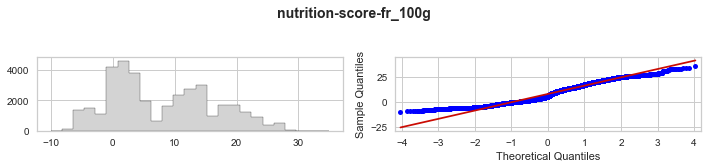

,stat,p_value,res
Shapiro-Wilk,0.958,0.000,False
D'Agostino K^2,"5,467.522",0.000,False
Anderson-Darling,568.525,NaN,"[(15, False), (10, False), (5, False), (2, Fal..."


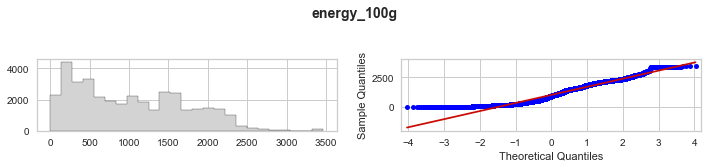

,stat,p_value,res
Shapiro-Wilk,0.943,0.000,False
D'Agostino K^2,"3,339.608",0.000,False
Anderson-Darling,642.310,NaN,"[(15, False), (10, False), (5, False), (2, Fal..."


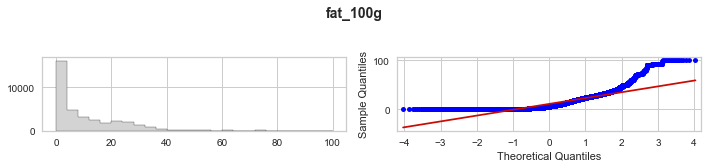

,stat,p_value,res
Shapiro-Wilk,0.773,0.000,False
D'Agostino K^2,"16,663.101",0.000,False
Anderson-Darling,"2,216.913",NaN,"[(15, False), (10, False), (5, False), (2, Fal..."


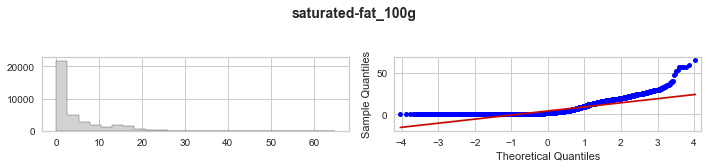

,stat,p_value,res
Shapiro-Wilk,0.742,0.000,False
D'Agostino K^2,"13,445.706",0.000,False
Anderson-Darling,"3,407.570",NaN,"[(15, False), (10, False), (5, False), (2, Fal..."


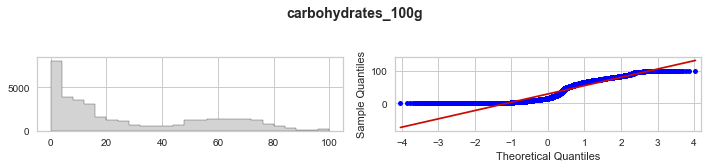

,stat,p_value,res
Shapiro-Wilk,0.858,0.000,False
D'Agostino K^2,"9,057.820",0.000,False
Anderson-Darling,"2,052.054",NaN,"[(15, False), (10, False), (5, False), (2, Fal..."


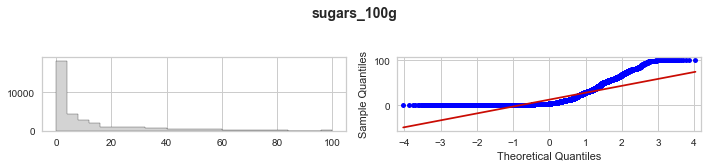

,stat,p_value,res
Shapiro-Wilk,0.703,0.000,False
D'Agostino K^2,"14,676.652",0.000,False
Anderson-Darling,"3,910.561",NaN,"[(15, False), (10, False), (5, False), (2, Fal..."


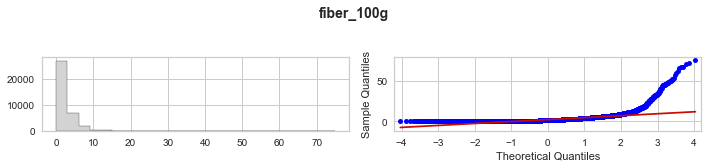

,stat,p_value,res
Shapiro-Wilk,0.585,0.000,False
D'Agostino K^2,"46,272.551",0.000,False
Anderson-Darling,"2,592.763",NaN,"[(15, False), (10, False), (5, False), (2, Fal..."


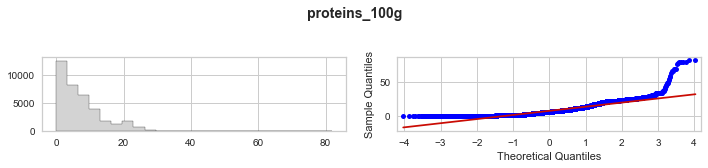

,stat,p_value,res
Shapiro-Wilk,0.874,0.000,False
D'Agostino K^2,"11,971.819",0.000,False
Anderson-Darling,"1,112.929",NaN,"[(15, False), (10, False), (5, False), (2, Fal..."


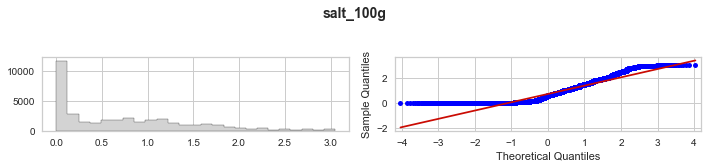

,stat,p_value,res
Shapiro-Wilk,0.880,0.000,False
D'Agostino K^2,"3,965.247",0.000,False
Anderson-Darling,"1,336.854",NaN,"[(15, False), (10, False), (5, False), (2, Fal..."


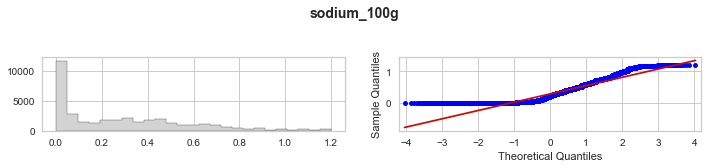

,stat,p_value,res
Shapiro-Wilk,0.880,0.000,False
D'Agostino K^2,"3,965.111",0.000,False
Anderson-Darling,"1,336.857",NaN,"[(15, False), (10, False), (5, False), (2, Fal..."


<Figure size 1008x576 with 0 Axes>

In [41]:
# Application des fonctions Tests de Normalité et QQplots.

for i, c in enumerate(quant_cols,1):
    if c in quant_cols:
        plot_hist_qqplot(df[c].dropna().values, c, save=False)
    else:
        plot_hist_qqplot(df[c].values, c, save=False)
    #if plot_enabled: plt.savefig(os.getcwd()+'/FIG/'+'A_1_1_qqplot_'+c+'.png', dpi=400)
    plt.show()
    with pd.option_context('display.float_format', '{:,.3f}'.format):
        display(normality_tests(df[c], print_opt=False))
plt.savefig('GRAPHS/graph_exploration/24- hist_qqplot')

In [42]:
# I-2.Analyse Univariée des Variables Nominales.
# Extraction des variables Nominales (Qualitatives).
df_non_numerique = df.select_dtypes(exclude='number').drop(['code'], axis=1)
# Colonnes des variables Nominales (Qualitatives).
qual_cols = df_non_numerique.columns

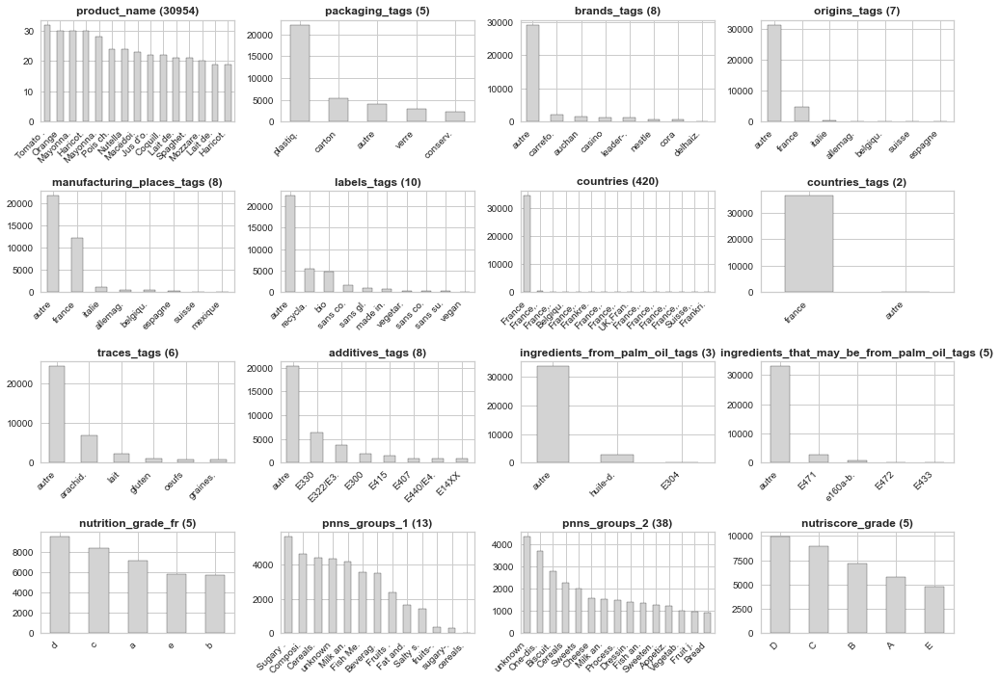

In [43]:
# Représentation graphique des principales variables qualitatives.
fig = plt.figure(figsize=(14,10))
for i, c in enumerate(qual_cols,1):
    ax = fig.add_subplot(4,4,i)
    ser = df[c].value_counts()
    n_cat = ser.shape[0]
    if n_cat>15:
        ser[0:15].plot.bar(color='lightgrey',ec='k', ax=ax)
    else:
        ser.plot.bar(color='lightgrey',ec='k',ax=ax)
    ax.set_title(c+f' ({n_cat})', fontweight='bold')
    labels = [item.get_text() for item in ax.get_xticklabels()]
    short_labels = [s[0:7]+'.' if len(s)>7 else s for s in labels]
    ax.axes.set_xticklabels(short_labels)
    plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig('GRAPHS/graph_exploration/25- Barplot')
plt.show()

In [44]:
# I-2-1.Analyse Univariée des Variables Qualitatives Ordinale.
# Variables de Type Category : Barplot / Pie Plot.
categories_columns = df.select_dtypes(include = ['category']).columns
# Visualisation.
categories_columns

Index(['nutriscore_grade'], dtype='object')

In [45]:
# Edition du dataset.
df['nutriscore_grade'].value_counts()

D    9940
C    8940
B    7145
A    5770
E    4783
Name: nutriscore_grade, dtype: int64

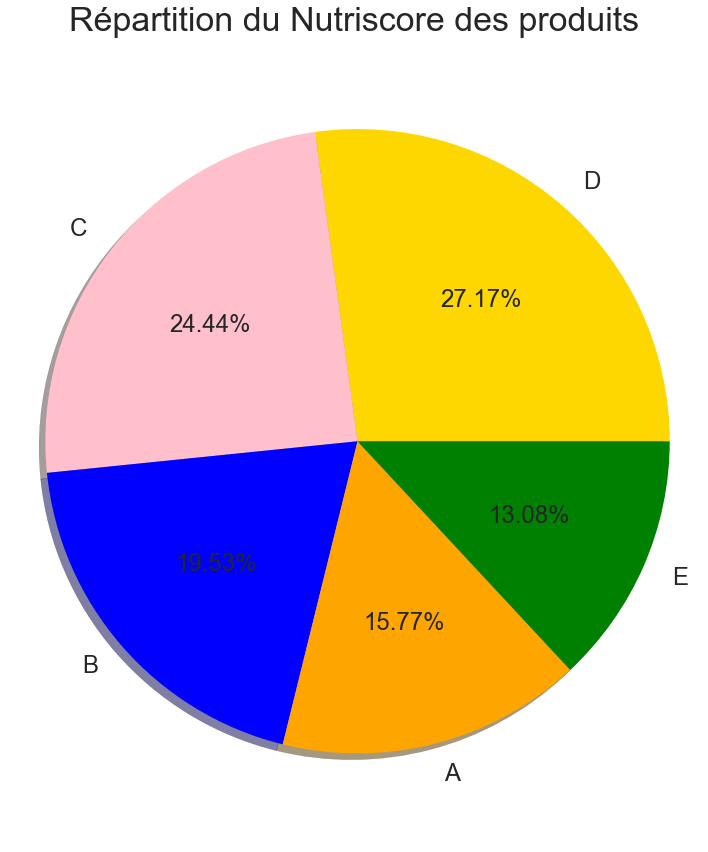

In [46]:
# Data to plot
values = df['nutriscore_grade'].value_counts()
labels = df['nutriscore_grade'].value_counts().index.str.upper()
colors = ['gold', 'pink', 'blue', 'orange', 'green']
explode =(0, 0, 0, 0, 0) 

# Plot
plt.figure(figsize=(10,12))
plt.pie(values,  explode=explode, labels=labels, colors=colors,
autopct='%.2f%%', shadow=True, textprops={'fontsize': 24})

ttl=plt.title("Répartition du Nutriscore des produits", fontsize = 34) 
ttl.set_position([0.5, 0.90])

plt.axis('equal')
plt.tight_layout() 
plt.savefig('GRAPHS/graph_exploration/26- Nutriscore_grade')
plt.show()

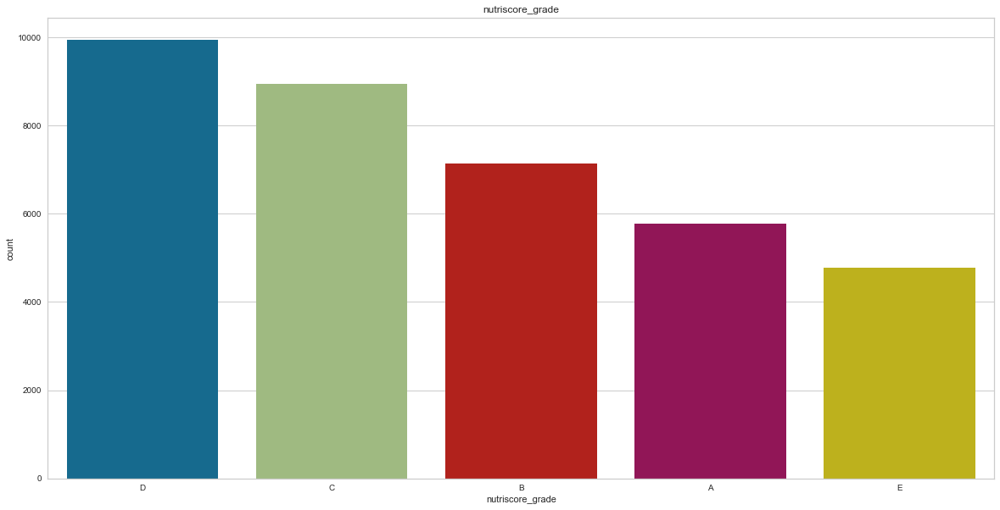

In [47]:
# Data plot du nutriscore_grade.
plt.figure(figsize=(20,10))
sns.countplot(x = df['nutriscore_grade'], order=['D', 'C', 'B', 'A', 'E'])
plt.title("nutriscore_grade")
plt.rc('xtick', labelsize=56) 
plt.savefig('GRAPHS/graph_exploration/27- Nutriscore_grade')
plt.show()

In [48]:
# Dans le jeu de données, la plupart des produits ont un nutriscore_grade C, D, B.

In [49]:
# Variable Gluten.
df.groupby('Gluten').size()

Gluten
0    33753
1     2825
dtype: int64

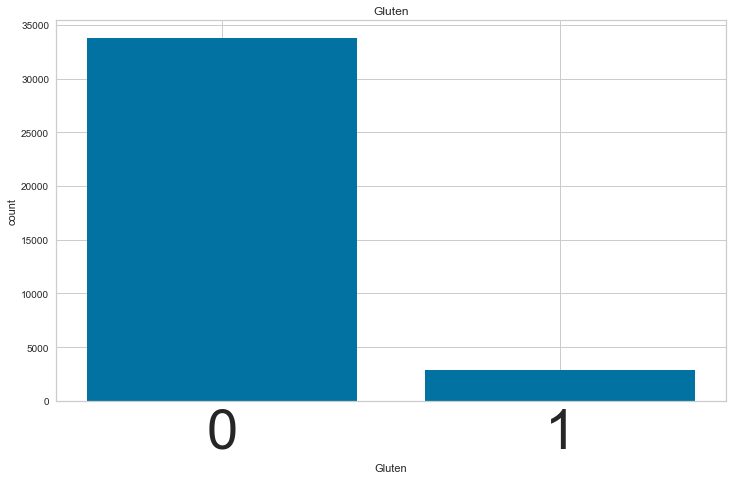

In [50]:
# Représentation Graphique.
plt.figure(figsize=(12, 7))
height =df.groupby('Gluten').size()
bars = df.groupby('Gluten').size().index
x_pos = np.arange(len(bars))
plt.bar(x_pos, height)
plt.title('Gluten')
plt.xlabel('Gluten')
plt.ylabel('count')
plt.xticks(x_pos, bars)
plt.savefig('GRAPHS/graph_exploration/28- Gluten')
plt.show()

In [51]:
# 2.1.2 Variables qualitatives nominales.
# Variables de Type objet : Occurences des mots.
object_columns = df.select_dtypes(include = ['object']).columns

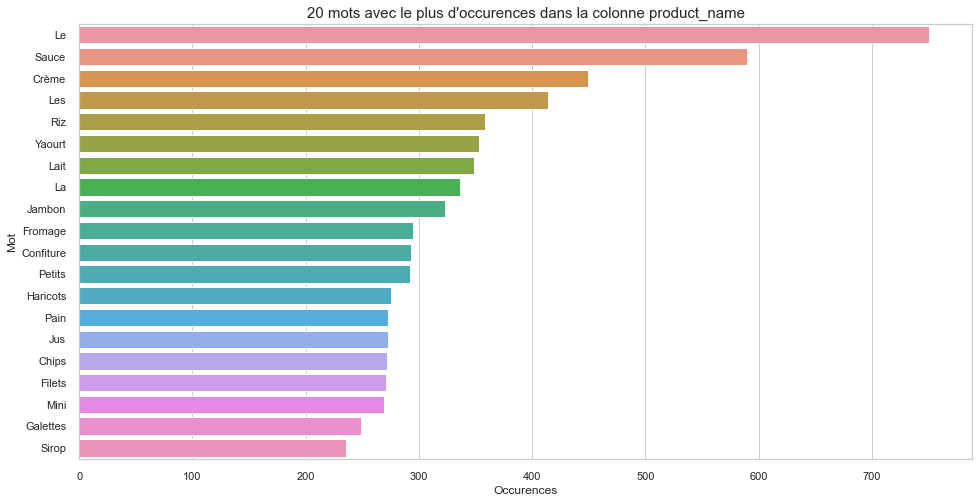

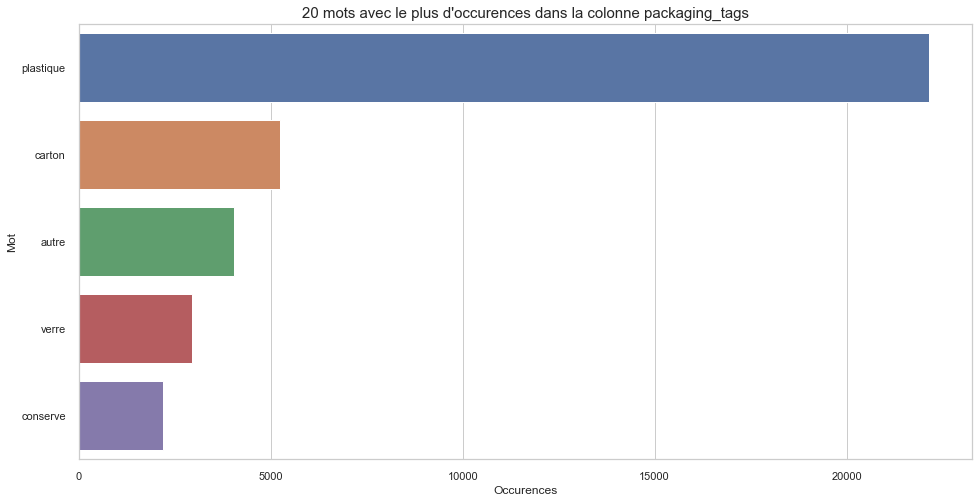

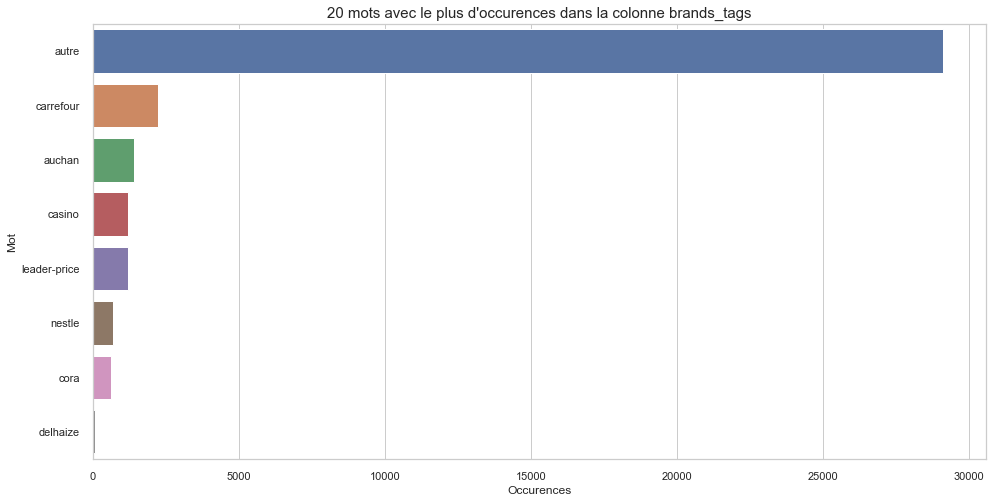

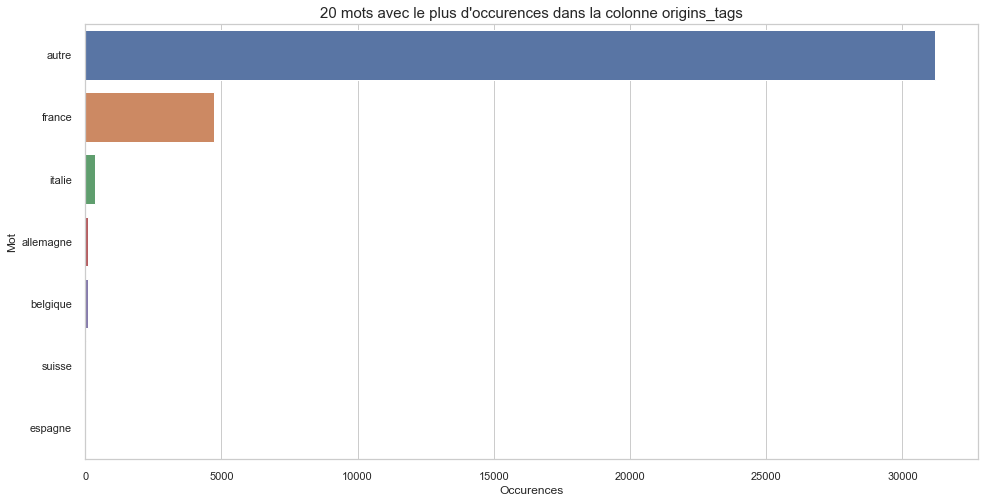

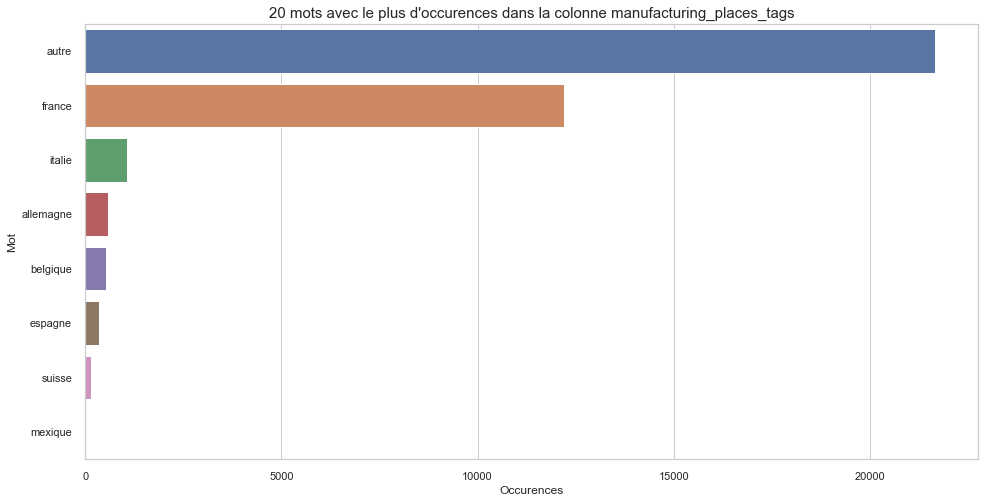

...

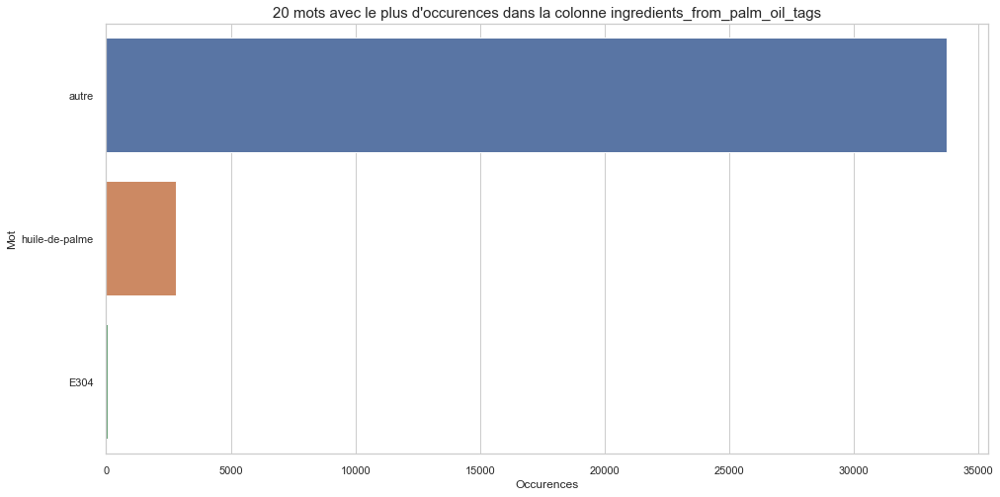

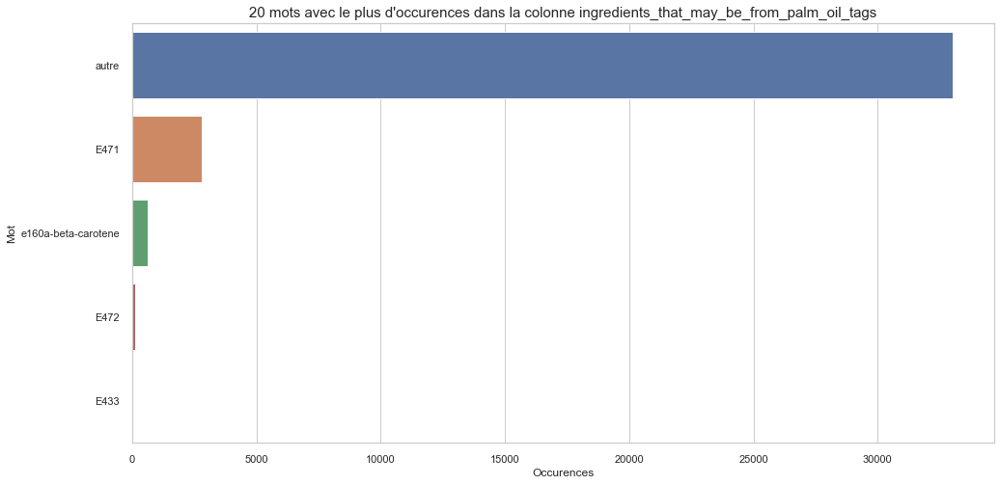

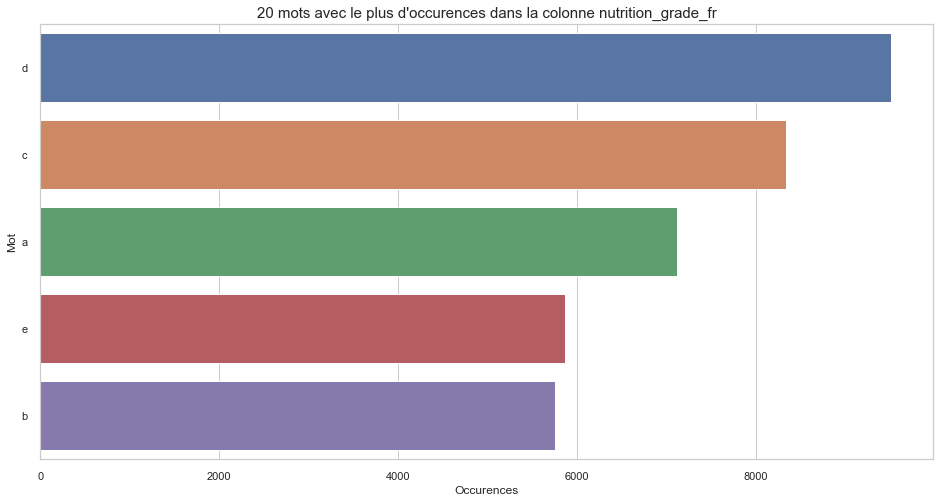

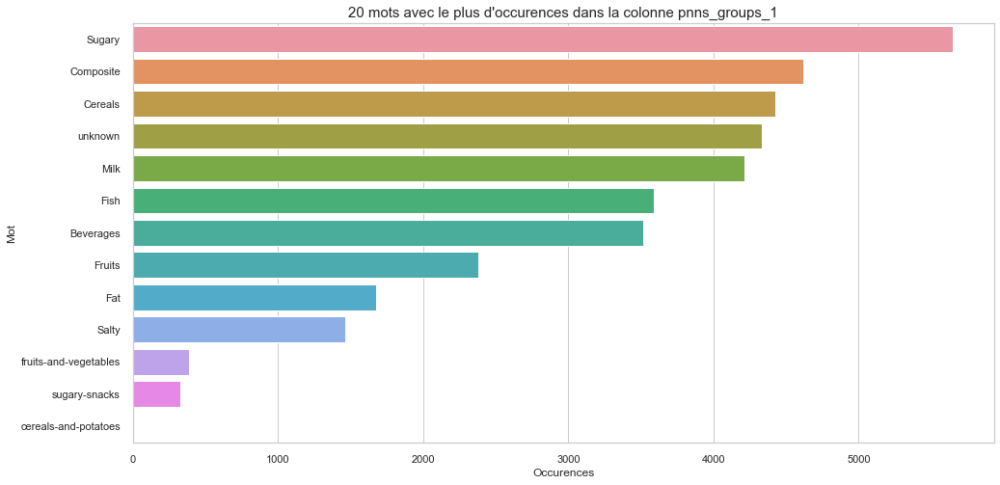

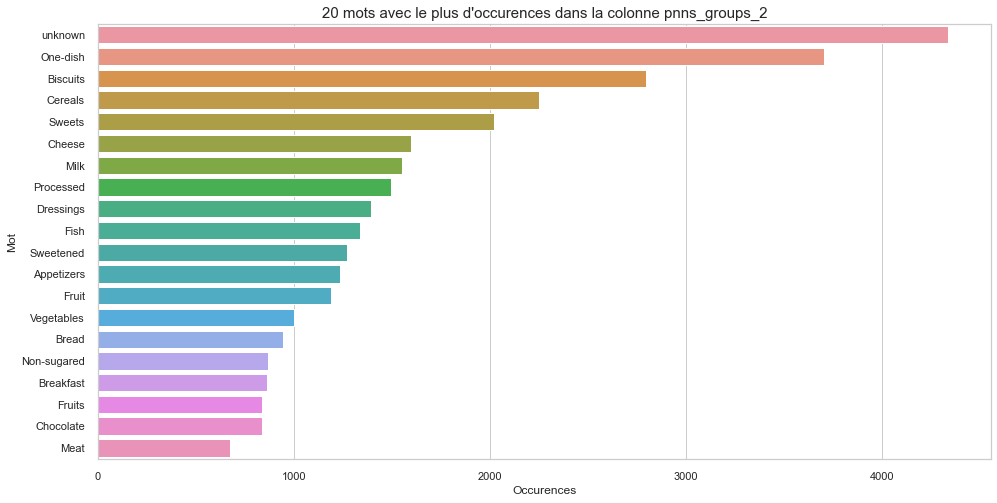

In [52]:
# Représentation graphique par rapport aux mots populaires.
mots_populaires = []
for colonne in object_columns :
    liste_mots = [str(i).split(' ', 1)[0] for i in df[colonne].dropna().tolist()]
    mots_populaires.append(collections.Counter(liste_mots).most_common(20))

sns.set(font_scale=2.5)
for nom_colonne, liste_mots in zip(object_columns[1:], mots_populaires[1:]):
    sns.set(style="whitegrid")
    plt.figure(figsize=(16, 8))

    df_mots_utilises = pd.DataFrame(liste_mots, columns = ['Mot', 'Occurences']).sort_values(by='Occurences', ascending=False)
    df_mots_utilises.head()
    sns.barplot(y = 'Mot', x='Occurences', data = df_mots_utilises)
    plt.title('20 mots avec le plus d\'occurences dans la colonne ' + nom_colonne, size=15)
    plt.savefig('GRAPHS/graph_exploration/29- Mots_Pop')
    plt.show()

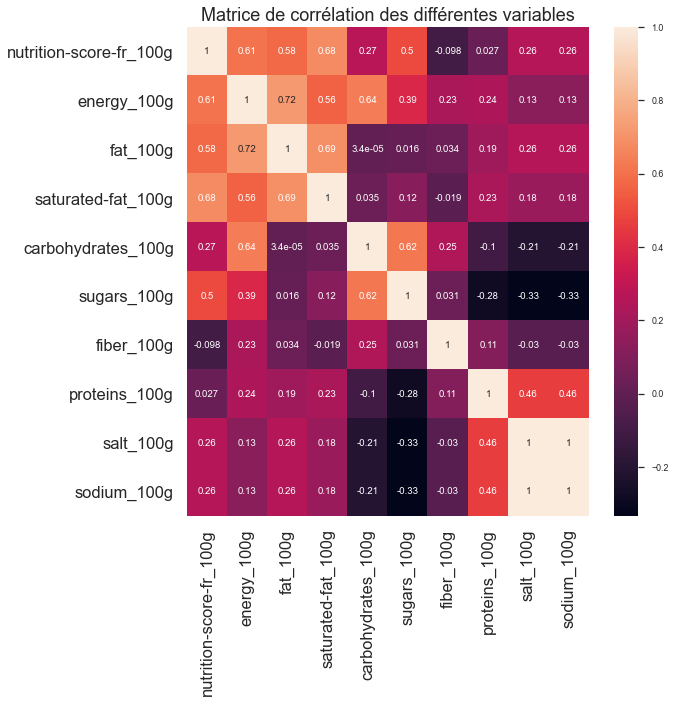

In [53]:
# II-Analyses Bivariées.
# II-1  Analyse Bivariéé des Variables Quantitatives.
# II-1-1 Matrice des Corrélations entre Les Variables Quantitatives.
corr_matrix = df_numerique.corr()
fig = plt.figure(1, figsize=(9,9))
sns.set(font_scale=1.5)
plt.title('Matrice de corrélation des différentes variables')
sns.set(font_scale=0.8)
sns.heatmap(corr_matrix, annot=True)
plt.savefig('GRAPHS/graph_exploration/30- Matrix_corr')
plt.show()

In [54]:
# Forte corrélation entre:
# A-nutrition-score-fr_100g Fortement corrélée avec:'energy_100g', 'fat_100g', 'saturated-fat_100g',  'sugars_100g'
# B-energy_100g Fortement corrélée avec:'nutrition-score-fr_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g'
# C-fat_100g Fortement corrélée avec: 'saturated-fat_100g'.
# carbohydrates_100g Fortement corrélée avec:'sugars_100g'.
# 'sugars_100g' Fortement corrélée avec: 'salt_100', 'sodium_100'.
# 'proteins_100g' Fortement corrélée avec: 'salt_100', 'sodium_100'.

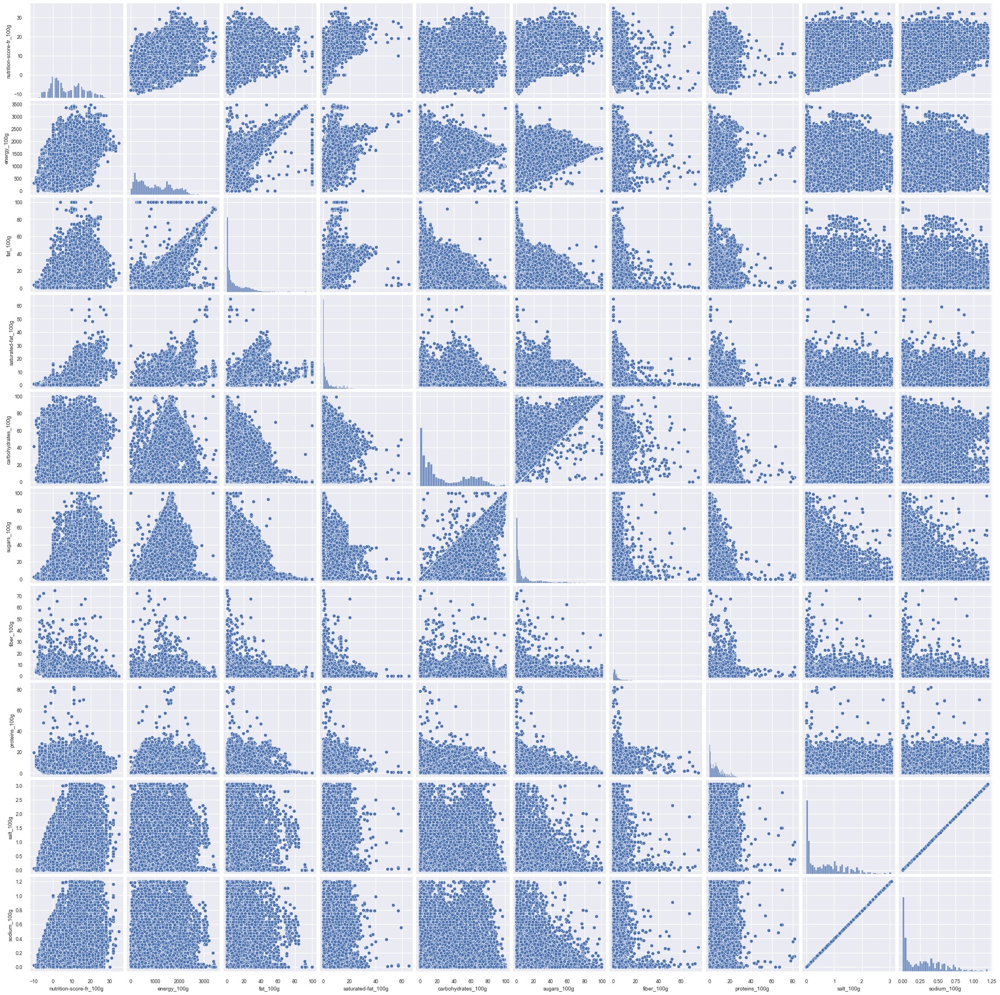

In [55]:
# II-1-2 Analyse du nuage de points de chacune des variables de "df_numerique" deux à deux dans une disposition multiple de grahiques.
df_numerique_nuages = sns.pairplot(df_numerique)
# plt.savefig('graph/1-Scatterpoint.png')
plt.savefig('GRAPHS/graph_exploration/31- Pairplot')
plt.show()

In [56]:
# II-1-3 Nuage de points des variables quantitatives les plus corrélées entre elles.
# Déterminons un sous-ensemble de l'ensemble des variables quantitatives.
df_subset = df_numerique.sample(n = 10000) 
# Identification des colonnes.
df_subset.columns

Index(['nutrition-score-fr_100g', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g'],
      dtype='object')

In [57]:
# Fonction Scatter plot.
def scatter_plot(dataframe_point, colX, colY, dataframe_reg, color_by):
  print("Le coefficient de Pearson est de {}".format(np.corrcoef(dataframe_reg[colX], dataframe_reg[colY])[0][1]))
  sns.set(style="darkgrid", color_codes=True)
  sns.set(rc={'figure.figsize':(15,10)})
  r, p = stats.pearsonr(dataframe_reg[colX], dataframe_reg[colY])
  slope, intercept, r_value, p_value, std_err = stats.linregress(dataframe_reg[colX], dataframe_reg[colY])
  ax = sns.scatterplot(data=dataframe_point, x=colX, y=colY, hue=color_by)
  p=sns.regplot(data=dataframe_reg, x=colX, y=colY, scatter=False, ci=68, ax=ax, line_kws={'color':'red'})
  # plot legend
  #ax.legend()   #"
  p.annotate(f'y={slope:.2f}x+{intercept:.1f}\n R2={r*r:.4f}',
                      xy=(0.1, 0.9), xycoords='axes fraction',
                      ha='left', va='center',
                      color='black',
                      fontweight="bold",
                      bbox={'boxstyle': 'round', 'fc': 'pink', 'ec': 'purple'})
  
  plt.title("Relation entre la variable {} et la variable {}".format(colX, colY), fontsize=18, fontweight="bold")
  #ax.text(700, ,"y={0:.1f}x+{1:.1f}\n R2={2:.1f}".format(slope,intercept, r*r), fontsize=12, color=blue)
  plt.legend(loc="lower right")
  plt.tight_layout()
  plt.show()

Le coefficient de Pearson est de 0.7205078781079399


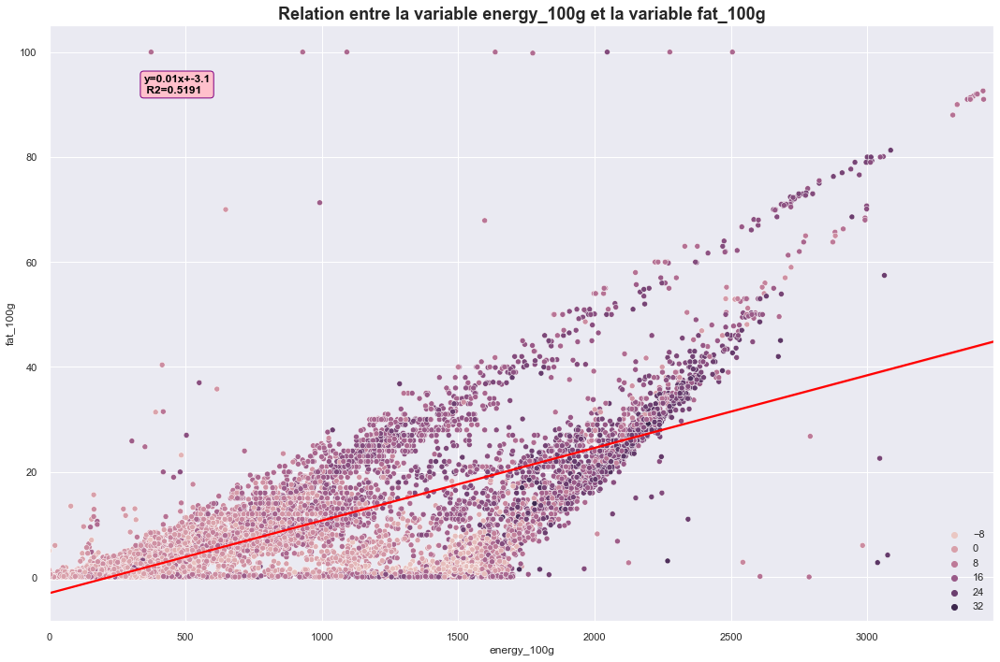

<Figure size 1080x720 with 0 Axes>

In [58]:
# Nuage de points entre les variables energy_100g et fat_100g
scatter_plot(df_subset, 'energy_100g', 'fat_100g', df_numerique, 'nutrition-score-fr_100g')
plt.savefig('GRAPHS/graph_exploration/32- Energy_fat')
plt.show()

Le coefficient de Pearson est de 0.6363444901608714


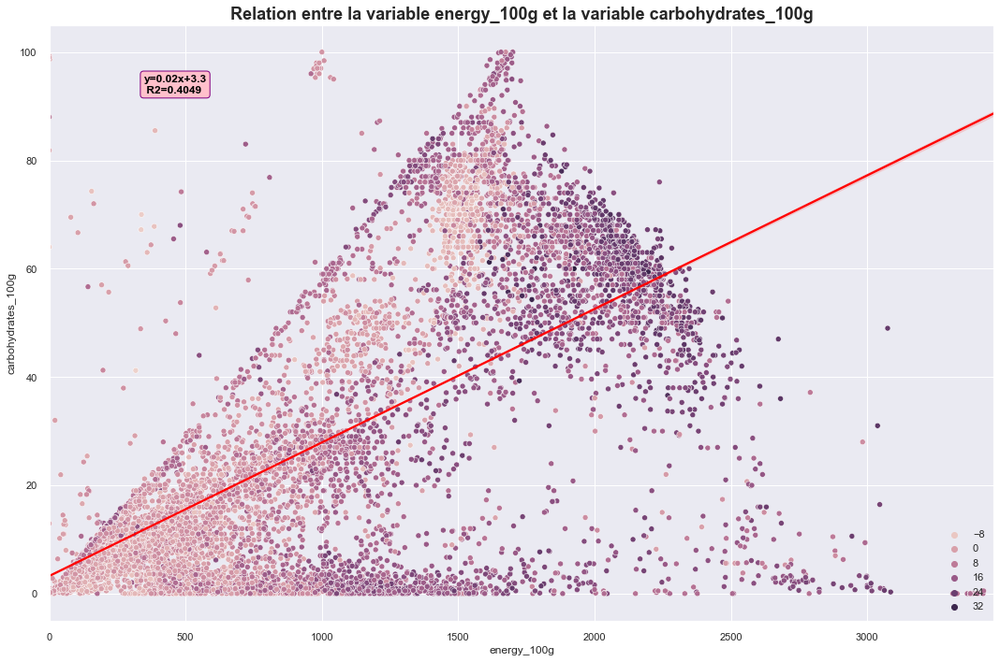

<Figure size 1080x720 with 0 Axes>

In [59]:
# Nuage de points entre les variables energy_100g et fat_100g
scatter_plot(df_subset, 'energy_100g', 'carbohydrates_100g', df_numerique, 'nutrition-score-fr_100g')
plt.savefig('GRAPHS/graph_exploration/33- Energy_carbo')
plt.show()

Le coefficient de Pearson est de 0.9999999560426331


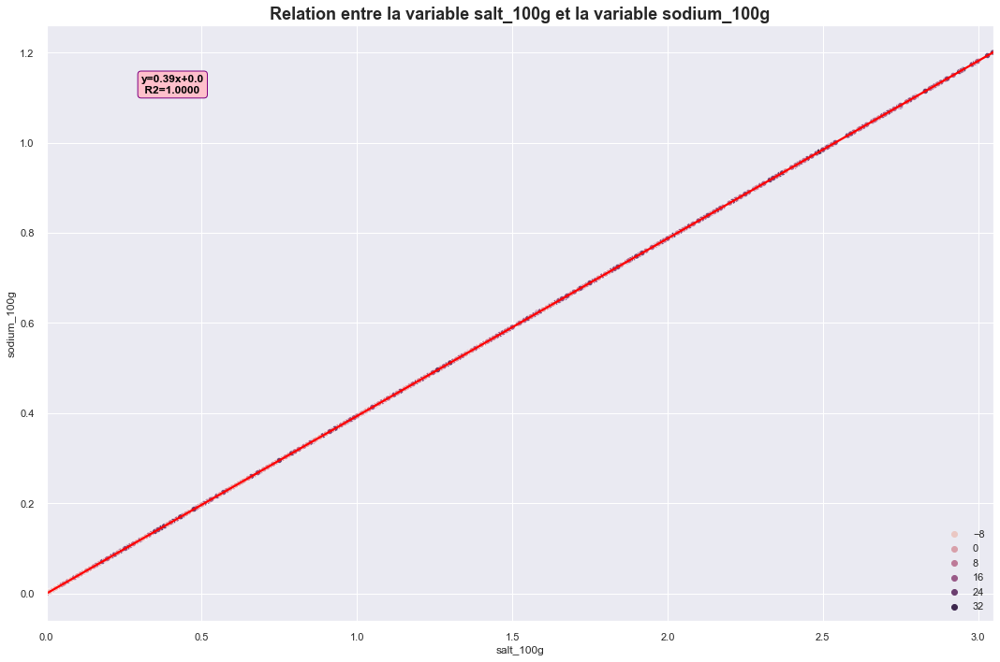

<Figure size 1080x720 with 0 Axes>

In [60]:
# Nuage de points entre les variables salt_100g et sodium_100g.
scatter_plot(df_subset, 'salt_100g', 'sodium_100g', df_numerique, 'nutrition-score-fr_100g')
plt.savefig('GRAPHS/graph_exploration/34- Salt_sod')
plt.show()

Le coefficient de Pearson est de 0.6924532560806308


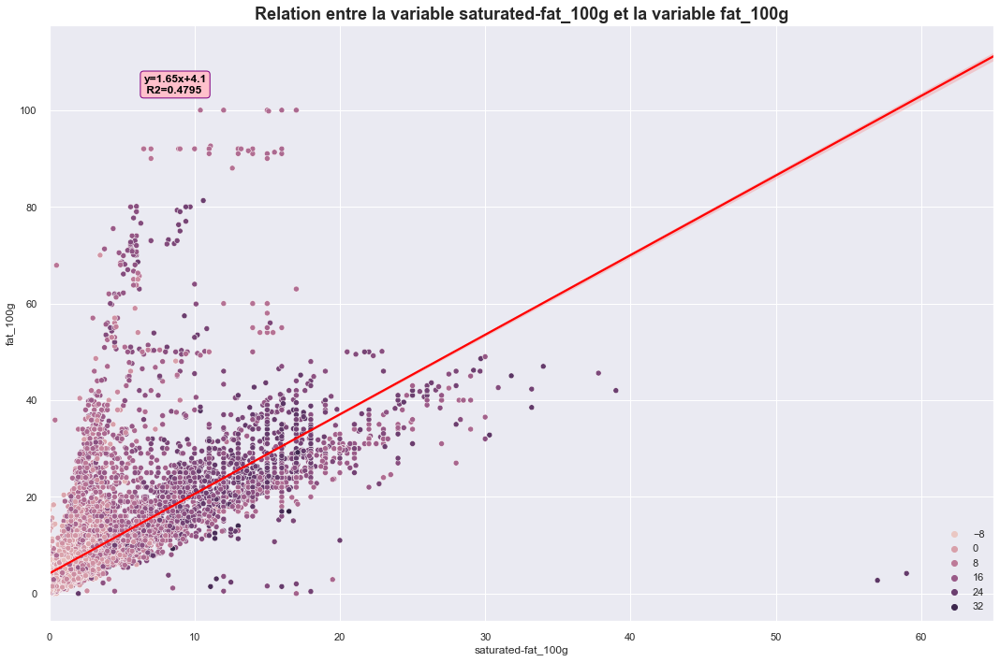

<Figure size 1080x720 with 0 Axes>

In [61]:
# Nuage de points entre les variables 'fat_100g' et 'saturated-fat_100g'.
scatter_plot(df_subset, 'saturated-fat_100g', 'fat_100g', df_numerique, 'nutrition-score-fr_100g')
plt.savefig('GRAPHS/graph_exploration/35- Sat_fat')
plt.show()

Le coefficient de Pearson est de 0.6211556204151877


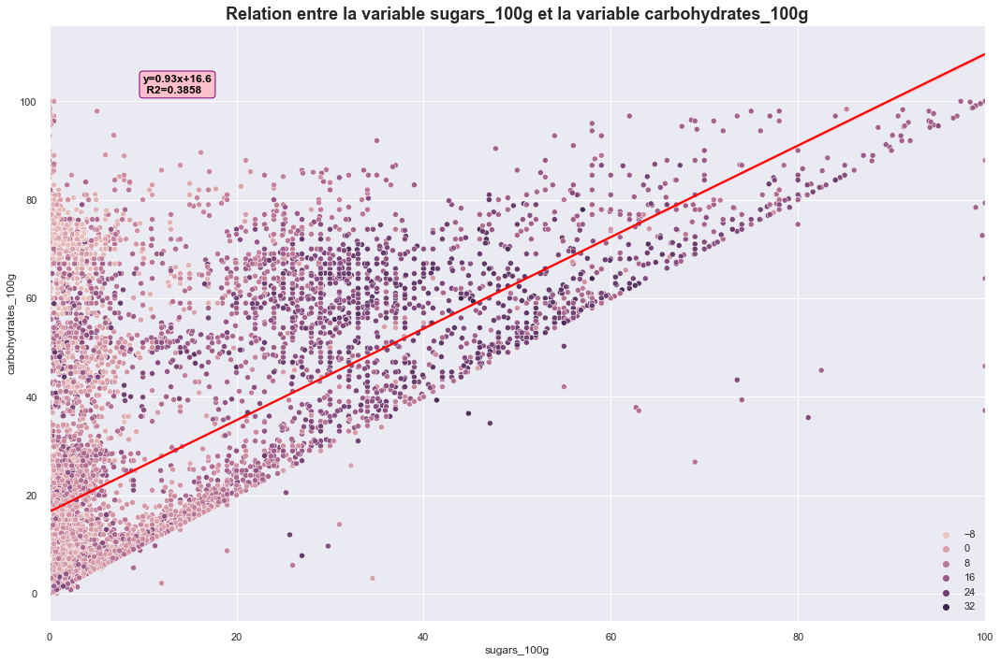

<Figure size 1080x720 with 0 Axes>

In [62]:
# Nuage de points entre les variables sugars_100g et carbohydrates_100g.
scatter_plot(df_subset, 'sugars_100g', 'carbohydrates_100g', df_numerique, 'nutrition-score-fr_100g')
plt.savefig('GRAPHS/graph_exploration/36- Sugar_carbo')
plt.show()

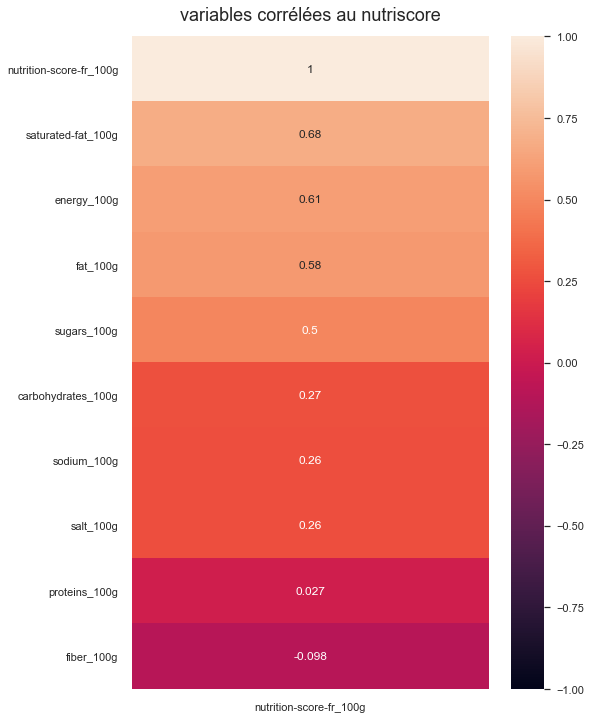

In [63]:
# II-1-4 Variables quantitatives corrélées au nutriscore.
# II-1-4-1 Matrice de corrélation.
plt.figure(figsize=(8, 12))
heatmap = sns.heatmap(df_numerique.corr()[['nutrition-score-fr_100g']].sort_values(by='nutrition-score-fr_100g', ascending=False), vmin=-1, vmax=1, annot=True)
heatmap.set_title('variables corrélées au nutriscore', fontdict={'fontsize':18}, pad=16);
plt.savefig('GRAPHS/graph_exploration/37- Nutriscore_corr')
plt.show()

In [64]:
# II-1-4-2 Nuage de points des variables quantitatives les plus corrélées au nutriscore.
# Fonction
def scatter_plot_nut(dataframe, col1, col2):
  sns.set(style="darkgrid", color_codes=True)
  print("Le coefficient de Pearson est de {}".format(np.corrcoef(dataframe[col1], dataframe[col2])[0][1]))
  g = sns.jointplot(x= col1, y= col2, data=dataframe,kind='reg', hue=col2, joint_kws={'scatter_kws':{'color':'black', 's':2}, 'line_kws':{'color':'red'}}, size=10)
  r, p = stats.pearsonr(dataframe[col1], dataframe[col2])
  #  g.ax_joint.annotate(f'$\\rho = {r:.3f}, p = {p:.3f}$',
  g.ax_joint.annotate(f'R2 = {r*r:.6f}',
                      xy=(0.1, 0.9), xycoords='axes fraction',
                      ha='left', va='center',
                      bbox={'boxstyle': 'round', 'fc': 'powderblue', 'ec': 'navy'})
  #g.ax_joint.scatter(subset['energy-kcal_100g'], subset['nutriscore_score'])
  #g.set_axis_labels(xlabel='a', ylabel='b', size=15)
  #plt.tight_layout()
  plt.show()

In [65]:
# Fonction Scatter plot nutriscore.
def scatter_plot_nutriscore(dataframe_point, colX, colY, dataframe_reg):
  print("Le coefficient de Pearson est de {}".format(np.corrcoef(dataframe_reg[colX], dataframe_reg[colY])[0][1]))
  print(' ')
  print(' ')
  sns.set(style="darkgrid", color_codes=True)
  sns.set(rc={'figure.figsize':(15,10)})
  r, p = stats.pearsonr(dataframe_reg[colX], dataframe_reg[colY])
  slope, intercept, r_value, p_value, std_err = stats.linregress(dataframe_reg[colX], dataframe_reg[colY])
  ax = sns.scatterplot(data=dataframe_point, x=colX, y=colY, color='blue', s=14)
  p=sns.regplot(data=dataframe_reg, x=colX, y=colY, scatter=False, ci=68, ax=ax, line_kws={'color':'red'})
 
  # plot legend
  #ax.legend()   #"
  p.annotate(f'y={slope:.2f}x+{intercept:.1f}\n R2={r*r:.4f}',
                      xy=(0.1, 0.9), xycoords='axes fraction',
                      ha='left', va='center',
                      color='black',
                      fontweight="bold",
                      bbox={'boxstyle': 'round', 'fc': 'pink', 'ec': 'purple'})
  
  plt.title("Relation entre la variable {} et la variable {}".format(colX, colY), fontsize=22, fontweight="bold")
  #ax.text(700, ,"y={0:.1f}x+{1:.1f}\n R2={2:.1f}".format(slope,intercept, r*r), fontsize=12, color=blue)
  #plt.xticks(fontsize=36)
  plt.xlabel(colX, fontsize=24)
  plt.ylabel(colY, fontsize=24)
  plt.tight_layout()
  plt.show()

Le coefficient de Pearson est de 0.6062697055725494
 
 


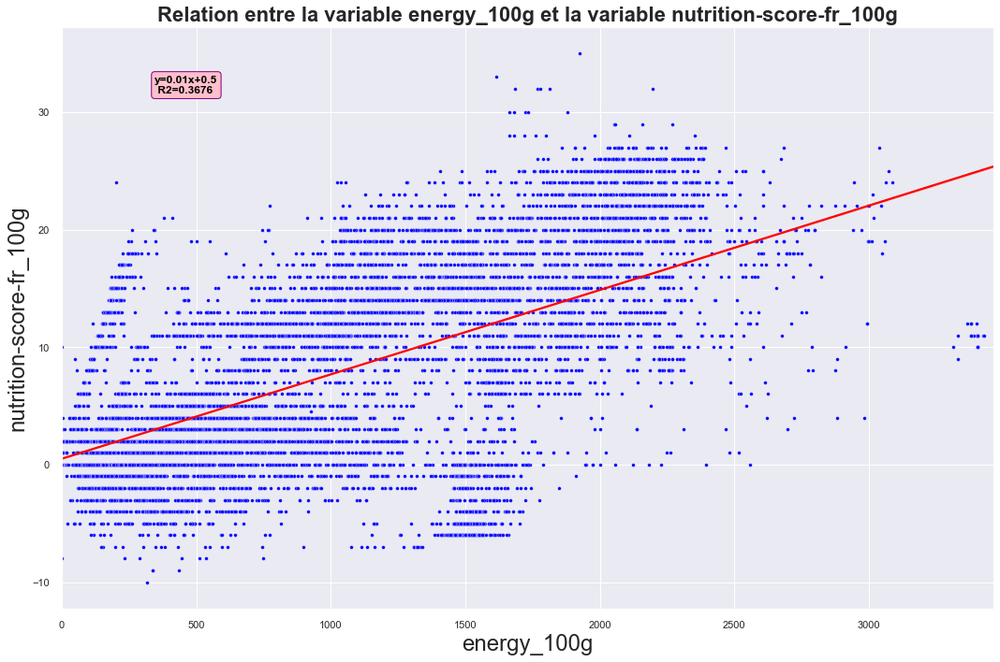

<Figure size 1080x720 with 0 Axes>

In [66]:
# Nuage de points entre les variables energy_100g et nutrition-score-fr_100g.
scatter_plot_nutriscore(df_subset, 'energy_100g', 'nutrition-score-fr_100g', df_numerique)
plt.savefig('GRAPHS/graph_exploration/38- Energy_nutri')
plt.show()

Le coefficient de Pearson est de 0.5825795176547911
 
 


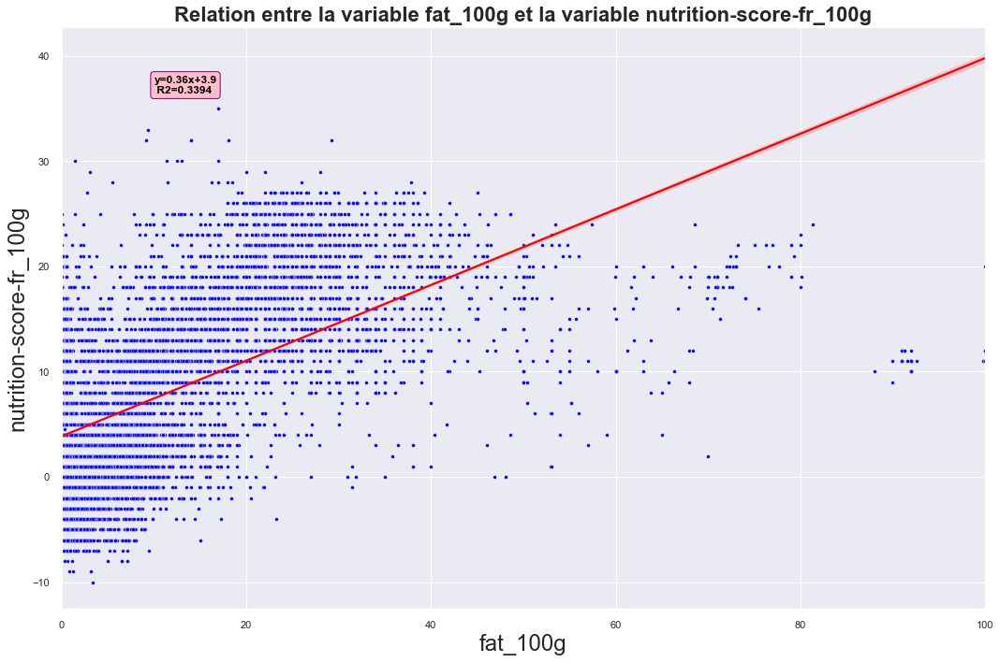

<Figure size 1080x720 with 0 Axes>

In [67]:
# Nuage de points entre la variables fat_100g et nutrition-score-fr_100g.
scatter_plot_nutriscore(df_subset, 'fat_100g', 'nutrition-score-fr_100g', df_numerique)
plt.savefig('GRAPHS/graph_exploration/39- Fat_nutri')
plt.show()

Le coefficient de Pearson est de 0.6783741100817798
 
 


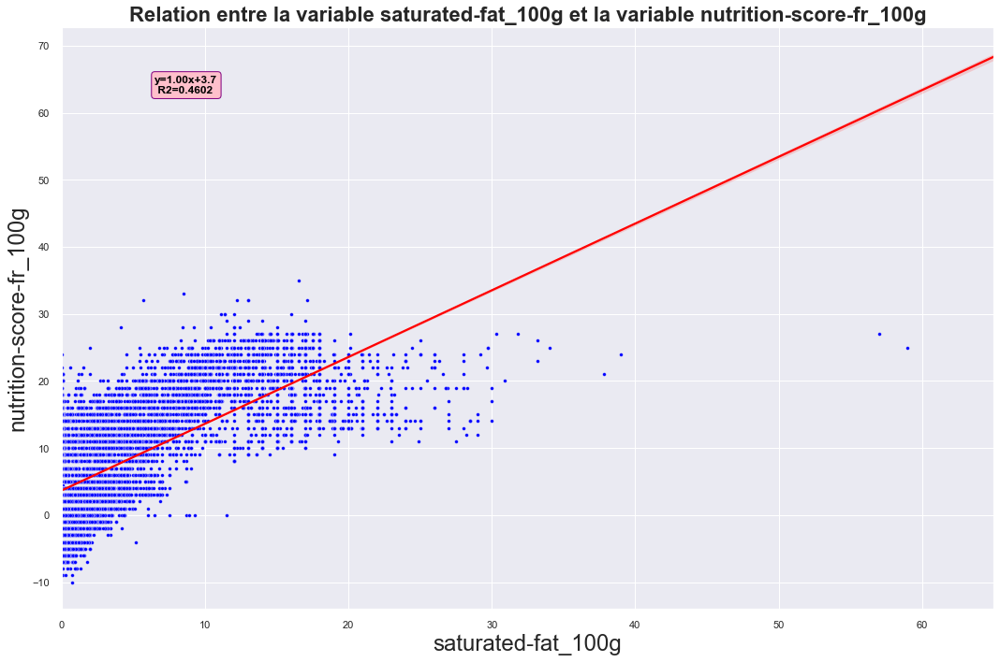

<Figure size 1080x720 with 0 Axes>

In [68]:
# Nuage de points entre la variables saturated-fat_100g et nutrition-score-fr_100g.
scatter_plot_nutriscore(df_subset, 'saturated-fat_100g', 'nutrition-score-fr_100g', df_numerique)
plt.savefig('GRAPHS/graph_exploration/40- Sat_nutri')
plt.show()

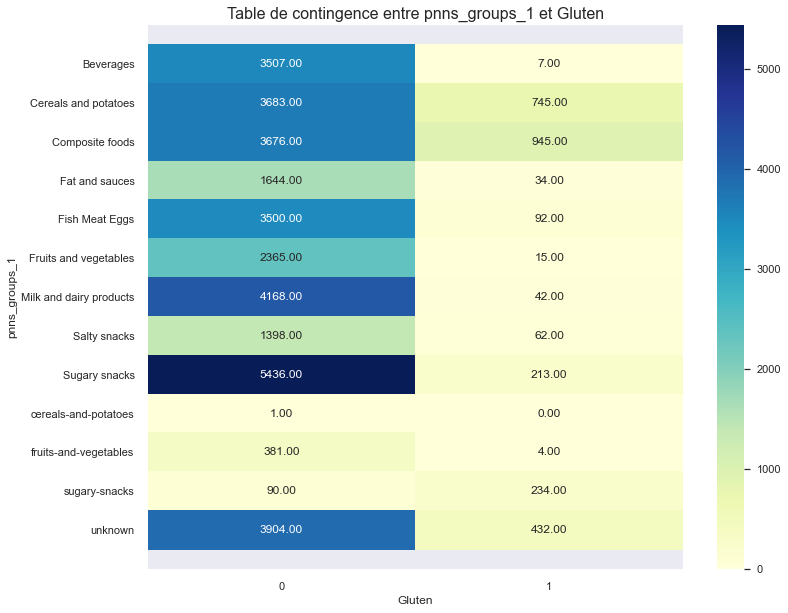

In [69]:
# II-2  Analyse Bivariéé des Variables Qualitatives.
# II-2-1 Matrice des Corrélations entre Les Variables Quanlitatives.
# II-2-1-1-Table de contingence entre les variables catégorielles pnns_groups_1 et Gluten.
f, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(pd.crosstab(df['pnns_groups_1'],df['Gluten']), annot=True, fmt='.2f', cmap="YlGnBu")
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.title('Table de contingence entre pnns_groups_1 et Gluten',fontsize=16)
plt.savefig('GRAPHS/graph_exploration/41- Table_contgce1')
plt.show()

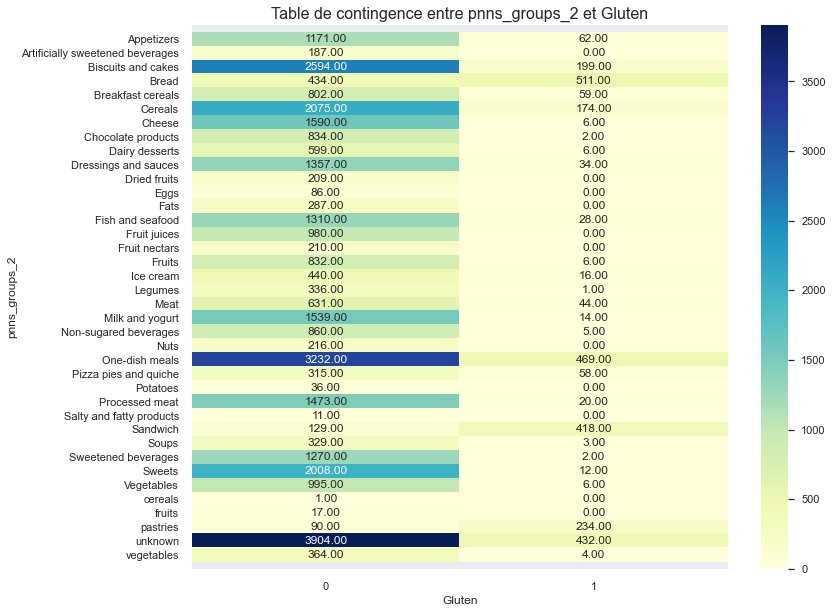

In [70]:
# II-2-1-2-Table de contingence entre les variables catégorielles pnns_groups_2 et Gluten.
f, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(pd.crosstab(df['pnns_groups_2'],df['Gluten']), annot=True, fmt='.2f', cmap="YlGnBu")
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.title('Table de contingence entre pnns_groups_2 et Gluten',fontsize=16)
plt.savefig('GRAPHS/graph_exploration/42- Table_contgce2')
plt.show()

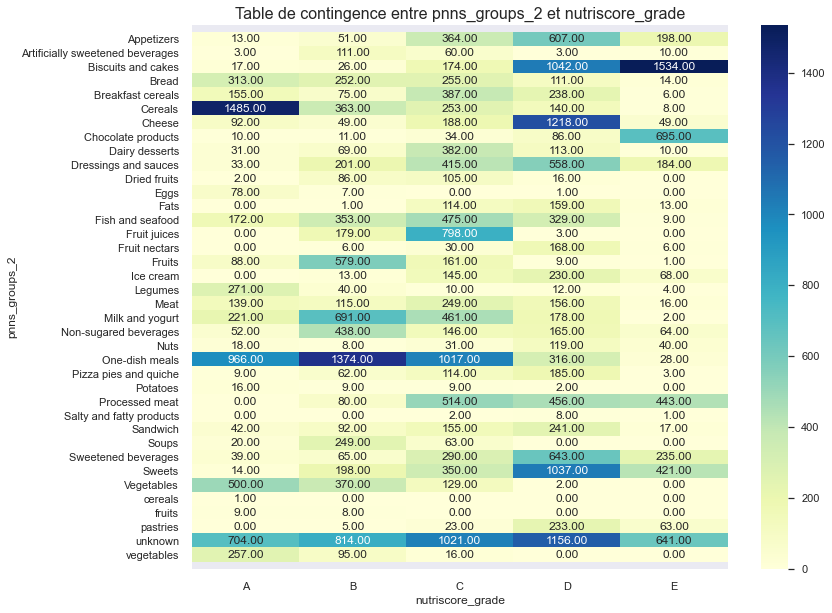

In [71]:
# II-2-1-3 Table de contingence entre les variables catégorielles pnns_groups_2 et nutriscore_grade.
f, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(pd.crosstab(df['pnns_groups_2'],df['nutriscore_grade']), annot=True, fmt='.2f', cmap="YlGnBu")
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.title('Table de contingence entre pnns_groups_2 et nutriscore_grade',fontsize=16)
plt.savefig('GRAPHS/graph_exploration/43- Table_contgce3')
plt.show()

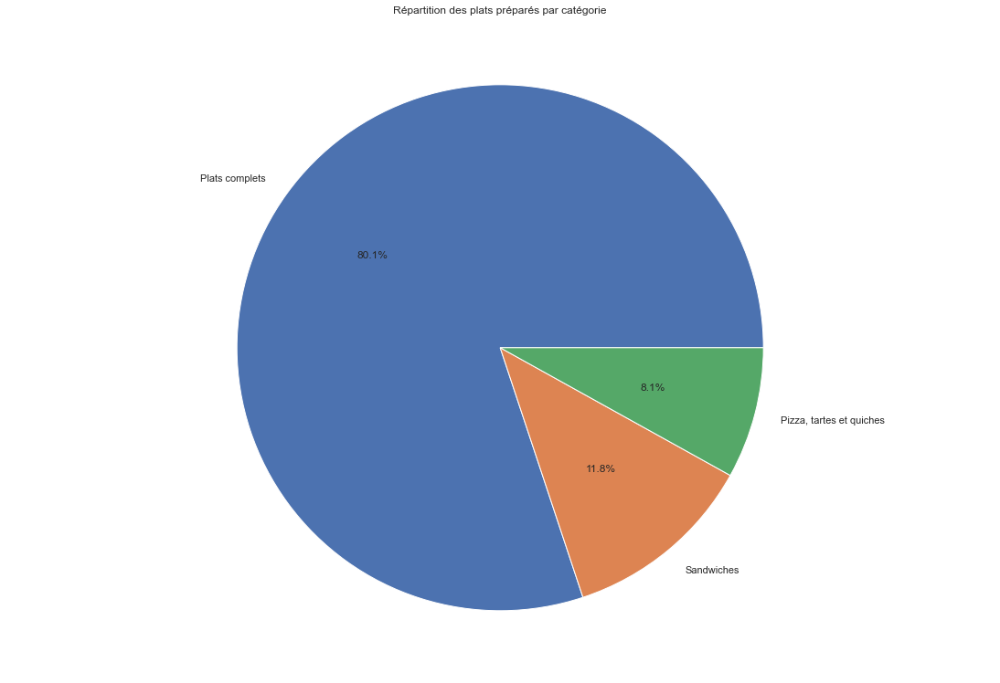

In [72]:
# Représentation graphique d'une analyse bivariée entre deux variables qualitatives.
df_PlatsPrepares0 = df[df['pnns_groups_1'] == 'Composite foods']
categorie = df_PlatsPrepares0['pnns_groups_2'].value_counts(normalize=False)
cat = pd.DataFrame({'catégorie':  categorie.index, 'nombre': categorie})
cat = cat.reset_index()
cat = cat.drop(cat.columns[0], axis=1)
values = cat['nombre']
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.axis('equal')
ax.pie(values, labels = ['Plats complets', 'Sandwiches', 'Pizza, tartes et quiches'], autopct='%1.1f%%')
plt.title('Répartition des plats préparés par catégorie')
plt.savefig('GRAPHS/graph_exploration/44- Pie_cat1')
plt.show()

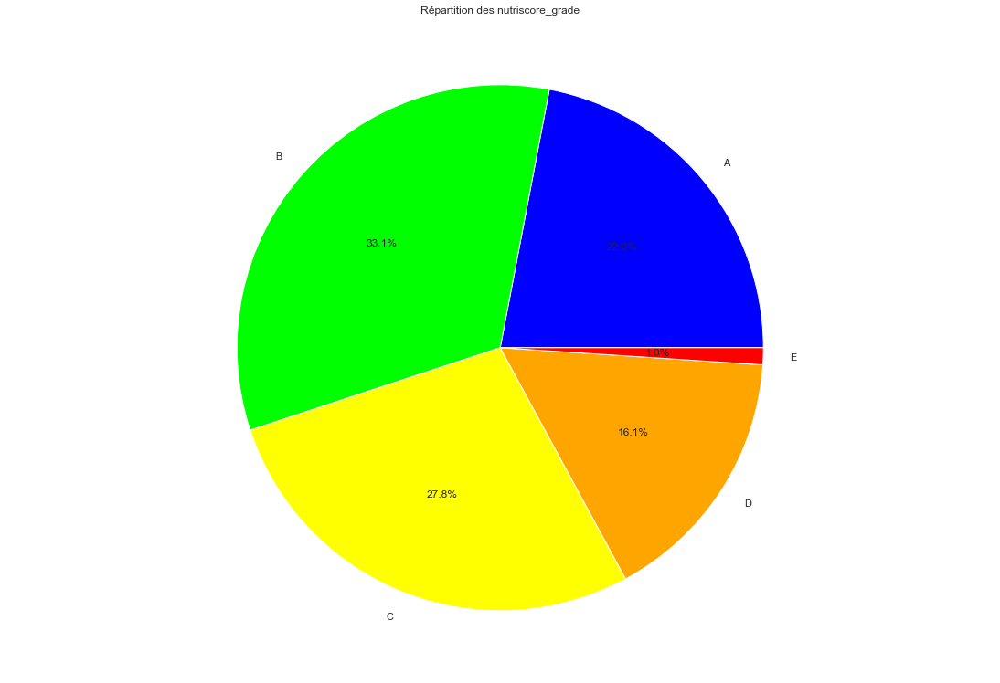

In [73]:
# Analyse entre le nutriscore_grade et les plats compsites.
scores_count = df_PlatsPrepares0['nutriscore_grade'].value_counts(normalize=False)
nutriscores = pd.DataFrame({'score':  scores_count.index, 'nombre': scores_count})
nutriscores = nutriscores.sort_values(by='score')
nutriscores = nutriscores.reset_index()
nutriscores = nutriscores.drop(nutriscores.columns[0], axis=1)
values = nutriscores['nombre']
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.axis('equal')
ax.pie(values, labels = nutriscores['score'], colors=('blue','lime', 'yellow', 'orange', 'red'), autopct='%1.1f%%')
plt.title('Répartition des nutriscore_grade')
plt.savefig('GRAPHS/graph_exploration/45- Nutriscore_grade2')
plt.show()

In [74]:
# Analyses suite et fin des variables qualitatives entre elles.
Pizza = df_PlatsPrepares0[df_PlatsPrepares0['pnns_groups_2'] == 'Pizza pies and quiche']
OneDish = df_PlatsPrepares0[df_PlatsPrepares0['pnns_groups_2'] == 'One-dish meals']
Sandwich = df_PlatsPrepares0[df_PlatsPrepares0['pnns_groups_2'] == 'Sandwich']
dfs = [Pizza, OneDish, Sandwich]
nom_dfs = ['Pizza, tartes et quiches', 'Plats Complets', 'Sandwiches']
fig = plt.figure(figsize=(18,10), dpi=1600)
plt.title('Répartition des nutriscore_grade', fontsize=20)
for i in range(3):
    dfa = dfs[i]
    scores_count = dfa['nutriscore_grade'].value_counts(normalize=False)
    nutriscores = pd.DataFrame({'score':  scores_count.index, 'nombre': scores_count})
    nutriscores = nutriscores.sort_values(by='score')
    nutriscores = nutriscores.reset_index()
    nutriscores = nutriscores.drop(nutriscores.columns[0], axis=1)
    values = nutriscores['nombre']
    ax1 = plt.subplot2grid((1,3), (0, i))
    plt.pie(values, labels = nutriscores['score'], colors=('blue','lime', 'yellow', 'orange', 'red'), autopct='%1.1f%%')
    plt.title(nom_dfs[i])
plt.savefig('GRAPHS/graph_exploration/46- Plat_nutri')
plt.show()

In [75]:
# Relation entre le nutriscore et pnns_groups_1
for features in  ["nutriscore_grade"] : 
    fig =  px.histogram( df,  color =  features,  x  =  "pnns_groups_1", 
    color_discrete_sequence = ["blue", "lime", "red",  "yellow",  "orange"]).update_xaxes (categoryorder='category ascending') 
    fig.update_layout(title_text="Répartition des nutriscore_grade par catégorie de pnns_groups_1")
    plt.savefig('GRAPHS/graph_exploration/47- Nutri_cat2')
    fig.show() 
    #["vert", "citron vert", "jaune", "orange", "rouge"]

<Figure size 1080x720 with 0 Axes>

In [76]:
# Relation entre le nutriscore et pnns_groups_2
for features in  ["nutriscore_grade"] : 
    fig =  px.histogram( df,  color =  features,  x  =  "pnns_groups_2", 
    color_discrete_sequence = ["blue", "lime", "red",  "yellow",  "orange"]).update_xaxes (categoryorder='category ascending') 
    fig.update_layout(title_text="Répartition des nutriscore_grade par catégorie de pnns_groups_2")
    plt.savefig('GRAPHS/graph_exploration/48- Nutri_cat3')
    fig.show() 
    #["vert", "citron vert", "jaune", "orange", "rouge"]

<Figure size 1080x720 with 0 Axes>

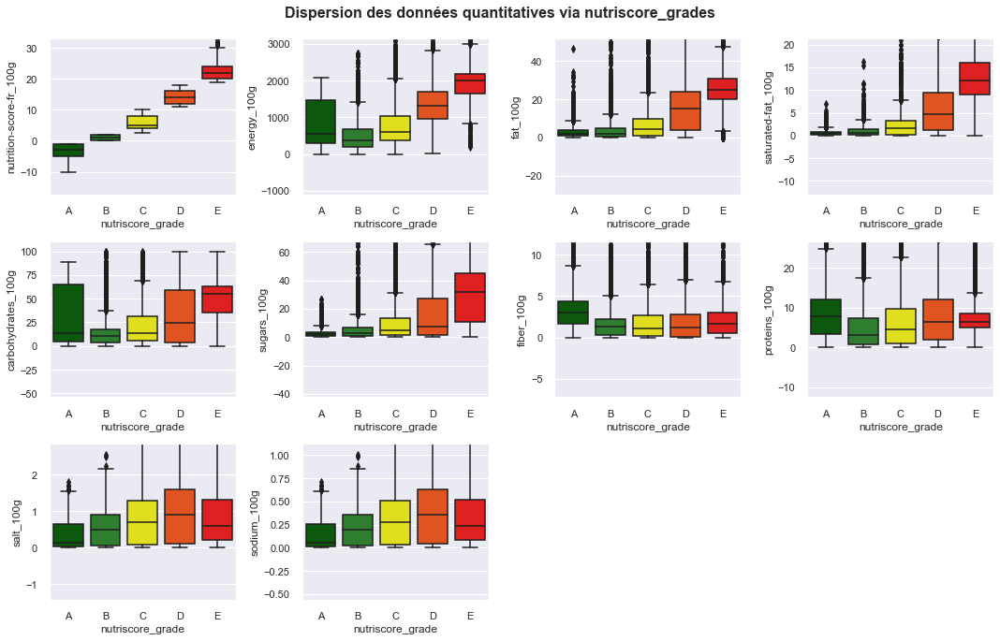

In [77]:
# II-3  Analyse Bivariéé des Variables Quantitatives et Qualitatives.
# II-3-1 Boxplot de nutri_pal = ['darkgreen', 'forestgreen', 'yellow', 'orangered', 'red']
# nutriscore_grade et principaux composants nutritionnels.
# Nous aimerions savoir quels composants nutritionnels ont le plus d'influence sur le nutrigrade d'un produit. Traçons des boîtes à moustaches pour chaque caractéristique quantitative pour chaque nutrigrade.
# Tracer la boîte à moustaches des caractéristiques quantitatives pour chaque nutriscore_grade
nutri_pal = ['darkgreen', 'forestgreen', 'yellow', 'orangered', 'red']

fig = plt.figure(figsize=(15,10))
with sns.color_palette(nutri_pal):
    for i, c in enumerate(quant_cols,1):
        ax = fig.add_subplot(3,4,i)
        sns.boxplot(data=df, x='nutriscore_grade', y=c, order=['A', 'B', 'C', 'D', 'E'], ax=ax)
        min = df[c].mean()-3*df[c].std()
        max = df[c].mean()+3*df[c].std()
        plt.ylim(min,max)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.suptitle('Dispersion des données quantitatives via nutriscore_grades', fontsize=16,
             fontweight='bold')
#if plot_enabled: plt.savefig(os.getcwd()+'/FIG/'+'A_3_1_nutrigrade_boxplots.png',
#                             dpi=400);
plt.savefig('GRAPHS/graph_exploration/49- Nutri_num1')
plt.show()


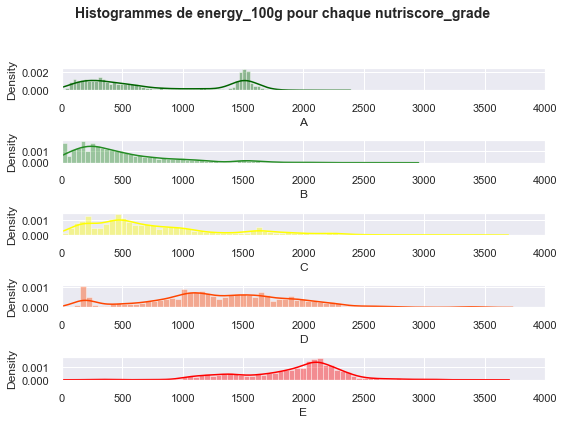

In [78]:
# Sélection de la série nutriscore des catégories pnns2 à comparer.

gb = df.groupby('nutriscore_grade')['energy_100g']
nutrigr_df = pd.DataFrame([gb.get_group(n).values for n in ['A', 'B', 'C', 'D', 'E']],
                            index = ['A', 'B', 'C', 'D', 'E']).T
# Tracer l'histogramme pour chaque catégorie.
fig = plt.figure(figsize=(8,6))
i=0
for n, c in zip(['A', 'B', 'C', 'D', 'E'], nutri_pal):
    i+=1
    ax = fig.add_subplot(5,1,i)
    sns.distplot(nutrigr_df[n], color=c, bins=70)
    ax.set(xlim=(0,4000))
fig.suptitle('Histogrammes de energy_100g pour chaque nutriscore_grade',
             fontweight='bold', fontsize=14)
plt.tight_layout(rect=[0,0.0,1,0.93])
#if plot_enabled: plt.savefig(os.getcwd()+'/FIG/'+'A_3_1_nutrigrade_energy.png',
#                             dpi=400);
plt.show()

,product_name,pnns_groups_1,pnns_groups_2
22236,Riz Basmati,Cereals and potatoes,Cereals
1915,Chickpeas,Cereals and potatoes,Legumes
28962,Petits pains grillés multi céréales,Cereals and potatoes,Bread
35047,Capellini n.1 (Lot x 3),Cereals and potatoes,Cereals
28027,Riz thaï,unknown,unknown



3 pnns_groups_2 plus représentés:  Index(['Cereals', 'Breakfast cereals', 'Bread'], dtype='object') 



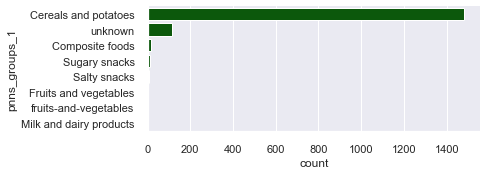

In [79]:
# Les conclusions suivantes peuvent être faites à partir de ces histogrammes :
# les distributions se déplacent globalement vers des valeurs plus élevées (extrêmes) de A à E.
# Les catégories A et E ont des distributions bimodales : certains produits A sont à haute énergie et les produits E à basse énergie.
# Voyons quels sont ces produits :
# avec A nutriscore_grade et haute énergie.
# avec E nutriscore_grade et basse énergie.
# Tracer un échantillon de produits A à haute énergie et
# déterminer les pnns correspondant aux catégories d'aliments.

cond1 = df['nutriscore_grade']=='A'
cond2 = df['energy_100g'].between(1450,3700)
A_high_en_df = df.loc[cond1&cond2, ['product_name', 'pnns_groups_1', 'pnns_groups_2']]
display(A_high_en_df.sample(5))
vc1 = A_high_en_df['pnns_groups_1'].value_counts()
vc2 = A_high_en_df['pnns_groups_2'].value_counts()

print("\n3 pnns_groups_2 plus représentés: ", vc2.index[0:3],'\n' )

sns.catplot(y="pnns_groups_1", kind="count", color='darkgreen', data=A_high_en_df,
            orient='h', order=vc1.index)
plt.gcf().set_size_inches(8,2)
#if plot_enabled: plt.savefig(os.getcwd()+'/FIG/'+'A_3_1_high_energy_A.png',
#                             dpi=400);
plt.savefig('GRAPHS/graph_exploration/50- Nutri_num2')
plt.show()

In [80]:
# On voit ici qu'en effet, les céréales et les fruits à coque, étant des aliments très denses, ont un taux énergétique élevé mais un nutriscore_grade faible.

,product_name,pnns_groups_1,pnns_groups_2,sugars_100g
24606,Piña Colada Sans alcool,Beverages,Sweetened beverages,12.0
29773,Caramel au beurre salé à tartiner,unknown,unknown,46.7
32599,Cécémel boisson,Beverages,Non-sugared beverages,11.7
36528,Banane,Beverages,Fruit nectars,14.0
26222,Deli Max chocolat,Beverages,Sweetened beverages,13.0



3 pnns_groups_2 plus représentés:  Index(['Sweetened beverages', 'Non-sugared beverages', 'Fruit nectars'], dtype='object') 



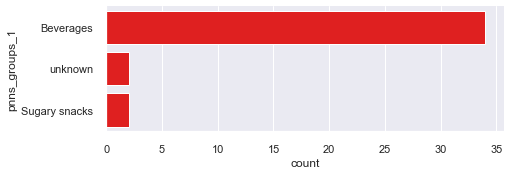

In [81]:
# Tracer un échantillon de produits E à faible énergie et
# déterminer les pnns correspondant aux catégories d'aliments.
cond1 = df['nutriscore_grade']=='E'
cond2 = df['energy_100g'].between(0,500)
A_high_en_df = df.loc[cond1&cond2, ['product_name', 'pnns_groups_1', 'pnns_groups_2','sugars_100g']]
display(A_high_en_df.sample(5))
vc1 = A_high_en_df['pnns_groups_1'].value_counts()
vc2 = A_high_en_df['pnns_groups_2'].value_counts()

print("\n3 pnns_groups_2 plus représentés: ", vc2.index[0:3],'\n' )

sns.catplot(y="pnns_groups_1", kind="count", color='red', data=A_high_en_df,
            orient='h', order=vc1.index)
plt.gcf().set_size_inches(8,2)
#if plot_enabled: plt.savefig(os.getcwd()+'/FIG/'+'A_3_1_low_energy_E.png',
#                             dpi=400);
plt.savefig('GRAPHS/graph_exploration/51- Nutri_num3')
plt.show()

In [82]:
# Presque tous les produits à haut nutriscore et à faible teneur énergétique sont des boissons à haute teneur en sucre.
# Les résultats ci-dessus indiquent que les catégories d'aliments sont très informatives et doivent être prises en compte dans la recherche d'aliments sains.
# Catégories d'aliments et nutriscore.
# Regardons la dispersion des valeurs quantitatives pour les principales catégories d'aliments. Nous utiliserons les catégories pnns1 dans un premier temps.

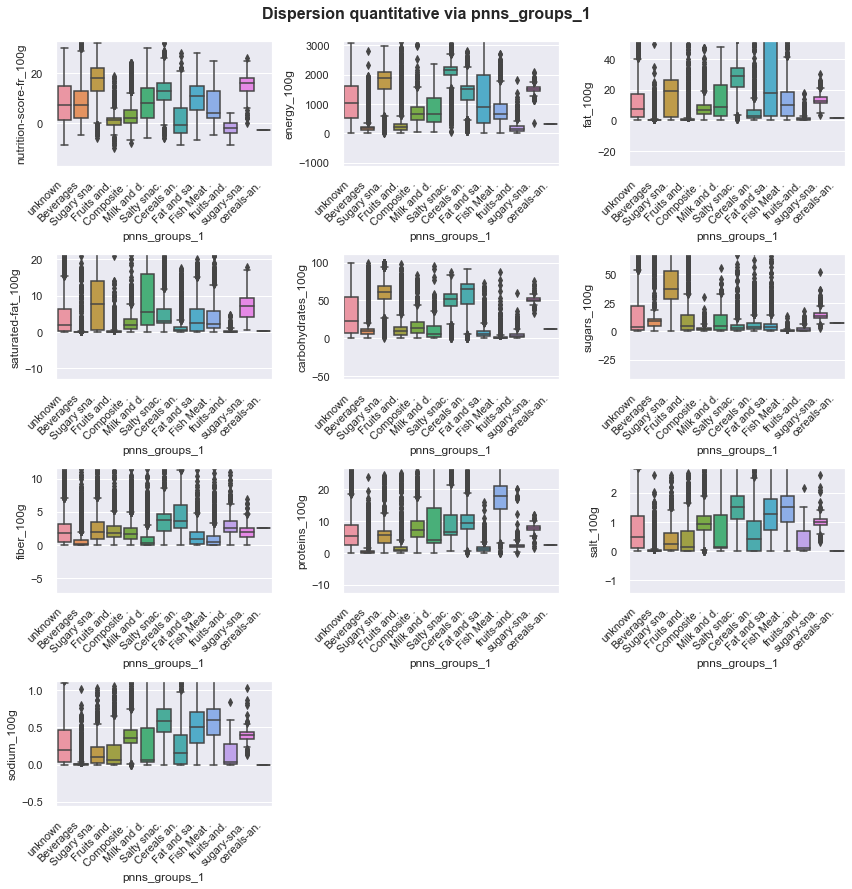

In [83]:
# Tracer des boîtes à moustaches de chaque donnée quantitative pour chaque catégorie pnns1. 
pnns1_pal = sns.color_palette(palette='bright')
fig = plt.figure(figsize=(12,15))
with sns.color_palette(pnns1_pal):
    for i, c in enumerate(quant_cols,1):
        ax = fig.add_subplot(5,3,i)
        sns.boxplot(data=df, x='pnns_groups_1', y=c, ax=ax)# order=list('abcde')
        min = df[c].mean()-3*df[c].std()
        max = df[c].mean()+3*df[c].std()
        plt.ylim(min,max)
        labels = [item.get_text() for item in ax.get_xticklabels()]
        short_labels = [s[0:10]+'.' if len(s)>10 else s for s in labels]
        ax.axes.set_xticklabels(short_labels)
        plt.xticks(rotation=45, ha='right')
plt.tight_layout(rect=[0, 0.03, 1, 0.96])
plt.suptitle('Dispersion quantitative via pnns_groups_1', fontsize=16,
             fontweight='bold')
#if plot_enabled: plt.savefig(os.getcwd()+'/FIG/'+'A_3_1_pnns1_boxplots.png',
#                             dpi=400);
plt.savefig('GRAPHS/graph_exploration/52- Nutri_num4')
plt.show()

In [84]:
# D'après ces boîtes à moustaches, nous pouvons émettre l'hypothèse que les catégories pnns1 ne sont homogènes par aucune valeur quantitative.
# Traçons les valeurs moyennes de 'nutriscore' pour chaque catégorie 'pnns1'.
df.groupby(['pnns_groups_1'])['nutrition-score-fr_100g'].agg([np.median, np.mean, np.std]).T

pnns_groups_1,Beverages,Cereals and potatoes,Composite foods,Fat and sauces,Fish Meat Eggs,Fruits and vegetables,Milk and dairy products,Salty snacks,Sugary snacks,cereals-and-potatoes,fruits-and-vegetables,sugary-snacks,unknown
median,7.000000,-1.000000,2.000000,11.000000,4.000000,1.000000,8.000000,13.000000,18.000000,-3.0,-2.000000,16.000000,7.000000
mean,8.270916,1.168248,3.504869,10.558999,7.630011,0.856933,8.035629,12.917123,17.048770,-3.0,-2.055844,15.225309,8.152214
std,6.725010,6.497548,5.589050,6.325765,7.436116,3.011644,6.642567,5.958215,6.661228,NaN,2.763720,4.145404,8.477034


In [85]:
# 2- Time analysis.
# Not necessary for this analysis.
# 2.0 Functions.
# Plotting heatmap (3 options available, rectangle,
# triangle of table of contingency)

def plot_heatmap(corr, title, figsize=(8,4), vmin=-1, vmax=1, center=0,
                 palette = sns.color_palette("coolwarm", 20), shape='rect',
                 fmt='.2f', robust=False):
    
    fig, ax = plt.subplots(figsize=figsize)
    if shape == 'rect':
        mask=None
    elif shape == 'tri':
        mask = np.zeros_like(corr, dtype=np.bool)
        mask[np.triu_indices_from(mask)] = True
    else:
        print('ERROR : this type of heatmap does not exist')

    palette = palette
    ax = sns.heatmap(corr, mask=mask, cmap=palette, vmin=vmin, vmax=vmax,
                     center=center, annot=True, annot_kws={"size": 10},fmt=fmt,
                     square=False, linewidths=.5, linecolor = 'white',
                     cbar_kws={"shrink": .9, 'label': None}, robust = robust,
                     xticklabels= corr.columns, yticklabels = corr.index)
    ax.tick_params(labelsize=10,top=False, bottom=True,
                labeltop=False, labelbottom=True)
    ax.collections[0].colorbar.ax.tick_params(labelsize=10)
    plt.setp(ax.get_xticklabels(), rotation=25, ha="right",rotation_mode="anchor")
    ax.set_title(title, fontweight='bold', fontsize=12)
    # return mask

In [86]:
# Function applying stationary tests to data and returning if stat. or not

def stationary_tests(data, print_opt=True):

    data_m = np.array(data[~np.isnan(data)])
    stat, p, lags, crit = kpss(data_m, lags='auto')
    result = adfuller(data_m)

    if print_opt:

        # : H0 : series is not trend-stationary.
        print('--- Kwiatkowski---') 
        print('stat=%.3f, p=%.3f' % (stat, p))
        # not rejected -> series is not trend-stationary.
        print('prob. not trend-stationary') if p > 0.05\
             else print('prob. trend-stationary') # rejected -> trend-stationary
        
        # H0 there is a unit root i.e. series is non-stationary
        print('--- Aug. Dickey-Fuller ---\n stat.: %f' % result[0]) 
        print('p-value: %f' % result[1])
        # not rejected -> series is non-stationary
        print('prob. not stationary\n') if result[1] > 0.05\
                    else print('prob. stationary\n' )# rejected -> stationary
    # True : stationnary/trend-stationnary
    return {'Kwiatkowski': (round(p,4), str(p <= 0.05)),
            'Aug. Dickey-Fuller': (round(result[1],4), str(result[1] <= 0.05))}

In [87]:
# Function
def id_cat_distrib_tests(data_df, Q_col, C_col, print_opt=True):

    gb = data_df.groupby(C_col)[Q_col]
    cat = list(gb.groups.keys())
    cat_series = [gr.dropna().values for n, gr in gb]

    if print_opt: print('oooooooo- {} vs. {} -oooooooo'.format(Q_col, C_col))

    # Analysis of Variance Test
    stat1, p1 = f_oneway(*cat_series)
    if print_opt:
        print('---ANOVA---')
        print('stat=%.3f, p=%.10f' % (stat1, p1))
        print('Prob. same distr') if p1 > 0.05 else print('Prob. different distr')
    # Kruskal-Wallis H Test
    stat2, p2 = kruskal(*cat_series)
    if print_opt:
        print('---Kruskal-Wallis---')
        print('stat={:.3f}, p={:.10f}'.format(stat2, p2))
        print('Prob. same distr') if p2 > 0.05 else print('Prob. different distr')
        
    return {'ANOVA': (round(p1,4), str(p1 > 0.05)),
            'Kruskal-Wallis': (round(p2,4), str(p2 > 0.05))}

 # - > at least one of the groups has a significantly different mean from the others.

In [88]:
quant_cols = ['nutrition-score-fr_100g', 'energy_100g', 
 'fat_100g','carbohydrates_100g','proteins_100g',
'saturated-fat_100g', 'sugars_100g', 'fiber_100g',
 'salt_100g','sodium_100g']
# Testing each category for one chosen test

def mult_test(data_df, test_func, print_opt=True, res_df=pd.DataFrame(), **kwargs):

    res_df_mod = res_df.copy('deep')

    for c in data_df.select_dtypes(include=np.number).columns:
        if print_opt: print('oooo--'+c+'--oooo')
        if test_func=='stat':
            dic_stat = stationary_tests(data_df[c], print_opt=print_opt)
        elif test_func=='id_dist':
            dic_stat = id_cat_distrib_tests(data_df, C_col=kwargs['C_col'],
                                            Q_col=c, print_opt=print_opt)
        else:
            print('ERROR: this function does not exist')
        for s in dic_stat.keys():
            res_df_mod.loc[s,c] = str(dic_stat.get(s))

    return res_df_mod

In [89]:
# Les moyennes, ainsi que les écarts-types semblent différents, mais vérifions si ces écarts dans les valeurs moyennes sont statistiquement significatifs.
# Nous savons que les données ne sont pas normalement distribuées, nous ne devons donc pas utiliser l'ANOVA, car cela nécessite des données normalement distribuées. Nous utiliserons le test Kruskal-Wallis H (non paramétrique) qui ne nécessite que des données iid et imprimerons le résultat de l'ANOVA à titre informatif uniquement.
# Impression des résultats des tests ANOVA et Kruskal-Wallis pour 'nutriscore' vs 'pnns1'
# Tracé ANOVA et test Kruskall-Wallis H et retour si même dist. ou non.    
id_cat_distrib_tests(df[quant_cols+['pnns_groups_1']], C_col='pnns_groups_1', 
                     Q_col='nutrition-score-fr_100g', print_opt=True)

oooooooo- nutrition-score-fr_100g vs. pnns_groups_1 -oooooooo
---ANOVA---
stat=1894.896, p=0.0000000000
Prob. different distr
---Kruskal-Wallis---
stat=13781.630, p=0.0000000000
Prob. different distr


{'ANOVA': (0.0, 'False'), 'Kruskal-Wallis': (0.0, 'False')}

In [90]:
# Au moins une des distributions catégorielles (groupes pnns1) du nutriscore est significativement différente des autres.
# Voyons maintenant s'il y a une ou plusieurs caractéristiques quantitatives qui ont les distributions identiques pour toutes les catégories pnns1 :
# Résultats (p-value, même distr ou non) des tests ANOVA et Kruskal-Wallis
# pour les catégories 'nutriscore' vs. 'pnns1'.

id_distr_pnns1 = mult_test(df[quant_cols+['pnns_groups_1']], C_col='pnns_groups_1',
                           test_func='id_dist', print_opt=False)
id_distr_pnns1

,nutrition-score-fr_100g,energy_100g,fat_100g,carbohydrates_100g,proteins_100g,saturated-fat_100g,sugars_100g,fiber_100g,salt_100g,sodium_100g
ANOVA,"(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')"
Kruskal-Wallis,"(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')"


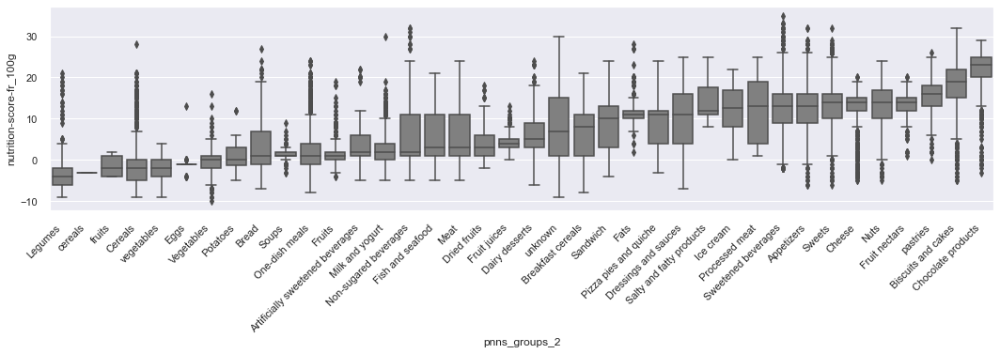

In [91]:
# Les tests ANOVA et Kruskal-Wallis indiquent que les distributions de toutes les valeurs quantitatives sont différentes selon les catégories pnns1.
# Jetons un coup d'œil au nutriscore des catégories d'aliments plus en détail en utilisant les catégories pnns2.
# Tracé des distributions du nutriscore pour chaque catégorie pnns2.

sorted_ind = pd.DataFrame(df.groupby(['pnns_groups_2'])['nutrition-score-fr_100g'].median())\
                                             .sort_values('nutrition-score-fr_100g').index

sns.boxplot(data=df, x='pnns_groups_2', y='nutrition-score-fr_100g', color='grey', order=sorted_ind)
plt.gcf().set_size_inches(18,4)
plt.xticks(rotation=45, ha='right');
#if plot_enabled: plt.savefig(os.getcwd()+'/FIG/'+'A_3_1_pnns2_nutriscore.png',
#                             dpi=400);
plt.savefig('GRAPHS/graph_exploration/53- Nutri_num5')
plt.show()

In [92]:
# Parmi toutes les catégories, les catégories 'pain', 'dessert lacté', 'plats plats', 'poissons et fruits de mer' et 'viande' ont une médiane très proche.

,mean,quant_0_25,median,quant_0_75,std
pnns_groups_2,,,,,
Bread,3.029630,-1.0,1.0,7.0,5.857703
Dairy desserts,6.191736,3.0,5.0,9.0,4.901304
One-dish meals,2.296677,-1.0,1.0,4.0,4.843950
Fish and seafood,4.743647,1.0,3.0,11.0,5.562124
Meat,4.697778,1.0,3.0,11.0,6.058119


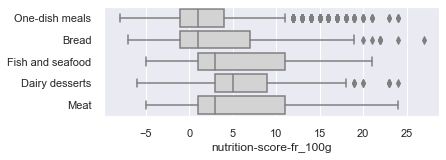

In [93]:
# Impression des principaux indicateurs statistiques. 
sim_pnns2_groups = ['Bread', 'Dairy desserts', 'One-dish meals', 'Fish and seafood', 'Meat']
df_ = df[df['pnns_groups_2'].isin(sim_pnns2_groups)][quant_cols+['pnns_groups_2']]

def quant_0_25(x): return np.quantile(x,q=0.25)
def quant_0_75(x): return np.quantile(x,q=0.75)

display(df.groupby('pnns_groups_2')['nutrition-score-fr_100g'].agg(['mean', quant_0_25, np.median,
                                       quant_0_75, np.std]).loc[sim_pnns2_groups])

# Tracer des boîtes à moustaches des nutriscores de pnns2 sélectionnés.

sns.boxplot(data=df_, y='pnns_groups_2', x='nutrition-score-fr_100g', color='lightgrey', orient='h')
plt.gcf().set_size_inches(6,2), plt.ylabel('');
#if plot_enabled: plt.savefig(os.getcwd()+'/FIG/'+'A_3_1_pnns2_compar_box.png',
#                             dpi=400);
plt.savefig('GRAPHS/graph_exploration/54- Nutri_num6')
plt.show()

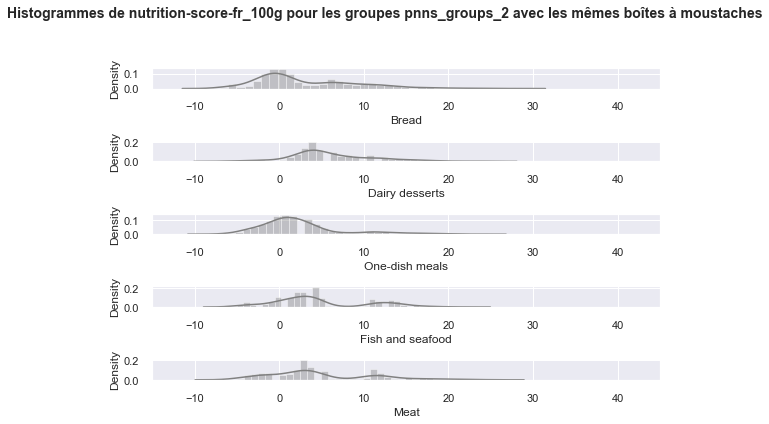

In [94]:
# Voyons plus en détail si la répartition de leur nutriscore est vraiment similaire.
# Sélection de la série nutriscore des catégories pnns2 à comparer.

gb = df.groupby('pnns_groups_2')['nutrition-score-fr_100g']
sim_gr_nutri = pd.DataFrame([gb.get_group(n).values for n in sim_pnns2_groups],
                            index = sim_pnns2_groups).T

# Tracer l'histogramme pour chaque catégorie.

fig = plt.figure(figsize=(8,6))
for i, c in enumerate(sim_pnns2_groups,1):
    ax = fig.add_subplot(5,1,i)
    # plt.hist(sim_gr_nutri[c], color='b', bins=35)
    sns.distplot(sim_gr_nutri[c], color='grey', bins=35)
    ax.set(xlim=(-15,45))
fig.suptitle('Histogrammes de nutrition-score-fr_100g pour les groupes pnns_groups_2 avec les mêmes boîtes à moustaches',
             fontweight='bold', fontsize=14)
plt.tight_layout(rect=[0,0.0,1,0.93])
#if plot_enabled: plt.savefig(os.getcwd()+'/FIG/'+'A_3_1_pnns2_compar_hist.png',
#                             dpi=400);
plt.show()

In [95]:
# En effet, certaines distributions se ressemblent beaucoup. Voyons si les tests ANOVA et Kruskal-Wallis valident cette intuition.
# Résultats (p-value, même distr ou non) des tests ANOVA et Kruskal-Wallis
# pour les catégories 'nutriscore' par rapport aux catégories 'pnns2' choisies.
id_distr_pnns2_sel = mult_test(df_, C_col='pnns_groups_2',test_func='id_dist', print_opt=False)
id_distr_pnns2_sel

,nutrition-score-fr_100g,energy_100g,fat_100g,carbohydrates_100g,proteins_100g,saturated-fat_100g,sugars_100g,fiber_100g,salt_100g,sodium_100g
ANOVA,"(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')"
Kruskal-Wallis,"(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')"


In [96]:
# Contrairement à l'intuition, les tests indiquent que la distribution d'aucune des variables quantitatives des cinq catégories choisies ne peut être considérée comme similaire.
# Voyons si au moins deux des catégories parmi les cinq ont la même distribution :
# Impression du résultat du test ANOVA et Kruskal pour toutes les combinaisons
# de 2 groupes dans les groupes pnns2 sélectionnés.

In [97]:
tab = []
for c1 in sim_pnns2_groups:
    for c2 in [c for c in sim_pnns2_groups if c!=c1]:
        couple = [c1,c2]
        if [c2,c1] not in tab:
            print('\nXXXXXXX---',str(couple).upper(), '---XXXXXXX')
            df__ = df[df['pnns_groups_2'].isin(couple)][quant_cols+['pnns_groups_2']]
            id_cat_distrib_tests(df__, Q_col='nutrition-score-fr_100g', C_col='pnns_groups_2', print_opt=True)
            tab.append(couple)


XXXXXXX--- ['BREAD', 'DAIRY DESSERTS'] ---XXXXXXX
oooooooo- nutrition-score-fr_100g vs. pnns_groups_2 -oooooooo
---ANOVA---
stat=121.730, p=0.0000000000
Prob. different distr
---Kruskal-Wallis---
stat=160.156, p=0.0000000000
Prob. different distr

XXXXXXX--- ['BREAD', 'ONE-DISH MEALS'] ---XXXXXXX
oooooooo- nutrition-score-fr_100g vs. pnns_groups_2 -oooooooo
---ANOVA---
stat=15.755, p=0.0000731937
Prob. different distr
---Kruskal-Wallis---
stat=0.633, p=0.4262530968
Prob. same distr

XXXXXXX--- ['BREAD', 'FISH AND SEAFOOD'] ---XXXXXXX
oooooooo- nutrition-score-fr_100g vs. pnns_groups_2 -oooooooo
---ANOVA---
stat=50.321, p=0.0000000000
Prob. different distr
---Kruskal-Wallis---
stat=84.543, p=0.0000000000
Prob. different distr

XXXXXXX--- ['BREAD', 'MEAT'] ---XXXXXXX
oooooooo- nutrition-score-fr_100g vs. pnns_groups_2 -oooooooo
---ANOVA---
stat=31.033, p=0.0000000297
Prob. different distr
---Kruskal-Wallis---
stat=39.610, p=0.0000000003
Prob. different distr

XXXXXXX--- ['DAIRY DESSERTS

In [98]:
# Selon l'ANOVA, « poisson et fruits de mer » et « viande » est le seul couple qui peut avoir une distribution similaire des nutriscores, alors que le test de Kruskal-WAllis indique que les catégories « plat unique » et « poissons et fruits de mer » peuvent avoir la même distributions.
# La répartition bimodale à la fois des « poissons et fruits de mer » et de la « viande » est assez surprenante et renforce l'idée que ces deux catégories peuvent être identiques.
# Traçons la distribution des autres données quantitatives pour « poissons et fruits de mer » et « viande » à l'aide d'un graphique en violon :
# Sélection d'un sous-ensemble de données avec uniquement "poissons et fruits de mer" et "viande".

df_ = df[df['pnns_groups_2'].isin(['Fish and seafood', 'Meat'])][quant_cols+['pnns_groups_2']]
df_.sample(3)

,nutrition-score-fr_100g,energy_100g,fat_100g,carbohydrates_100g,proteins_100g,saturated-fat_100g,sugars_100g,fiber_100g,salt_100g,sodium_100g,pnns_groups_2
16374,-5.0,291.0,0.5,0.00,16.0,0.20,0.00,1.366667,0.2000,0.07874,Fish and seafood
23591,3.0,829.0,10.0,0.00,27.0,1.60,0.00,0.000000,1.2192,0.48000,Fish and seafood
4881,14.0,835.0,12.0,0.51,22.4,2.71,0.44,0.000000,2.5400,1.00000,Fish and seafood


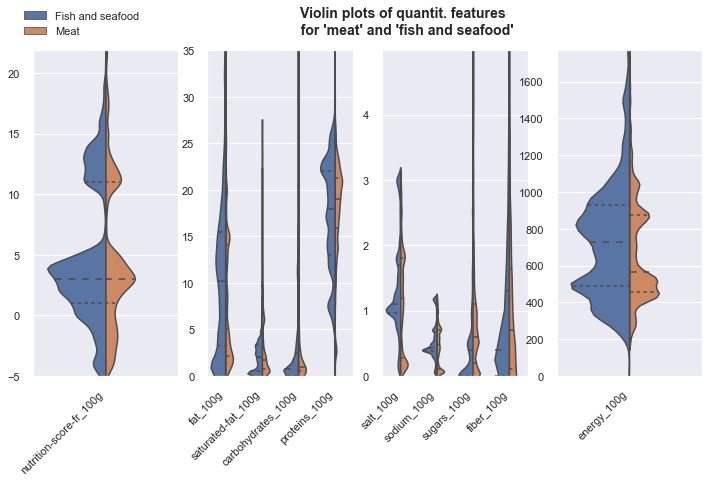

In [100]:
# Tracer les distributions d'autres caractéristiques quantitatives:
# pour 'viande' et 'poissons et fruits de mer' 

fig = plt.figure(figsize=(12,6))

cols0 = ['nutrition-score-fr_100g']
cols1 = ['fat_100g','saturated-fat_100g', 'carbohydrates_100g', 'proteins_100g']
cols2 = ['salt_100g', 'sodium_100g', 'sugars_100g', 'fiber_100g']
cols3 = ['energy_100g']


for i, c_sel in enumerate([cols0, cols1, cols2, cols3],1):
    df__ = df_[c_sel+['pnns_groups_2']]
    df__ = df__.melt(id_vars=['pnns_groups_2'] , var_name='quant_var',
                    value_vars=c_sel, value_name='value_100g' )
    ax = fig.add_subplot(1,4,i)
    sns.violinplot(data=df__, y='value_100g', x='quant_var', inner='quartile',
                hue='pnns_groups_2', split=True, scale='count',  bw=0.1, orient='v', ax=ax)

    v_min = df__['value_100g'].min()
    v_max = df__['value_100g'].mean()+3*df__['value_100g'].std()
    
    plt.gca().set(ylim=(v_min, v_max))
    plt.xticks(rotation=45, ha='right')
    ax.get_legend().remove()
    plt.ylabel(''), plt.xlabel('')
plt.legend(bbox_to_anchor=(-2.8,1.15))

fig.suptitle("                        Violin plots of quantit. features\n         \
                 for 'meat' and 'fish and seafood'",
             fontweight='bold', fontsize=14)
#if plot_enabled: plt.savefig(os.getcwd()+'/FIG/'+'A_3_1_meat_fish_violin.png',
#                             dpi=400);
plt.tight_layout(rect=[0,0.5,1,0.95], w_pad=0.5)
plt.savefig('GRAPHS/graph_exploration/55- Nutri_num7')
plt.show()

In [101]:
# Nous voyons à partir de ce diagramme de violon que les distributions des autres caractéristiques quantitatives sont assez similaires.

In [102]:
# Tests ANOVA et Kruskal-Wallis.
id_distr_pnns2_sel = mult_test(df_, C_col='pnns_groups_2',test_func='id_dist',
                               print_opt=False)
id_distr_pnns2_sel

,nutrition-score-fr_100g,energy_100g,fat_100g,carbohydrates_100g,proteins_100g,saturated-fat_100g,sugars_100g,fiber_100g,salt_100g,sodium_100g
ANOVA,"(0.8654, 'True')","(0.0, 'False')","(0.0, 'False')","(0.0032, 'False')","(0.0043, 'False')","(0.0, 'False')","(0.0047, 'False')","(0.2141, 'True')","(0.0003, 'False')","(0.0003, 'False')"
Kruskal-Wallis,"(0.3353, 'True')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0329, 'False')","(0.0039, 'False')","(0.0, 'False')","(0.0, 'False')","(0.029, 'False')","(0.0288, 'False')"


In [103]:
# Cependant, le test statistique ne montre pas qu'en dehors du nutriscore, les distributions sont les mêmes.
# Marques et nutriscore
# Est-ce possible d'identifier des marques généralistes qui proposeraient toujours les meilleurs produits au nutriscore pour toutes les catégories ?
# Nous ferons une sélection de marques et de catégories pnns2 suffisamment représentées pour tenter de répondre à cette question (30 produits par catégorie et combinaison de marques).

In [104]:
# création de table de contingence.
X = "pnns_groups_1"
Y = "nutriscore_grade"
cont = df[[X, Y]].sample(10000).pivot_table(index=X, columns=Y, aggfunc=len).fillna(0).copy().astype(int)
cont

nutriscore_grade,A,B,C,D,E
pnns_groups_1,,,,,
Beverages,27,234,369,258,90
Cereals and potatoes,620,185,235,124,8
Composite foods,279,419,340,204,10
Fat and sauces,7,61,144,213,47
Fish Meat Eggs,91,141,327,290,126
Fruits and vegetables,176,365,111,4,1
Milk and dairy products,84,220,329,513,36
Salty snacks,6,15,97,218,64
Sugary snacks,10,58,160,599,762


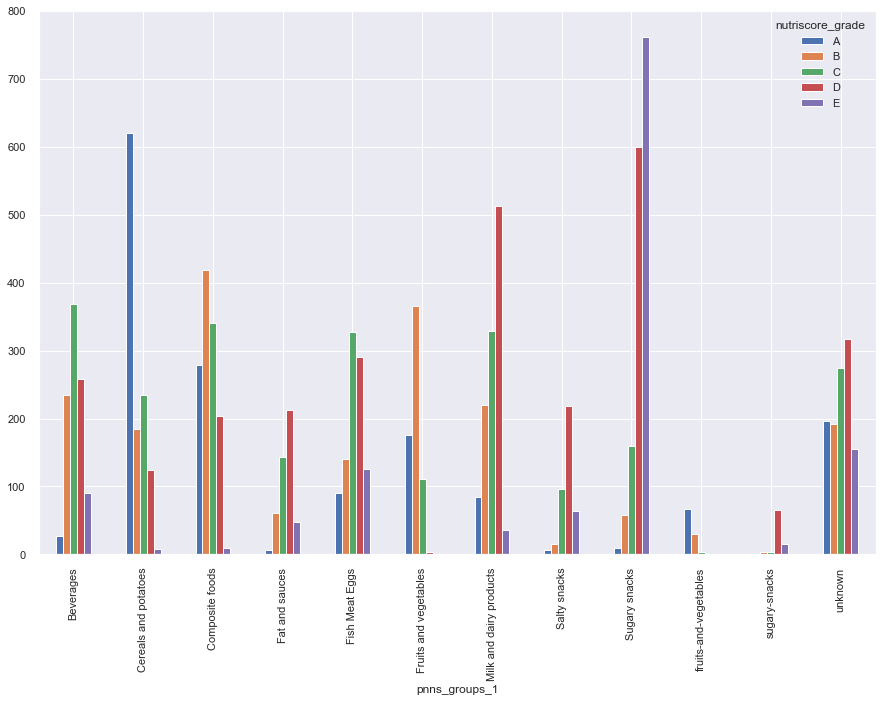

In [105]:
# Tableau de contingence en bargraphe.
cont.plot(kind='bar')
plt.savefig('GRAPHS/graph_exploration/56- Barplot')
plt.show()

In [106]:
# IV-Analyse Multivariable (ACP & KMEANS).
# Nous avons été amenés à réduire fortement le nombre de colonnes quantitatives et catégorielles lors du processus de nettoyage. Voyons si une Analyse en Composantes Principales peut nous aider :
# pour déterminer quelles colonnes sont les plus pertinentes en vue de la classification des produits
# pour créer de nouvelles fonctionnalités pertinentes à partir de fonctionnalités existantes
plot_enabled = False

In [107]:
# Préparation des données.
# Sel et sodium étant parfaitement corrélés, supprimer l'un pour la pertinence de l'analyse.
data_pca = df.select_dtypes(['float64']).drop(['sodium_100g'], axis=1).dropna()
data_pca = [c for c in data_pca]
# Echantillion
df_sample = df.loc[:, data_pca].dropna(how='any').sample(10000)
# Index des Vars retenus pour l'analyse.
id_code = df_sample.index
# Données en valeurs.
X = df_sample.values
# Nombre de composantes principales.
n_comp = len(df_sample.columns)
# Nombre d'individus (Pays) analysés.
n = df_sample.shape[0]
# Nombre de variables à étudier. 
p = df_sample.shape[1]
# Liste de variables analysées.
features = df_sample.columns
#--Data standardisation.
std_scaler = preprocessing.StandardScaler().fit(X)
X_sc = std_scaler.transform(X)

In [108]:
# IV-1 ACP.
# Instanciation de la reduction de dimension: Calcul des composantes principales.
pca = decomposition.PCA(n_components=n_comp)
#
pca.fit(X_sc)

PCA(n_components=9)

In [109]:
# Projecting X on principal components
X_proj = pca.transform(X_sc)

In [110]:
# Vérification des moyennes (aux erreurs de troncature près) et des écarts-type unitaires.
print(np.mean(X_sc, axis=0), np.std(X_sc, axis=0))

[ 7.88702437e-17  0.00000000e+00  5.11590770e-17  6.39488462e-18
 -1.37134748e-16 -6.18172180e-17  5.64881475e-17  9.37916411e-17
  4.68958206e-17] [1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [111]:
# Variance expliquée corrigée.
eigval= (n-1)/n*pca.explained_variance_
# Visualisation
eigval

array([3.3071995 , 2.13788438, 1.2583653 , 0.81540115, 0.578361  ,
       0.48574384, 0.2699837 , 0.123384  , 0.02367713])

In [112]:
# Proportion de variance expliquée.
prop_var = pca.explained_variance_ratio_ * 100
# Visualisation.
np.around(prop_var, 1)

array([36.7, 23.8, 14. ,  9.1,  6.4,  5.4,  3. ,  1.4,  0.3])

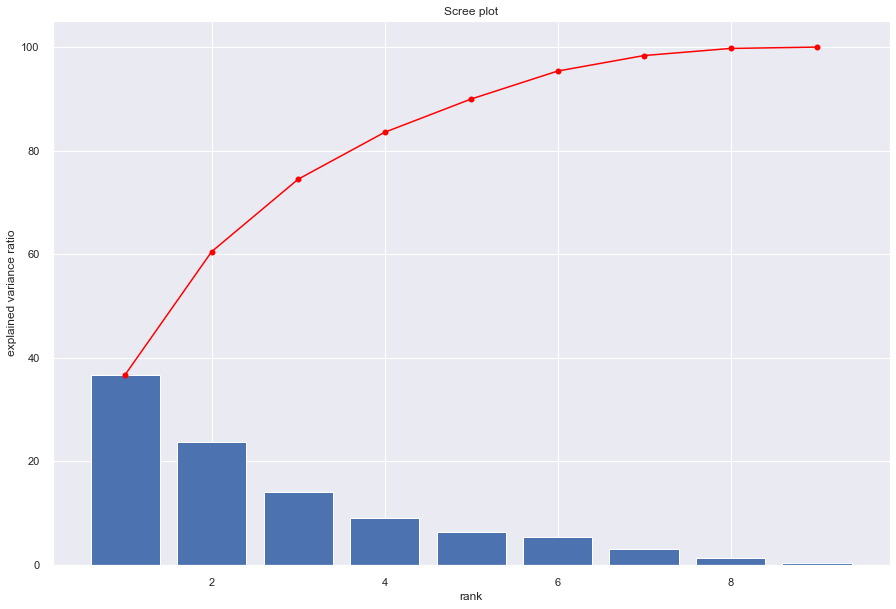

<Figure size 1080x720 with 0 Axes>

[36.7 23.8 14.   9.1  6.4  5.4  3.   1.4  0.3]


In [113]:
# Affichage des éboulis des valeurs propres.
display_scree_plot(pca)
plt.savefig('GRAPHS/graph_exploration/57- Eboulis')
plt.show()
# Edition.
print(np.around(prop_var, 1))

In [114]:
# Racine carrée des valeurs propres.
sqrt_eigval = np.sqrt(eigval)
# Visualisation.
sqrt_eigval

array([1.81857073, 1.4621506 , 1.12176883, 0.90299565, 0.76050049,
       0.69695326, 0.51959956, 0.35126059, 0.15387375])

In [115]:
# Corrélation des variables avec les axes
covar = np.zeros((p,p))
for k in range(p):
    covar[:,k] = pca.components_[k,:] * sqrt_eigval[k]
    
mat_cor = pd.DataFrame(np.around(covar, 2),
                       index=features,
                       columns=['COR_'+str(i + 1) for i in range(p)])
mat_cor

,COR_1,COR_2,COR_3,COR_4,COR_5,COR_6,COR_7,COR_8,COR_9
nutrition-score-fr_100g,0.84,-0.03,-0.34,-0.14,0.25,0.20,0.00,-0.24,0.00
energy_100g,0.91,-0.12,0.23,0.01,-0.13,-0.26,-0.04,-0.00,-0.11
fat_100g,0.79,0.34,-0.12,0.35,-0.03,-0.25,-0.24,0.03,0.08
saturated-fat_100g,0.78,0.27,-0.24,0.26,-0.12,0.25,0.31,0.13,0.00
carbohydrates_100g,0.46,-0.68,0.35,-0.29,-0.08,-0.23,0.22,-0.02,0.07
sugars_100g,0.43,-0.76,-0.13,-0.23,0.05,0.28,-0.23,0.17,0.00
fiber_100g,0.14,-0.13,0.81,0.41,0.30,0.21,-0.01,-0.02,0.00
proteins_100g,0.24,0.61,0.45,-0.33,-0.42,0.26,-0.10,-0.04,0.02
salt_100g,0.25,0.71,0.13,-0.44,0.45,-0.11,0.03,0.12,0.00


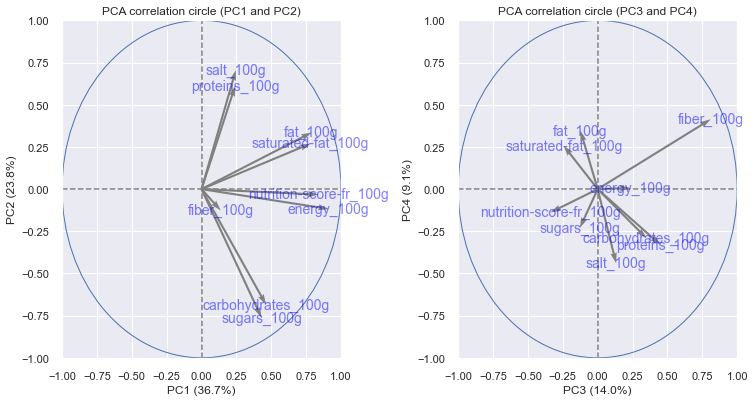

<Figure size 1080x720 with 0 Axes>

In [119]:
# Contribution des variables aux composantes principales.
pcs = pca.components_
display_circles(covar.T, n_comp, pca,
                [(0,1), (2,3)],
                labels = df_sample.columns)
plt.savefig('GRAPHS/graph_exploration/58- PCA')
plt.show()

In [120]:
# Contribution des individus dans l'inertie total.

di = np.sum(X_sc**2, axis=1)
ctr_tot = pd.DataFrame({'ID':id_code, 'd_i': np.around(di, 2)})

ctr_tot.describe()

,ID,d_i
count,10000.000000,10000.000000
mean,18166.301600,9.000000
std,10571.574405,11.457565
min,4.000000,0.590000
25%,8976.750000,4.280000
50%,18186.500000,6.290000
75%,27332.250000,10.490000
max,36579.000000,439.250000


In [121]:
# 5.2.3 Qualité de représentation de la réduction de dimension (COS² et CTR)¶
# 5.2.3.1 Calcul de la qualité de représentation des variables (COS²)
# On calcule la qualité de représentation des variables (COS²) en élevant la corrélation au carré.
#Espace des composantes principales
pcs = pca.components_

#Matrice des corrélations variables x facteurs
p = df_sample.shape[1]
sqrt_valprop = np.sqrt(pca.explained_variance_)
corvar = np.zeros((p, p))
for dim in range(p):
    corvar[:,dim] = pcs[dim,:] * sqrt_valprop[dim]

#on affiche pour les deux premiers plans factoriels 
corr_matrix = pd.DataFrame({'feature':features,'CORR_F1':corvar[:,0],'CORR_F2':corvar[:,1], 
              'CORR_F3':corvar[:,2], 'CORR_F4':corvar[:,3]})
corr_matrix

,feature,CORR_F1,CORR_F2,CORR_F3,CORR_F4
0,nutrition-score-fr_100g,0.839958,-0.032445,-0.338475,-0.138308
1,energy_100g,0.911619,-0.117471,0.234018,0.006409
2,fat_100g,0.789172,0.335690,-0.123223,0.345826
3,saturated-fat_100g,0.782102,0.270097,-0.243547,0.257326
4,carbohydrates_100g,0.462261,-0.684883,0.349544,-0.290803
5,sugars_100g,0.430618,-0.762727,-0.127870,-0.229658
6,fiber_100g,0.137481,-0.126266,0.810406,0.414016
7,proteins_100g,0.240931,0.611100,0.449312,-0.329747
8,salt_100g,0.245786,0.705268,0.132253,-0.439373


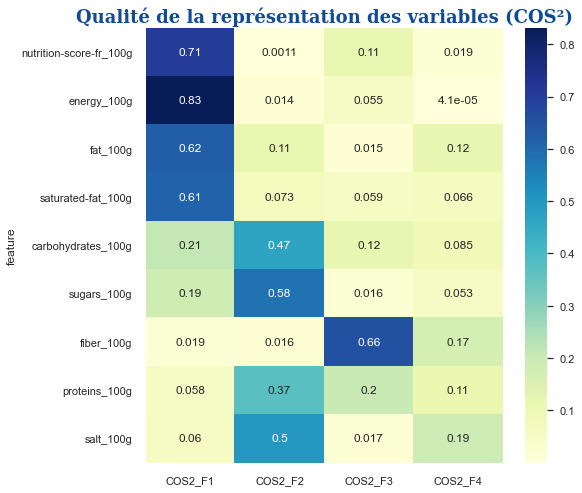

In [122]:
font_title = {'family': 'serif',
              'color':  '#114b98',
              'weight': 'bold',
              'size': 18,
             }

# Calcul des COS²
cos2var = corvar**2
df_cos2var = pd.DataFrame({'feature':features,'COS2_F1':cos2var[:,0],
                           'COS2_F2':cos2var[:,1], 'COS2_F3':cos2var[:,2],
                           'COS2_F4':cos2var[:,3]}).set_index('feature')

# Affichage dans un heatmap seaborn
fig = plt.figure(figsize=(8,8))
sns.heatmap(df_cos2var, annot=True, cmap="YlGnBu")
plt.title("Qualité de la représentation des variables (COS²)", fontdict=font_title)
plt.savefig('GRAPHS/graph_exploration/59- COS2')
plt.show()

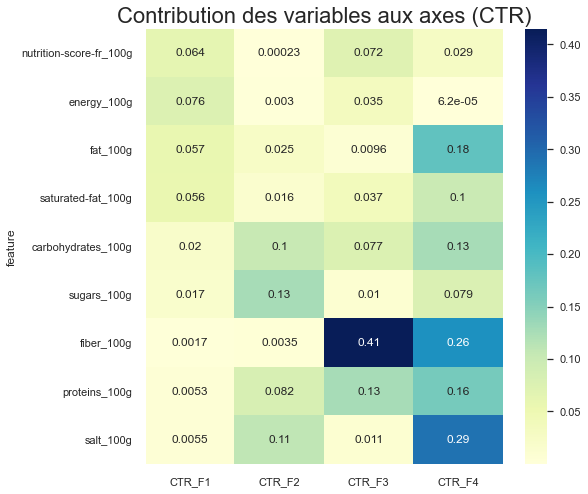

In [124]:
# 5.2.3.2 Contribution des variables aux axes (CTR).
# La CTR aussi également basée sur le carré de la corrélation, mais relativisée par l’importance de l’axe.
# Contribution des variables aux axes (CTR) 
ctrvar = cos2var 
for k in range(p): 
    ctrvar[:,k] = ctrvar[:,k]/pca.explained_variance_[k] 

df_ctrvar = pd.DataFrame({'feature':features,'CTR_F1':ctrvar[:,0],'CTR_F2':ctrvar[:,1],
                         'CTR_F3':ctrvar[:,2], 'CTR_F4':ctrvar[:,3]}).set_index('feature')

#affichage dans un heatmap seaborn
fig = plt.figure(figsize=(8,8))
sns.heatmap(df_ctrvar, annot=True, cmap="YlGnBu")
plt.title("Contribution des variables aux axes (CTR)", fontsize=22)
plt.savefig('GRAPHS/graph_exploration/60- CTR')
plt.show()


In [125]:
# Calcul des coordonnées des individus sur le premier plan factoriel.
id_code_samp = pd.Series(id_code).sample(300)
X_samp = df.loc[id_code_samp, data_pca].values
X_sc_samp = StandardScaler().fit_transform(X_samp)

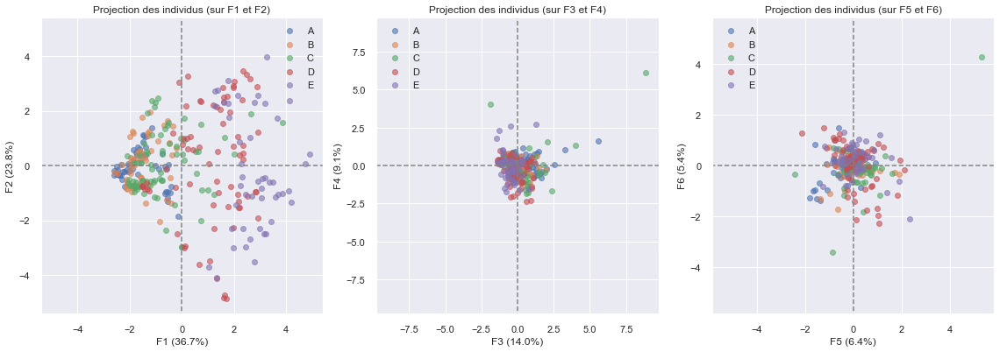

In [126]:
display_factorial_planes(pca.transform(X_sc_samp), n_comp, pca, [(0,1),(2,3),(4,5)],
                         n_cols=3, labels=np.array(id_code_samp),
                         illus_var= df.loc[id_code_samp, 'nutriscore_grade'],
                         lab_on=False, alpha=0.6)
#if plot_enabled: plt.savefig(os.getcwd()+'/FIG/'+'A_3_1_factor_planes1.png',
#                             dpi=400);
plt.savefig('GRAPHS/graph_exploration/61- F1_F2_F3')
plt.show()

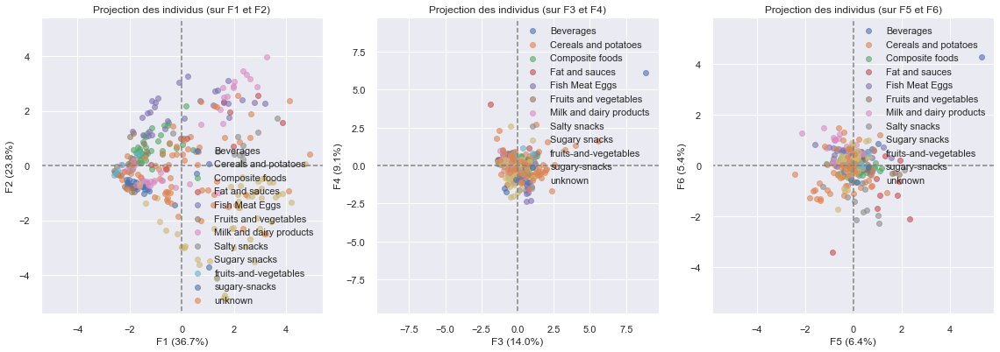

In [127]:
display_factorial_planes(pca.transform(X_sc_samp), n_comp, pca, [(0,1),(2,3),(4,5)],
                         n_cols=3, labels=np.array(id_code_samp),
                         illus_var= df.loc[id_code_samp, 'pnns_groups_1'],
                         lab_on=False, alpha=0.6)
#if plot_enabled: plt.savefig(os.getcwd()+'/FIG/'+'A_3_1_factor_planes2.png',
#                             dpi=400);
plt.savefig('GRAPHS/graph_exploration/62- F1_F2_F3_pnns_groups_1')
plt.show()
plt.show()

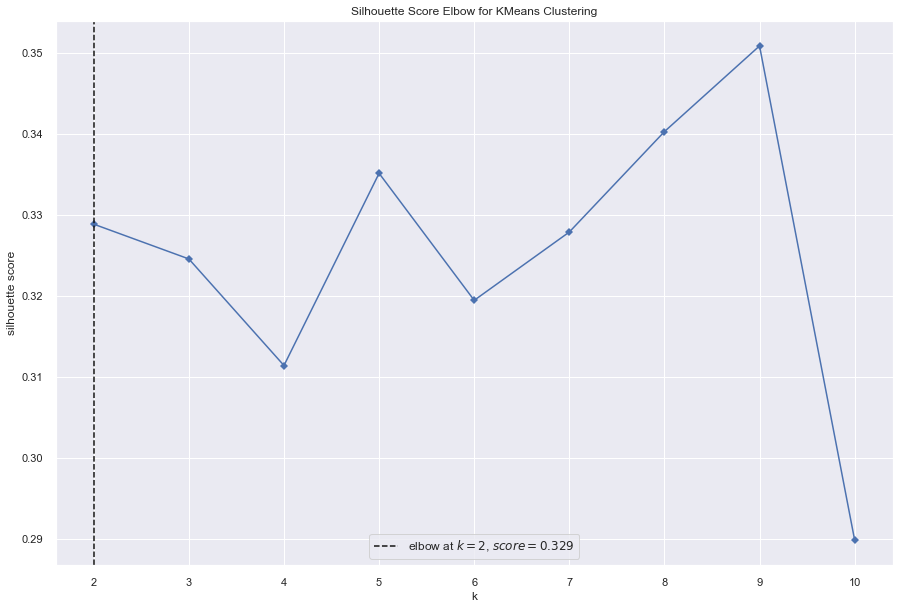

<Figure size 1080x720 with 0 Axes>

In [129]:
# Clustering k-means.
#  La méthode du coefficient de Silhouette pour déterminer le nombre de clusters. 
cls = KMeans(random_state=98)
visualizer = KElbowVisualizer(cls, k=(2,11), metric='silhouette', timings=False)
visualizer.fit(X_sc) 
plt.xticks(range(2,11))
visualizer.show()
plt.savefig('GRAPHS/graph_exploration/63-Silhouette')
plt.show()

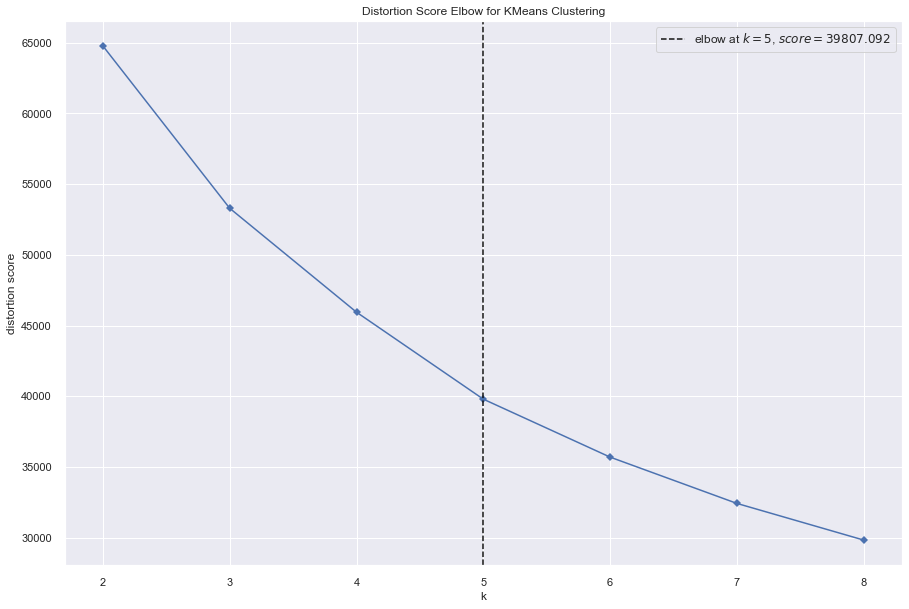

<Figure size 1080x720 with 0 Axes>

In [130]:
# II-4-2-2 La Méthode du coude pour déterminer le nombre de clusters.
visualizer = KElbowVisualizer(cls, k=(2,9), timings=False)
visualizer.fit(X_sc)
plt.xticks(range(2,9))
visualizer.show()
plt.savefig('GRAPHS/graph_exploration/64-Coude.png')
plt.show()

In [131]:
# II-4-2-3 Nombre de Clusters Optimal.
# II-4-2-3-1 Application de l'algorithme du KMEANS à l'ensemble de données:n_clusters = 2.
kmeans = KMeans(n_clusters = 2, init = 'k-means++', random_state = 42)
# Prédiction des clusters pour chacun des éléments de données.
y_kmeans2 = kmeans.fit_predict(X_sc)
# Visualisation des prédictions des clusters.
y_kmeans2

array([1, 1, 1, ..., 1, 1, 0])

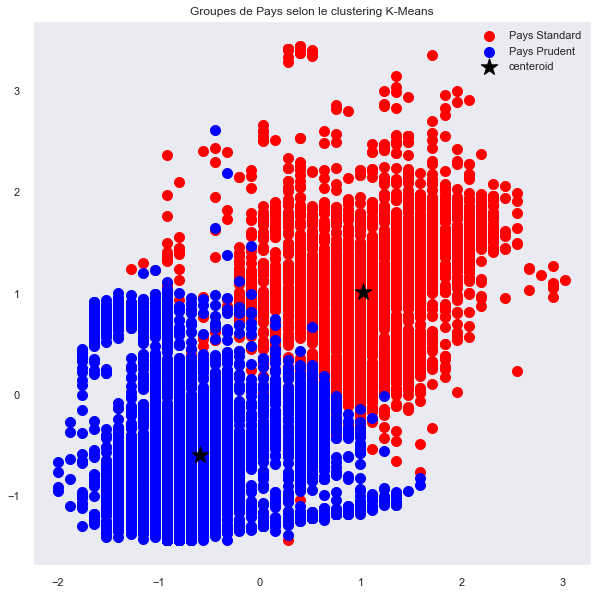

In [133]:
# II-4-2-3-2 Visualisation des résultats à travers le graphique.
# Donner une couleur et un nom uniques à chaque cluster pour une meilleure représentation .
plt.figure(figsize=(10,10)) 
plt.scatter(X_sc[y_kmeans2 == 0, 0], X_sc[y_kmeans2 == 0, 1], s = 100, c = 'red', label = 'Pays Standard') 
plt.scatter(X_sc[y_kmeans2 == 1, 0], X_sc[y_kmeans2 == 1, 1], s = 100, c = 'blue', label = 'Pays Prudent') 
plt.scatter(kmeans.cluster_centers_[:,0], kmeans.cluster_centers_[:, 1], marker='*', s = 300, c = 'black' , label = 'centeroid')
plt.title('Groupes de Pays selon le clustering K-Means') 
plt.legend()
plt.grid()
plt.savefig('GRAPHS/graph_exploration/65-Clusters2.png')
plt.show()

In [134]:
# II-4-2-3 Nombre de Clusters Optimal.
# II-4-2-3-1 Application de l'algorithme du KMEANS à l'ensemble de données:n_clusters = 3.
kmeans = KMeans(n_clusters = 3, init = 'k-means++', random_state = 42)
# Prédiction des clusters pour chacun des éléments de données.
y_kmeans3 = kmeans.fit_predict(X_sc)
# Visualisation des prédictions des clusters.
y_kmeans3

array([0, 0, 0, ..., 0, 0, 1])

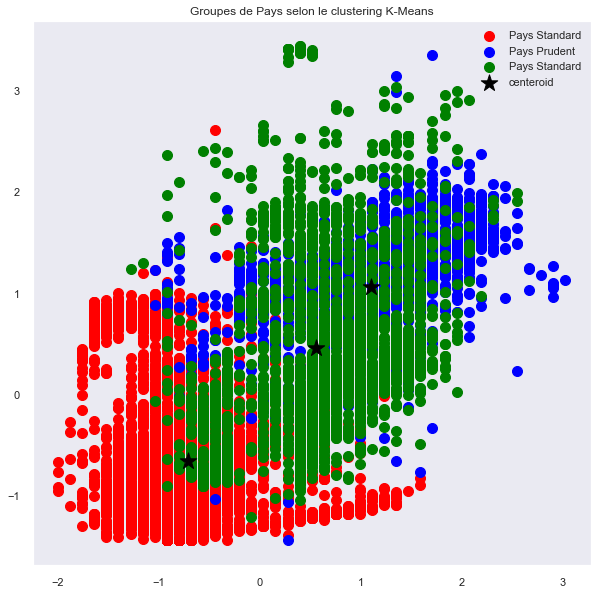

In [135]:
# II-4-2-3-2 Visualisation des résultats à travers le graphique.
# Donner une couleur et un nom uniques à chaque cluster pour une meilleure représentation .
plt.figure(figsize=(10,10)) 
plt.scatter(X_sc[y_kmeans3 == 0, 0], X_sc[y_kmeans3 == 0, 1], s = 100, c = 'red', label = 'Pays Standard') 
plt.scatter(X_sc[y_kmeans3 == 1, 0], X_sc[y_kmeans3 == 1, 1], s = 100, c = 'blue', label = 'Pays Prudent') 
plt.scatter(X_sc[y_kmeans3 == 2, 0], X_sc[y_kmeans3 == 2, 1], s = 100, c = 'green', label = 'Pays Standard') 
plt.scatter(kmeans.cluster_centers_[:,0], kmeans.cluster_centers_[:, 1], marker='*', s = 300, c = 'black' , label = 'centeroid')
plt.title('Groupes de Pays selon le clustering K-Means') 
plt.legend()
plt.grid()
plt.savefig('GRAPHS/graph_exploration/66-Clusters3.png')
plt.show()

In [136]:
# II-4-2-3-3 Application de l'algorithme du KMEANS à l'ensemble de données:n_clusters = 4.
kmeans = KMeans(n_clusters = 4, init = 'k-means++', random_state = 42)
# Prédiction des clusters pour chacun des éléments de données.
y_kmeans4 = kmeans.fit_predict(X_sc)
# Visualisation des prédictions des clusters.
y_kmeans4

array([1, 2, 1, ..., 1, 1, 3])

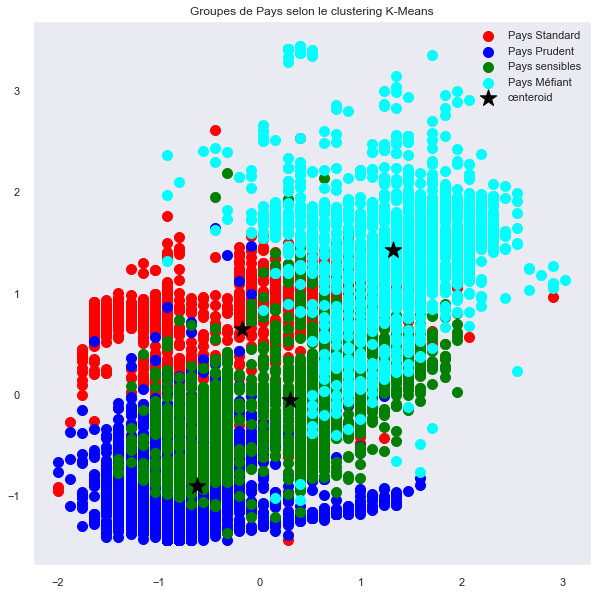

In [137]:
# II-4-2-3-4 Visualisation des résultats à travers le graphique.

# Donner une couleur et un nom uniques à chaque cluster pour une meilleure représentation .

plt.figure(figsize=(10,10)) 
plt.scatter(X_sc[y_kmeans4 == 0, 0], X_sc[y_kmeans4 == 0, 1], s = 100, c = 'red', label = 'Pays Standard') 
plt.scatter(X_sc[y_kmeans4 == 1, 0], X_sc[y_kmeans4 == 1, 1], s = 100, c = 'blue', label = 'Pays Prudent') 
plt.scatter(X_sc[y_kmeans4 == 2, 0], X_sc[y_kmeans4 == 2, 1], s = 100, c = 'green', label = 'Pays sensibles') 
plt.scatter(X_sc[y_kmeans4 == 3, 0], X_sc[y_kmeans4 == 3, 1], s = 100, c = 'cyan', label = 'Pays Méfiant') 
plt.scatter(kmeans.cluster_centers_[:,0], kmeans.cluster_centers_[:, 1], marker='*', s = 300, c = 'black' , label = 'centeroid')
plt.title('Groupes de Pays selon le clustering K-Means') 
plt.legend()
plt.grid()
plt.savefig('GRAPHS/graph_exploration/67-Clusters4.png')
plt.show()

In [138]:
# II-4-2-3-3 Application de l'algorithme du KMEANS à l'ensemble de données:n_clusters = 5.
kmeans = KMeans(n_clusters = 5, init = 'k-means++', random_state = 42)
# Prédiction des clusters pour chacun des éléments de données.
y_kmeans5 = kmeans.fit_predict(X_sc)
# Visualisation des prédictions des clusters.
y_kmeans5

array([0, 2, 0, ..., 0, 0, 4])

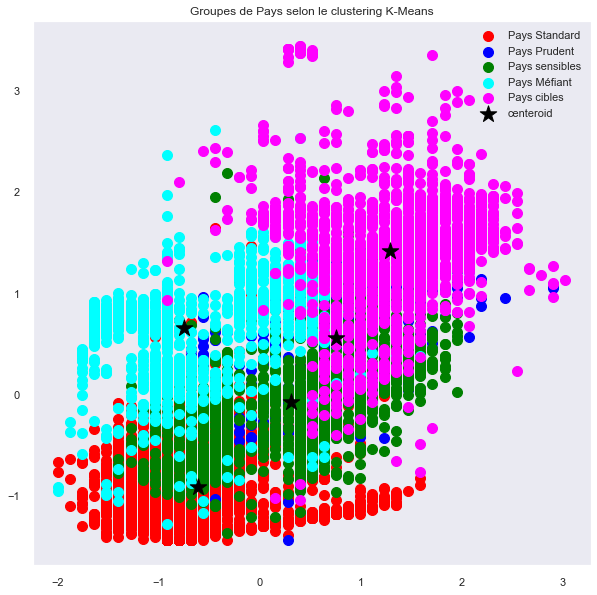

In [139]:
# II-4-2-3-4 Visualisation des résultats à travers le graphique.

# Donner une couleur et un nom uniques à chaque cluster pour une meilleure représentation .

plt.figure(figsize=(10,10)) 
plt.scatter(X_sc[y_kmeans5 == 0, 0], X_sc[y_kmeans5 == 0, 1], s = 100, c = 'red', label = 'Pays Standard') 
plt.scatter(X_sc[y_kmeans5 == 1, 0], X_sc[y_kmeans5 == 1, 1], s = 100, c = 'blue', label = 'Pays Prudent') 
plt.scatter(X_sc[y_kmeans5 == 2, 0], X_sc[y_kmeans5 == 2, 1], s = 100, c = 'green', label = 'Pays sensibles') 
plt.scatter(X_sc[y_kmeans5 == 3, 0], X_sc[y_kmeans5 == 3, 1], s = 100, c = 'cyan', label = 'Pays Méfiant') 
plt.scatter(X_sc[y_kmeans5 == 4, 0], X_sc[y_kmeans5 == 4, 1], s = 100, c = 'magenta', label = 'Pays cibles') 
plt.scatter(kmeans.cluster_centers_[:,0], kmeans.cluster_centers_[:, 1], marker='*', s = 300, c = 'black' , label = 'centeroid')
plt.title('Groupes de Pays selon le clustering K-Means') 
plt.legend()
plt.grid()
plt.savefig('GRAPHS/graph_exploration/68-Clusters5.png')
plt.show()

In [140]:
# # IV-2 Clustering KMEANS.
# Les quatre premiers CP (Composantes Principales) expliquent prêt de 85% de la variance totale. Nous allons garder ces 4 et essayer de trouver des clusters.
# KMeans Clustering
n_clust = 2
km = KMeans(n_clusters=n_clust).fit(X_proj)
clustK = km.labels_
df.loc[id_code, 'cluster_Kmeans'] = clustK

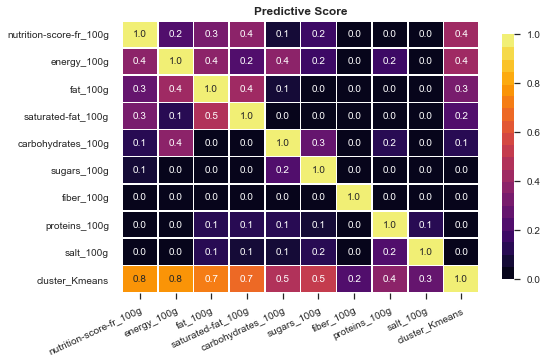

In [141]:
# Sampled Predictive Power Score (ppscore)

cols = data_pca + ['cluster_Kmeans']

pps_corr = pps.matrix(df[cols])
plot_heatmap(pps_corr, title="Predictive Score", 
             vmin=0, center=0.5, figsize=(8,5), shape='rect',
             palette=sns.color_palette("inferno", 20), fmt='.1f')
#if plot_enabled: plt.savefig(os.getcwd()+'/FIG/'+'A_4_2_ppscore_clusters.png', dpi=400);
plt.savefig('GRAPHS/graph_exploration/69-Score_Pred1.png')
plt.show()

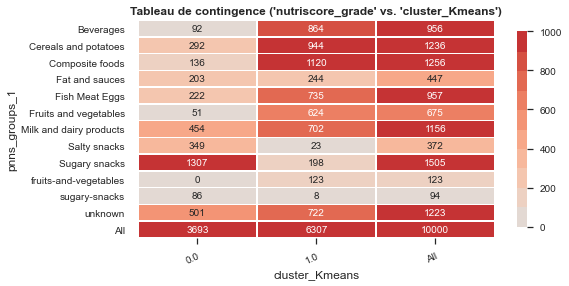

In [142]:
## Creating table of contingency

data_crosstab = pd.crosstab(df['pnns_groups_1'], 
                            df['cluster_Kmeans'],  
                               margins = True)

plot_heatmap(data_crosstab,"Tableau de contingence ('nutriscore_grade' vs. 'cluster_Kmeans')",
             vmin=0, vmax=1000, palette=sns.color_palette("coolwarm", 20),
             figsize=(8,4), shape='rect', fmt='.0f')
#if plot_enabled: plt.savefig(os.getcwd()+'/FIG/'+'A_4_2_nutrig_clusters.png', dpi=400);
plt.savefig('GRAPHS/graph_exploration/70-Tableau_ctgce4.png')
plt.show()

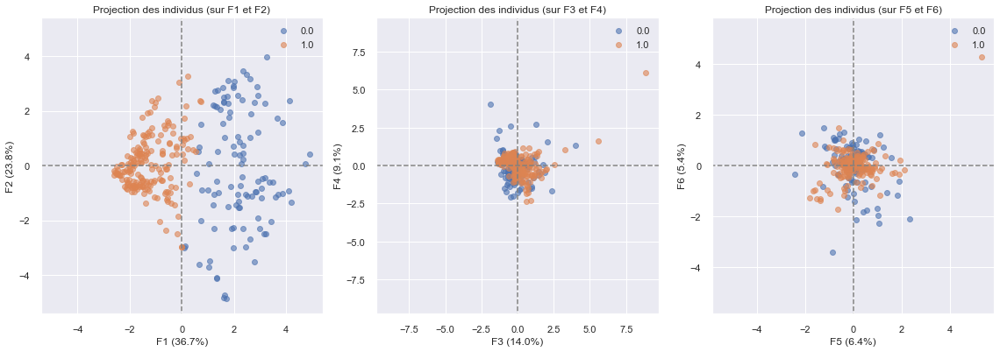

In [143]:
display_factorial_planes(pca.transform(X_sc_samp), n_comp, pca, [(0,1),(2,3),(4,5)],
                         n_cols=3, labels=np.array(id_code_samp),
                         illus_var= df.loc[id_code_samp, 'cluster_Kmeans'],
                         lab_on=False, alpha=0.6)

#if plot_enabled: plt.savefig(os.getcwd()+'/FIG/'+'A_3_1_factor_planes3.png',
#                             dpi=400);
plt.savefig('GRAPHS/graph_exploration/71-Kmeans_F1_F2_F3')
plt.show()

---Chi-squared
stat=3438.846, p=0.000
Probably dependent


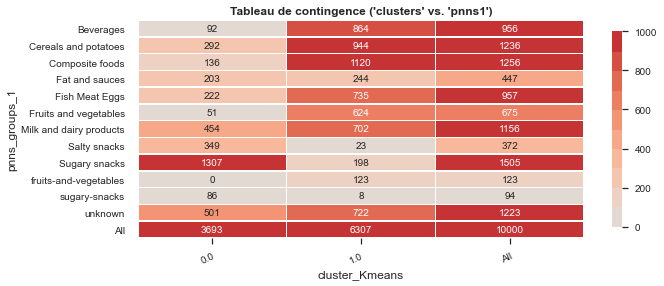

In [144]:
# Tableau de contingence montrant les catégories cluster vs pnns1.
data_crosstab = pd.crosstab(df['pnns_groups_1'], 
                            df['cluster_Kmeans'],  
                               margins = True)
# display(data_crosstab)
# Chi-Squared Test
stat, p, dof, expected = chi2_contingency(data_crosstab)
print('---'+"Chi-squared")
print('stat=%.3f, p=%.3f' % (stat, p))
print('Probably independent') if p > 0.05 else print('Probably dependent')
pca_df = pd.DataFrame(pca.components_,
                      index=['PC'+str(i+1) for i in range(n_comp)],
                      columns=data_pca).T
plot_heatmap(data_crosstab,"Tableau de contingence ('clusters' vs. 'pnns1')",
             vmin=0, vmax=1000,figsize=(10,4),shape='rect', fmt='.0f',
             palette=sns.color_palette("coolwarm", 20))
#if plot_enabled: plt.savefig(os.getcwd()+'/FIG/'+'A_4_2_cont_tabl_clust_pnns1.png',
#                             dpi=400);
plt.savefig('GRAPHS/graph_exploration/72-Tableau_ctgce5.png')
plt.show()

In [145]:
# Le cas où:
n_clust = 5
km = KMeans(n_clusters=n_clust).fit(X_proj)
clustK2 = km.labels_
df.loc[id_code, 'cluster_Kmeans'] = clustK2

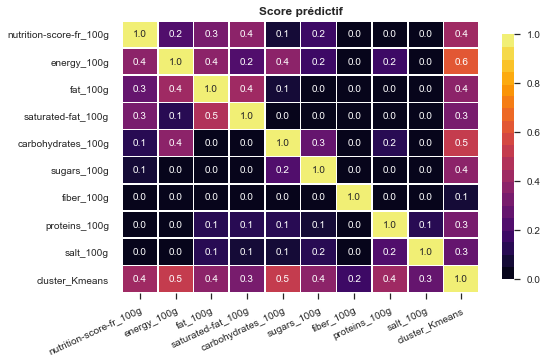

In [146]:
# # Score de puissance prédictive échantillonné (ppscore): Sampled Predictive Power Score (ppscore)

cols2 = data_pca + ['cluster_Kmeans']

pps_corr2 = pps.matrix(df[cols2])
plot_heatmap(pps_corr2, title="Score prédictif", 
             vmin=0, center=0.5, figsize=(8,5), shape='rect',
             palette=sns.color_palette("inferno", 20), fmt='.1f')
#if plot_enabled: plt.savefig(os.getcwd()+'/FIG/'+'A_4_2_ppscore_clusters.png', dpi=400);
plt.savefig('GRAPHS/graph_exploration/73-Score_Pred2.png')
plt.show()

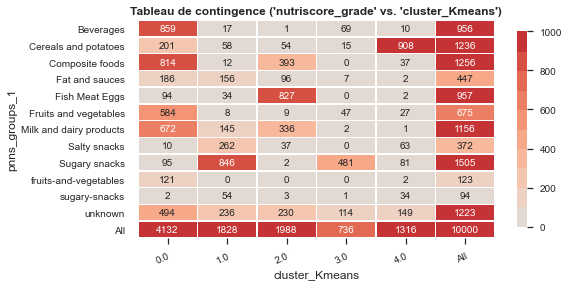

In [147]:
# Création d'un tableau de contingence.
data_crosstab2 = pd.crosstab(df['pnns_groups_1'], 
                            df['cluster_Kmeans'],  
                               margins = True)
plot_heatmap(data_crosstab2,"Tableau de contingence ('nutriscore_grade' vs. 'cluster_Kmeans')",
             vmin=0, vmax=1000, palette=sns.color_palette("coolwarm", 20),
             figsize=(8,4), shape='rect', fmt='.0f')
#if plot_enabled: plt.savefig(os.getcwd()+'/FIG/'+'A_4_2_nutrig_clusters.png', dpi=400);
plt.savefig('GRAPHS/graph_exploration/74-Tableau_ctgce6.png')
plt.show()

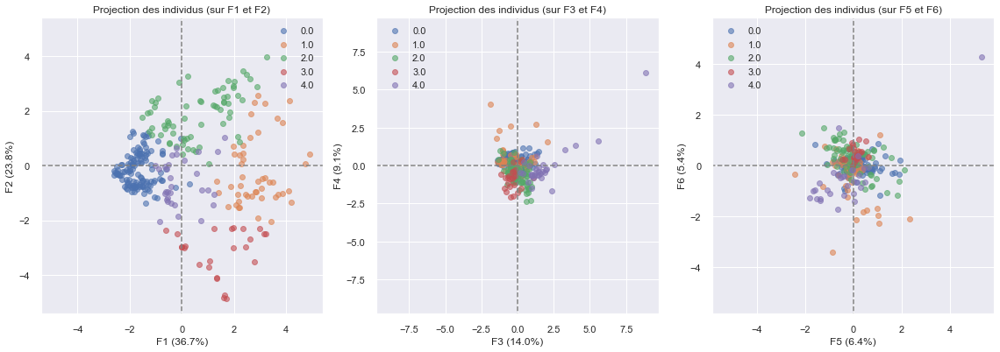

In [148]:
display_factorial_planes(pca.transform(X_sc_samp), n_comp, pca, [(0,1),(2,3),(4,5)],
                         n_cols=3, labels=np.array(id_code_samp),
                         illus_var= df.loc[id_code_samp, 'cluster_Kmeans'],
                         lab_on=False, alpha=0.6)

#if plot_enabled: plt.savefig(os.getcwd()+'/FIG/'+'A_3_1_factor_planes3.png',
#                             dpi=400);
plt.savefig('GRAPHS/graph_exploration/75-Kmeans2_F1_F2_F3')
plt.show()

---Chi-squared
stat=13678.093, p=0.000
Probably dependent


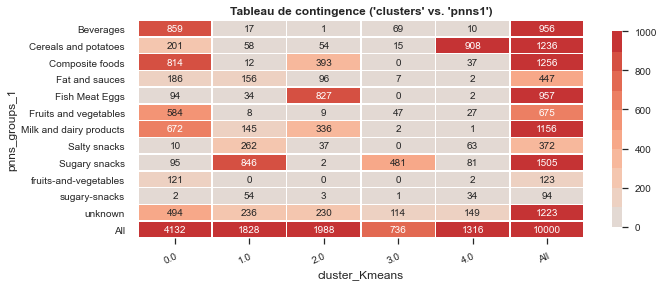

In [149]:
# Tableau de contingence montrant les catégories cluster vs pnns1.

data_crosstab2 = pd.crosstab(df['pnns_groups_1'], 
                            df['cluster_Kmeans'],  
                               margins = True)
# display(data_crosstab)

# Chi-Squared Test
from scipy.stats import chi2_contingency
stat, p, dof, expected = chi2_contingency(data_crosstab2)
print('---'+"Chi-squared")
print('stat=%.3f, p=%.3f' % (stat, p))
print('Probably independent') if p > 0.05 else print('Probably dependent')

pca_df = pd.DataFrame(pca.components_,
                      index=['PC'+str(i+1) for i in range(n_comp)],
                      columns=data_pca).T
plot_heatmap(data_crosstab2,"Tableau de contingence ('clusters' vs. 'pnns1')",
             vmin=0, vmax=1000,figsize=(10,4),shape='rect', fmt='.0f',
             palette=sns.color_palette("coolwarm", 20))
#if plot_enabled: plt.savefig(os.getcwd()+'/FIG/'+'A_4_2_cont_tabl_clust_pnns1.png',
#                             dpi=400);
plt.savefig('GRAPHS/graph_exploration/76-Tableau_ctgce7.png')
plt.show()